In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.graphics.mosaicplot import mosaic
import scipy.stats as spst
import requests
from bs4 import BeautifulSoup
import warnings
warnings.filterwarnings(action='ignore')

NASDAQ_DT_FC_STK_QUT.csv
+ 2023년 1월 1일부터 2023년 8월 31일까지 NASDAQ_FC_STK_IEM_IFO.csv에 있는 종목의 시세 정보
  + TRD_DT : 거래일자
  + TCK_IEM_CD : 티커종목코드
  + IEM_ONG_PR : 종목시가
  + IEM_HI_PR : 종목고가
  + IEM_LOW_PI : 종목저가
  + IEM_END_PR : 종목종가
  + ACL_TRD_ATY : 누적거래수량
  + SLL_CNS_SUM_QTY : 매도체결합계수량
  + BYN_CNS_SUM_QTY : 매수체결합계수량

# S&P500 크롤링으로 뽑아오기
+ 주식 수 503개
+ Sector
  + XLC : Communication Services
    + 통신서비스에 관련한 회사 모음
  + XLY : Consumer Discretionary
    + 사치재, 소득의 여유가 있다면 소비하고 싶어하고 소비하는 것들에 대한 회사들의 모음
  + XLP : Consumer Staples
    + 필수 소비재, 필수적으로 소비해야 하는 것들의 판매하는 회사
  + XLE : Energy
    + 에너지 관련 회사들이 속해 있는 섹터
  + XLF : Financials
    + 금융, 금융회사들이 속해 있는 섹터
  + XLV : Health Care
    + 헬스케어 관련한 회사
  + XLI : Industrials
    + 제조업, 제조업군에 속하는 회사
  + XLB : Materials
    + 자재, 원료업, 자재나 원료를 만드는 회사
  + XLRE : Real Estate
    + 부동산, 부동산업 관련 회사
  + XLk : Technology
    + 기술, 기술회사들이 있는 섹터
  + XLU : Utility
    + 기반사업(공익사업), 전기, 수도 등의 회사

## 1. S&P 500 크롤링

In [3]:
def sector_find():
    url = 'https://www.sectorspdrs.com/api/sectors'
    response = requests.get(url)
    # 섹터 이름
    sector_list = []
    # 섹터에 대한 설명
    sector_list_info = []

    for r in response.json():
        sector_list.append(r['symbol'])
        sector_list_info.append(r['name'])

    for index, target in enumerate(sector_list):
        url = f'https://www.sectorspdrs.com/api/cms/sector-overview?period=1D&symbol={target}'
        response = requests.get(url)
        temp = response.json()['components']
        comp_name = []
        comp_ticker = []
        for t in temp:
            comp_name.append(t['companyName'])
            comp_ticker.append(t['symbol'])

        s_n = [sector_list[index]]*len(comp_name)
        s_t = [sector_list_info[index]]*len(comp_name)
        d = dict()
        d['sector_name'] = s_n
        d['sector_ticker'] = s_t
        d['comanpy_name'] = comp_name
        d['tck_iem_cd'] = comp_ticker
        df = pd.DataFrame(d)
        if index == 0:
            result = df.copy()
        else:
            result = pd.concat([result, df], axis=0, join='inner')

    return result

In [4]:
sector_info = sector_find()
sector_info = sector_info.reset_index(drop=True)
display(sector_info.shape)
display(sector_info.tail())

(503, 4)

,sector_name,sector_ticker,comanpy_name,tck_iem_cd
498,XLU,Utilities,Centerpoint Energy Inc,CNP
499,XLU,Utilities,Entergy Corp,ETR
500,XLU,Utilities,American Water Works Co Inc,AWK
501,XLU,Utilities,NRG Energy,NRG
502,XLU,Utilities,Constellation Energy Corp,CEG


## 2. ticker_info와 합치기

NASDAQ_FC_STK_IEM_IFO.csv
+ 2023년 1월 1일 부터 2023년 8월 31일까지 미국 나스닥 거래소에서 시세를 제공하는 주문 가능한 종목 정보
  + ISIN_IEM_CD : ISIN 코드
  + TCK_IEM_CD : 종목 티커 코드
  + FC_SEC_KRL_NM : 해외주식 종목 한글명
  + FC_SEC_ENG_NM : 해외주식 종목 영문명

### 폴더 위치
현재 NASDAQ_FC_STK_TEM_IFO.csv는 /content/drive/MyDrive/nh 폴더 내부에 존재

In [5]:
ticker_info = pd.read_csv('/content/drive/MyDrive/nh/NASDAQ_FC_STK_IEM_IFO.csv', encoding='cp949')

In [6]:
def delete_blank(data):
  return data.strip()

In [7]:
temp = ticker_info['tck_iem_cd'].apply(delete_blank)

In [8]:
ticker_info['tck_iem_cd'] = temp

In [9]:
test = pd.merge(sector_info, ticker_info, how = 'inner', on = 'tck_iem_cd')

# 모든 테이블 합친 후 11개의 Sector를 나눠서 시가, 종가 등 파악하기

## 테이블 합치기


### 폴더 위치
현재 NASDAQ_DT_FC_STK_QUT.csv는 구글 드라이브에서  /content/drive/MyDrive/nh 폴더 내부에 존재

In [10]:
nasdaq_info = pd.read_csv('/content/drive/MyDrive/nh/NASDAQ_DT_FC_STK_QUT.csv')
nasdaq_info.head()

,trd_dt,tck_iem_cd,gts_iem_ong_pr,gts_iem_hi_pr,gts_iem_low_pr,gts_iem_end_pr,gts_acl_trd_qty,gts_sll_cns_sum_qty,gts_byn_cns_sum_qty
0,20230103,NVDA,148.5100,149.9600,140.9600,143.1500,40127658.0,0.0,0.0
1,20230103,APLT,0.7535,0.7900,0.7308,0.7522,63714.0,19658.0,44056.0
2,20230103,ANY,1.8900,2.0293,1.8354,1.9600,24896.4,0.0,0.0
3,20230103,CLRB,1.6600,1.7200,1.6300,1.6300,21212.0,16444.0,4768.0
4,20230103,NYMTM,18.4300,18.7400,18.4300,18.7000,8061.0,0.0,0.0


In [11]:
nasdaq_info['trd_dt'] = pd.to_datetime(nasdaq_info['trd_dt'], format='%Y%m%d')

In [12]:
nasdaq_data = pd.merge(nasdaq_info, test, how = 'inner', on = 'tck_iem_cd')
display(nasdaq_data.head())

,trd_dt,tck_iem_cd,gts_iem_ong_pr,gts_iem_hi_pr,gts_iem_low_pr,gts_iem_end_pr,gts_acl_trd_qty,gts_sll_cns_sum_qty,gts_byn_cns_sum_qty,sector_name,sector_ticker,comanpy_name,isin_cd,fc_sec_krl_nm,fc_sec_eng_nm
0,2023-01-03,NVDA,148.51,149.96,140.9600,143.15,40127658.0,0.0,0.0,XLK,Technology,Nvidia Corp,US67066G1040,엔비디아 ...,Nvidia ...
1,2023-01-04,NVDA,145.67,148.53,142.4100,147.49,43132360.0,0.0,0.0,XLK,Technology,Nvidia Corp,US67066G1040,엔비디아 ...,Nvidia ...
2,2023-01-05,NVDA,144.91,145.64,141.4795,142.65,38916811.0,0.0,0.0,XLK,Technology,Nvidia Corp,US67066G1040,엔비디아 ...,Nvidia ...
3,2023-01-06,NVDA,144.74,150.10,140.3400,148.59,40504362.0,0.0,0.0,XLK,Technology,Nvidia Corp,US67066G1040,엔비디아 ...,Nvidia ...
4,2023-01-09,NVDA,152.84,160.56,151.4100,156.28,50423056.0,0.0,0.0,XLK,Technology,Nvidia Corp,US67066G1040,엔비디아 ...,Nvidia ...


## 메서드 및 패키지 모음

In [ ]:
!pip install pykrx
!pip install pandas_datareader
!pip install yfinance

In [ ]:
!pip install finance-datareader

In [15]:
import FinanceDataReader as fdr
import pandas_datareader.data as pdr
import yfinance as yf
from pykrx import stock
from itertools import combinations, permutations

In [16]:
# 경제 성장률
kor_growth_rate = [2.8, 2.9, 3.2, 2.9, 2.2, -0.7, 4.1, 2.6, 1.5]
america_growth_rate = [2.7, 1.7, 2.3, 2.9, 2.3, -3.4, 5.7, 2.1, 1.0]
china_growth_rate = [6.9, 6.7, 6.8, 6.7, 6.0, 2.2, 8.4, 3.0, 4.5]

In [17]:
# 경제 성장률 컬럼 만들기
def make_growth_kor(df, growth):
    df['kor_growth_rate'] = np.where(df.index.year == 2015, growth[0],
                        np.where(df.index.year == 2016, growth[1],
                                 np.where(df.index.year == 2017, growth[2],
                                          np.where(df.index.year == 2018, growth[3],
                                                   np.where(df.index.year == 2019, growth[4],
                                                            np.where(df.index.year == 2020, growth[5],
                                                                     np.where(df.index.year == 2021, growth[6],
                                                                              np.where(df.index.year == 2022, growth[7], growth[8]))))))))
    return df

def make_growth_ame(df, growth):
    df['growth_rate'] = np.where(df.index.year == 2015, growth[0],
                        np.where(df.index.year == 2016, growth[1],
                                 np.where(df.index.year == 2017, growth[2],
                                          np.where(df.index.year == 2018, growth[3],
                                                   np.where(df.index.year == 2019, growth[4],
                                                            np.where(df.index.year == 2020, growth[5],
                                                                     np.where(df.index.year == 2021, growth[6],
                                                                              np.where(df.index.year == 2022, growth[7], growth[8]))))))))
    return df

def make_growth_china(df, growth):
    df['kor_growth_china'] = np.where(df.index.year == 2015, growth[0],
                        np.where(df.index.year == 2016, growth[1],
                                 np.where(df.index.year == 2017, growth[2],
                                          np.where(df.index.year == 2018, growth[3],
                                                   np.where(df.index.year == 2019, growth[4],
                                                            np.where(df.index.year == 2020, growth[5],
                                                                     np.where(df.index.year == 2021, growth[6],
                                                                              np.where(df.index.year == 2022, growth[7], growth[8]))))))))
    return df

In [18]:
# 나스닥 데이터를 활용한 경향성 파악

def stock_auto(etf_list, korea_list, year, date, max_R, mode):


    etf = pd.DataFrame(columns=['거래일자', '종목', '거래량', '시가', '종가', '고가', '저가'])
    for i in etf_list:
        etf = pd.concat([etf, i], ignore_index=True)
    etf['거래량'] = etf['거래량'].astype(int)


    korea = pd.DataFrame(columns=['거래일자', '종목', '거래량', '시가', '종가', '고가', '저가'])
    for i in korea_list:
        korea = pd.concat([korea, i], ignore_index=True)
    korea['거래량'] = korea['거래량'].astype(int)

    uni = []
    uni.append(korea['종목'].unique())
    uni.append(etf['종목'].unique())


    korea.columns = ['거래일자','종목', '거래량_ko', '시가_ko', '종가_ko', '고가_ko', '저가_ko']
    etf.columns = ['거래일자','종목', '거래량_a', '시가_a', '종가_a', '고가_a', '저가_a']

    korea = korea.groupby('거래일자', as_index=False).mean()
    etf = etf.groupby('거래일자', as_index=False).mean()

    merged_df = pd.merge(korea, etf, on='거래일자', suffixes=('_a', '_ko'))

    indicators = ['종가']
    tail = [('_a', '_ko'), ('_ko', '_a')]
    for indicator in indicators:
        var = indicator + tail[mode][0]
        target = indicator + tail[mode][1]
        result = spst.pearsonr(merged_df[var], merged_df[target])
        if max_R[0] < result[0]:
            max_R = (result[0], result[1], stock_name, stock_code)
            print(f'상관계수 : {result[0]}, p-value : {result[1]}', uni[mode])

    return max_R


# mode 1: 한국 리스트 -> 미국
# mode 2: 미국 리스트 -> 한국
def find_best_R(etf, stock_name, stock_code, year, date, mode):

    # 미국 섹터별 주식 리스트
    data_for = year+'-'+date[:2] + '-' + date[2:]
    etf_list =[]
    for i in range(len(etf)):
        sn= etf[i]
        data = nasdaq_data.loc[nasdaq_data['sector_name'] == sn, :][['trd_dt', 'gts_iem_ong_pr', 'gts_iem_hi_pr', 'gts_iem_low_pr', 'gts_iem_end_pr', 'gts_acl_trd_qty']]
        data.columns = ['Date', 'Open', 'High', 'Low', 'Close', 'Volume']
        # 컬럼 이름 변경
        data.columns = ['거래일자','시가','고가','저가','종가','거래량']
        print(list(data))
        # 종목 컬럼 추가
        data['종목'] = sn
        # 컬럼 순서 정렬
        data = data[['거래일자','종목', '거래량', '시가', '종가', '고가', '저가']]
        etf_list.append(data)



    # 한국 섹터별 주식 리스트
    df_list =[]
    for i in range(len(stock_code)):

        sc = stock_code[i]
        sn= stock_name[i]
        data = fdr.DataReader(sc, '2023-01-01', '2023-08-31')

        # # 인덱스 -> 날짜
        data.reset_index(inplace=True)

        # 이름 추가
        data['종목'] = sn
        # 컬럼삭제
        del_col = ['Change']
        data.drop(columns=del_col, axis=1, inplace=True)
        data.columns = ['거래일자', '시가','고가','저가','종가','거래량', '종목']
        # 컬럼순서
        data = data[['거래일자', '종목', '거래량', '시가', '종가', '고가', '저가']]

        # 달러로 변환: 원화 금액 / 1327 = 달러
        exchange_rate = 1327
        dollars_columns = ['시가', '종가', '고가', '저가']
        data[dollars_columns] = round(data[dollars_columns] / exchange_rate, 2)
        df_list.append(data)

    print('주식 받아오기 끝')

    # 초기값 t
    t = (0, 0, [], [])
    if mode == 0:
        n = len(stock_name)
        nums = [i for i in range(n)]
        combi = []
        for i in range(1, n+1):
            combi += list(combinations(nums, i))
        combi_len = len(combi)
        print('가능한 조합:', combi_len)

        for i in combi:
            a = []
            for j in i:
                a.append(df_list[j])
            t = stock_auto(etf_list, a, year, date, t, mode)

    else:
        n = len(etf)
        nums = [i for i in range(n)]
        combi = []
        for i in range(1, n+1):
            combi += list(combinations(nums, i))
        combi_len = len(combi)
        print('가능한 조합:', combi_len)

        for i in combi:
            a = []
            for j in i:
                a.append(etf_list[j])
            t = stock_auto(a, df_list, year, date, t, mode)

    print('end')

In [19]:
# 주식 2015년부터의 정보 받아오기

def stock_info(stock_list):
    l = []
    stock = fdr.DataReader(stock_list[0], '2015-01-01', '2023-08-31')
    if len(stock) == 0:
        print(f'{stock_list[0]}는 2015~2023에 없는 데이터기때문에 제외')
    else:
        l.append(stock_list[0])

    for i in stock_list[1:]:
        temp = fdr.DataReader(i, '2015-01-01', '2023-08-31')
        if len(temp) == 0:
            print(f'{i}는 2015~2023에 없는 데이터기때문에 제외')
        else:
            stock = pd.concat([stock, temp], axis=0)
            l.append(i)


    a_result = stock.groupby(stock.index)[['Open', 'High', 'Low', 'Close', 'Volume']].mean()

    a_result['EPS'] = np.round(((a_result['Close'] - a_result['Open'])/a_result['Open'])*100, 4)

    a_result['EPS_28'] = a_result['EPS'].rolling(28, min_periods=1).mean()

    a_result['VWAP'] = np.round((a_result['Open']+a_result['High']+a_result['Low']+a_result['Close'])/4, 4)

    a_result['High-Low'] = a_result['High'] - a_result['Low']
    a_result['High-PrevClose'] = np.abs(a_result['High'] - a_result['Close'].shift())
    a_result['Low-PrevClose'] = np.abs(a_result['Low'] - a_result['Close'].shift())
    a_result['TR'] = np.max(a_result[['High-Low', 'High-PrevClose', 'Low-PrevClose']], axis=1)
    a_result['ATR'] = a_result['TR'].rolling(14, min_periods=1).mean()
    print(l)

    return a_result[['Open', 'High', 'Low', 'Close', 'Volume', 'EPS_28', 'VWAP', 'ATR']]

In [20]:
def return_ak(america_list, korea_list):
    america = stock_info(america_list)

    # 한국 조사할 데이터
    korea = stock_info(korea_list)
    korea.columns= ['kor_open', 'kor_high', 'kor_low', 'kor_close', 'kor_volume', 'kor_EPS', 'kor_VWAP', 'kor_ATR']

    # korea, america merge
    ak = pd.merge(america, korea, how='inner', on='Date')

    # 환율
    temp = fdr.DataReader('USD/KRW', '2015-01-01', '2023-08-31')[['Close']]

    # 경제성장률
    temp = make_growth_ame(temp, america_growth_rate)
    temp = make_growth_kor(temp, kor_growth_rate)
    temp = make_growth_china(temp, china_growth_rate)

    # 금리
    df22 = fdr.DataReader('FRED:FEDFUNDS', '2014-12-31', '2023-08-31', data_source='fred')[['FEDFUNDS']]
    df22 = df22.resample('D').ffill()

    # 원유 가격
    # https://www.opinet.co.kr/glopcoilSelect.do 에서 무료로 제공
    url = 'https://raw.githubusercontent.com/Hashtae9/MyData/main/crudeOil/Crude_Oil_20150101_20230831.csv'
    oil = pd.read_csv(url, encoding='cp949')
    oil['기간'] = pd.to_datetime(oil['기간'], format='%y년%m월%d일')
    oil = oil.rename(columns={'기간': 'Date', 'Dubai': 'Dubai', 'Brent': 'Brent', 'WTI': 'WTI'})
    oil = oil.set_index('Date')

    # 만든 지표들 합치기
    temp = pd.concat([temp, df22], axis=1, join='outer')
    temp = pd.concat([temp, oil], axis=1, join='outer')
    temp = temp.fillna(method='ffill')

    # 날짜를 인덱스로
    temp.reset_index(drop=False, inplace=True)

    # 컬럼명 정리
    temp.columns = ['Date', 'USD/KRW', 'growth_rate', 'kor_growth_rate', 'china_growth_rate', 'FEDFUNDS', 'Dubai', 'Brent', 'WTI']

    # 미국주식과 합치기
    ak = pd.merge(ak, temp, how = 'inner', on='Date')

    # 한국 주식의 Open, High, Low, Close 가격을 USD로 변환하여 새로운 컬럼에 저장
    ak['kor_Open_USD'] = ak['kor_open'] / ak['USD/KRW']
    ak['kor_High_USD'] = ak['kor_high'] / ak['USD/KRW']
    ak['kor_Low_USD'] = ak['kor_low'] / ak['USD/KRW']
    ak['kor_Close_USD'] = ak['kor_close'] / ak['USD/KRW']
    ak['kor_EPS_USD'] = ak['kor_EPS'] / ak['USD/KRW']
    ak['kor_VWAP_USD'] = ak['kor_VWAP'] / ak['USD/KRW']
    ak['kor_ATR_USD'] = ak['kor_ATR'] / ak['USD/KRW']

    # 날짜(Date)를 인덱스로 설정
    ak['Date'] = pd.to_datetime(ak['Date'])
    ak.set_index('Date', inplace=True)
    return ak

## 수식 설명
### 주당 순이익(EPS) : 성장률<br>
+ $\frac{종가 - 시가}{시가}$

<br>

### 거래량 가중 평균 가격 : 특정 기간 동안의 가격평균<br>
+ 원래는 특정 가격 별 거래량을 기준으로 값을 구해야함
+ 5000원에 2000개, 5500원에 1000개가 거래되었다 가정
  + $\frac{5000*2000 + 5500*1000}{3000}$       = 5166
  + 근사값 : $\frac{누적거래수량 * (시가 + 고가 + 저가 + 종가)}{누적거래수량*4}$

<br>

### ATR
+ [ATR](https://alphasquare.oopy.io/board/technical-indicator/atr)
+ $\frac{\sum_{i=1}^n(고가_i - 저가_i)}{n}$
+ 첫날은 구할 수 없음
  + 0으로 둠
# <br>

### 매수, 매도 비율
+ $\frac{매수 체결 합계 수량}{매도 체결 합계 수량}$
+ 1보다 크면 매수 주문이 더 많다(상승장)
+ 1보다 작으면 매도 주문이 더 많다(하락장)

### 금리

### per


글로벌 경제 성장률
+ https://kosis.kr/statHtml/statHtml.do?orgId=101&tblId=DT_2KAA905_OECD
+ https://namu.wiki/w/%EC%A4%91%EA%B5%AD/%EA%B2%BD%EC%A0%9C%EC%84%B1%EC%9E%A5%EB%A5%A0
+ 한국
    + 2022 : 2.6%
    + 2023 : 1.5%
+ 미국
    + 2022 : 2.1%
    + 2023 : 1.0%

원유
+ 브랜트유 (Brent Crude) : BR
+ 미국 서부텍사스산원유 (WTI Crude) : CL
+ 두바이유(Dubad) : DU
    + 우리나라의 대중동 원유 수입 비중이 70.2%를 기록
    + https://www.opinet.co.kr/glopcoilSelect.do

In [21]:
result1 = []

## XLB
  + XLB : Materials
    + 자재, 원료업, 자재나 원료를 만드는 회사

### NH에서 준 정보를 활용한 상관관계 분석


In [22]:
stock_name= ['KODEX WTI 원유선물(H)', 'KODEX 골드선물(H)', 'TIGER 구리실물', '풍산', '대창', '고려아연', '팜스토리', '조비', '중앙에너비스', 'S-Oil', 'POSCO', '현대제철', '이구산업']
stock_code = ['261220', '132030', '160580', '103140', '012800', '010130', '027710', '001550', '000440', '010950', '005490', '004020', '025820']

etf = ['XLB']

year = '2023'
date = '0101'

find_best_R(etf, stock_name, stock_code, year, date, 0)

['거래일자', '시가', '고가', '저가', '종가', '거래량']
주식 받아오기 끝
가능한 조합: 8191
상관계수 : 0.2697887439363544, p-value : 0.0005837369398303166 ['KODEX WTI 원유선물(H)']
상관계수 : 0.5264323660022853, p-value : 1.0263036103952204e-12 ['TIGER 구리실물']
상관계수 : 0.6614657813471817, p-value : 2.2999815607869863e-21 ['고려아연']
상관계수 : 0.6820985114977645, p-value : 4.22346934059247e-23 ['중앙에너비스']
상관계수 : 0.7162934499442204, p-value : 2.5783022755817398e-26 ['TIGER 구리실물' '중앙에너비스']
end


### 주식 중 XLB에 해당하는 주식 찾기
#### 미국
+ PDBC
+ DBC
+ BCI
+ GSG

<br>

#### 대한민국
+ KODEX WTI 원유선물(H)
+ KODEX 골드선물(H)
+ TIGER 구리실물

+ ['풍산', '대창', '고려아연', '팜스토리', '조비', '중앙에너비스', 'S-Oil', 'POSCO', '현대제철', '이구산업']
+ ['103140', '012800', '010130', '027710', '001550', '000440', '010950', '005490', '004020', '025820']

In [23]:
america_list = list(sector_info.loc[sector_info['sector_name']=='XLB', 'tck_iem_cd'].unique())
korea_list = ['261220', '132030', '160580', '103140', '012800', '010130', '027710', '001550', '000440', '010950', '005490', '004020', '025820']

In [ ]:
ak = return_ak(america_list, korea_list)

In [25]:
check_one = ['EPS_28', 'VWAP', 'ATR', 'growth_rate', 'USD/KRW', 'kor_EPS_USD', 'kor_VWAP_USD', 'kor_ATR_USD', 'kor_growth_rate', 'china_growth_rate', 'Dubai', 'Brent', 'WTI', 'FEDFUNDS']
check_two = ['EPS_28', 'VWAP', 'ATR', 'growth_rate', 'USD/KRW', 'kor_EPS_USD', 'kor_ATR_USD', 'kor_growth_rate', 'china_growth_rate', 'Dubai', 'Brent', 'WTI', 'FEDFUNDS']

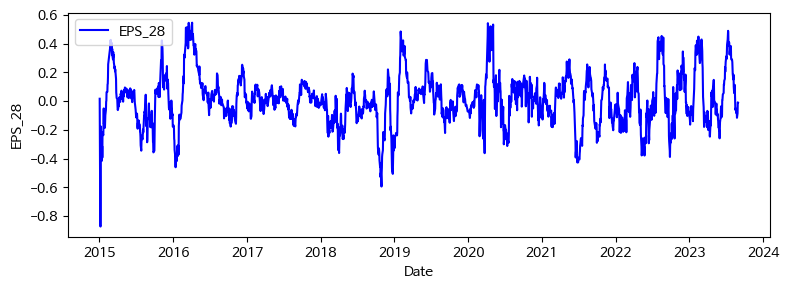

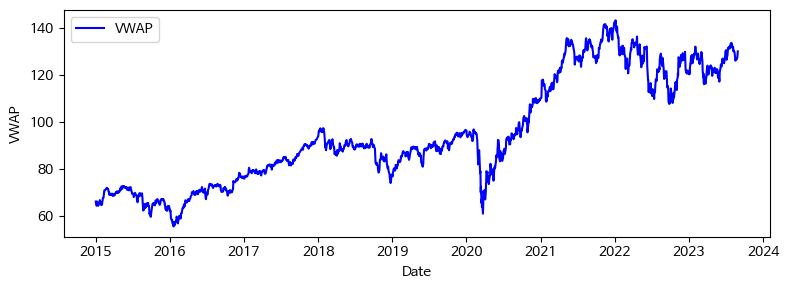

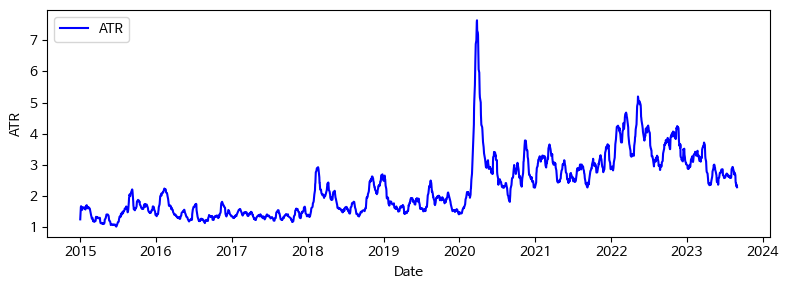

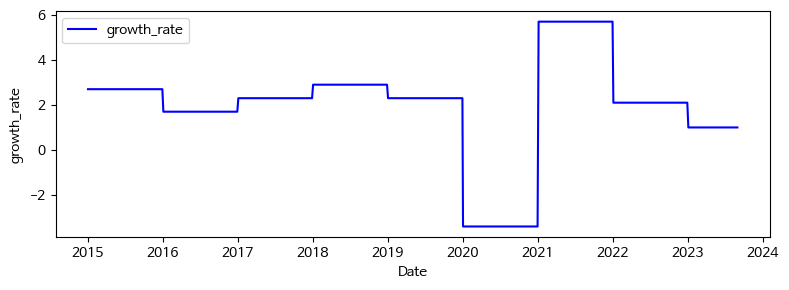

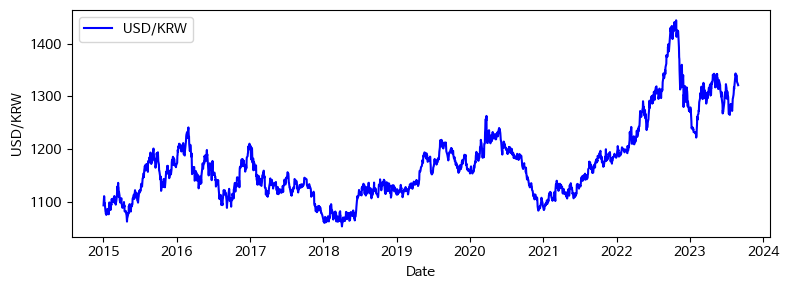

...

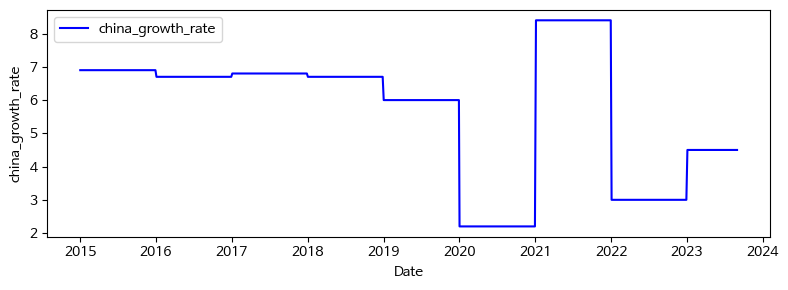

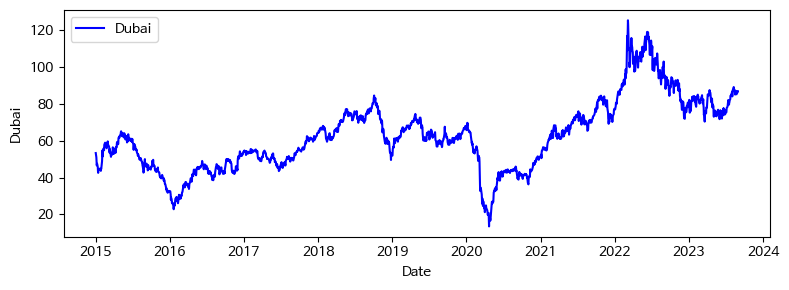

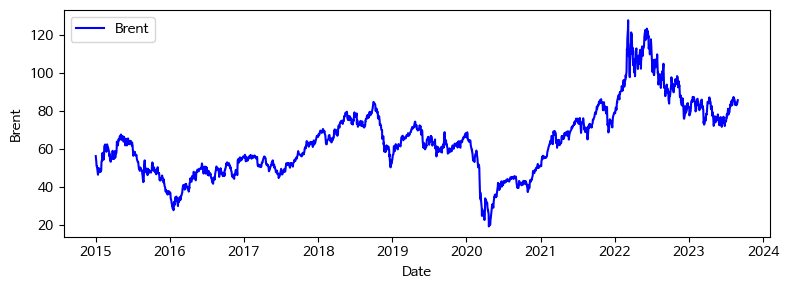

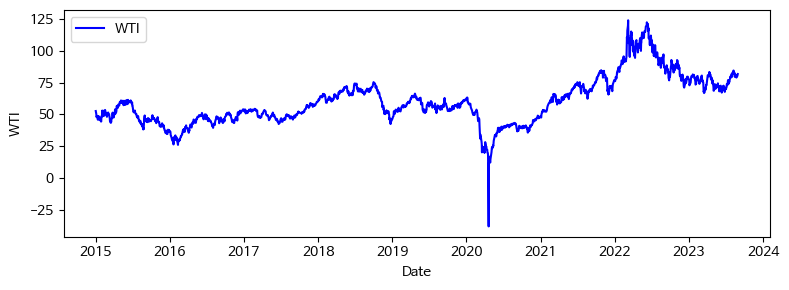

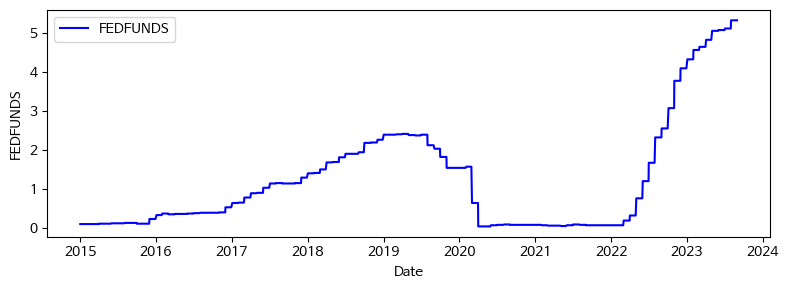

In [26]:
def draw_one(df, col_list):
    for col in col_list:
        plt.figure(figsize=(8, 3))
        plt.plot(df.index, df[col], label = col, color='blue')
        plt.ylabel(col)
        plt.xlabel('Date')
        plt.legend(loc='upper left')
        plt.tight_layout()
        plt.show()

draw_one(ak, check_one)

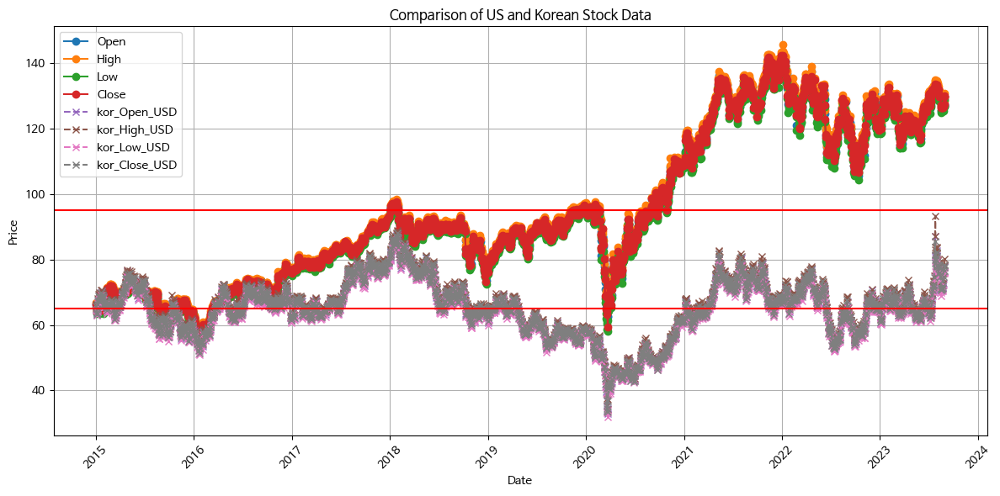

In [27]:
plt.figure(figsize=(12, 6))
plt.plot(ak.index, ak['Open'], label='Open', marker='o')
plt.plot(ak.index, ak['High'], label='High', marker='o')
plt.plot(ak.index, ak['Low'], label='Low', marker='o')
plt.plot(ak.index, ak['Close'], label='Close', marker='o')

plt.plot(ak.index, ak['kor_Open_USD'], label='kor_Open_USD', linestyle='--', marker='x')
plt.plot(ak.index, ak['kor_High_USD'], label='kor_High_USD', linestyle='--', marker='x')
plt.plot(ak.index, ak['kor_Low_USD'], label='kor_Low_USD', linestyle='--', marker='x')
plt.plot(ak.index, ak['kor_Close_USD'], label='kor_Close_USD', linestyle='--', marker='x')

plt.title('Comparison of US and Korean Stock Data')
plt.xlabel('Date')
plt.axhline(y=((ak['Open']+ak['High']+ak['Low']+ak['Close'])/4).mean(), color='red')
plt.axhline(y=((ak['kor_Open_USD']+ak['kor_High_USD']+ak['kor_Low_USD']+ak['kor_Close_USD'])/4).mean(), color='red')
plt.ylabel('Price')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()

plt.show()

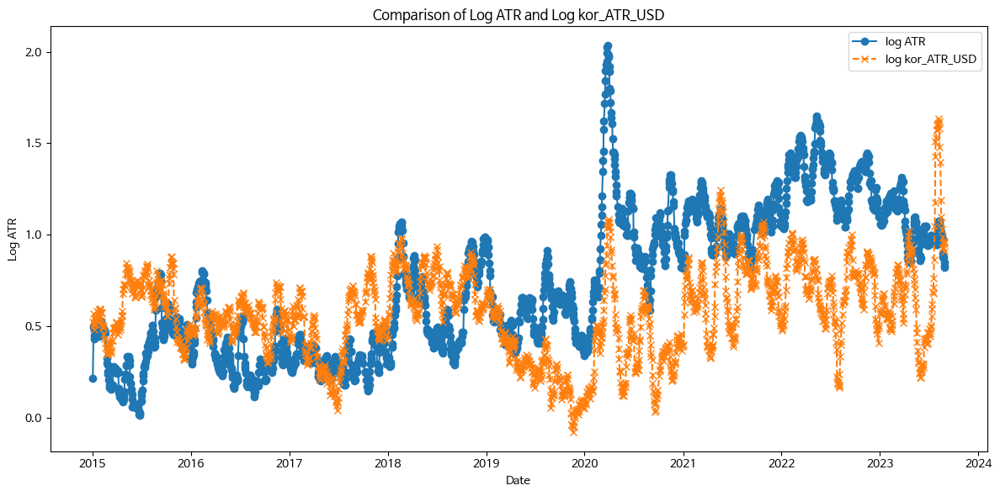

In [28]:
us_atr = ak['ATR']
kor_atr_usd = ak['kor_ATR_USD']

log_us_atr = np.log(us_atr)
log_kor_atr_usd = np.log(kor_atr_usd)

plt.figure(figsize=(12, 6))
plt.plot(ak.index, log_us_atr, label='log ATR', marker='o')
plt.plot(ak.index, log_kor_atr_usd, label='log kor_ATR_USD', linestyle='--', marker='x')

plt.title('Comparison of Log ATR and Log kor_ATR_USD')
plt.xlabel('Date')
plt.ylabel('Log ATR')
plt.legend()
plt.tight_layout()
plt.show()

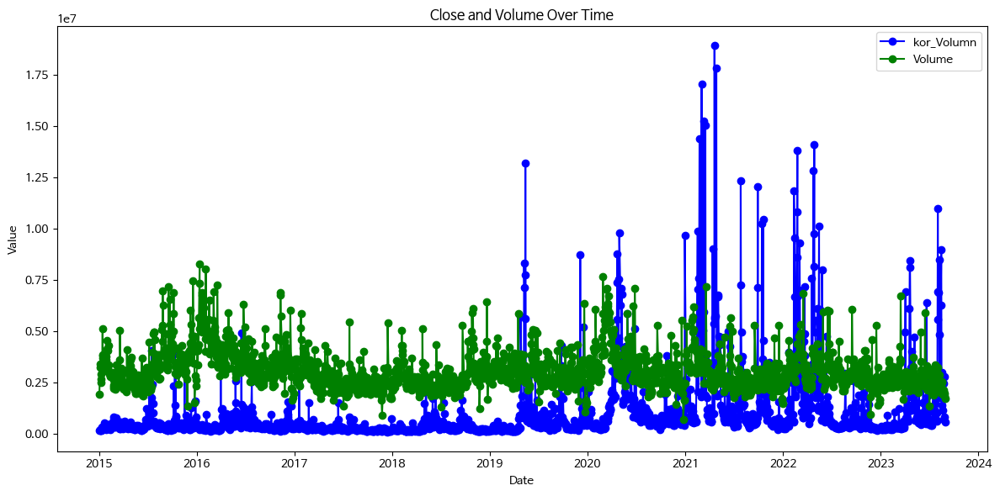

In [29]:
plt.figure(figsize=(12, 6))
plt.plot(ak.index, ak['kor_volume'], marker='o', label='kor_Volumn', linestyle='-', color='b')
plt.plot(ak.index, ak['Volume'], marker='o', label='Volume', linestyle='-', color='g')

plt.xlabel('Date')
plt.ylabel('Value')
plt.title('Close and Volume Over Time')
plt.legend(loc='best')

plt.tight_layout()
plt.show()

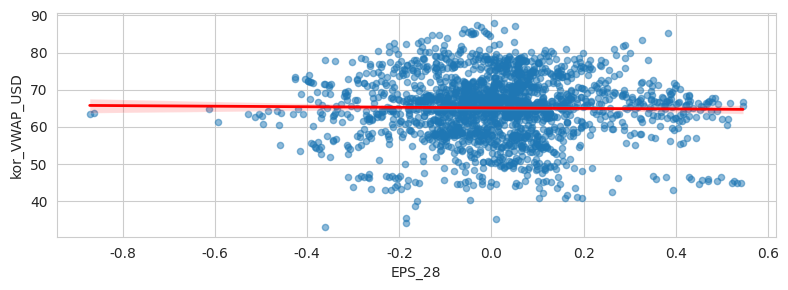

EPS_28와 kor_VWAP_USD 사이의 상관계수 : -0.02
p-value: 0.48012545081699687



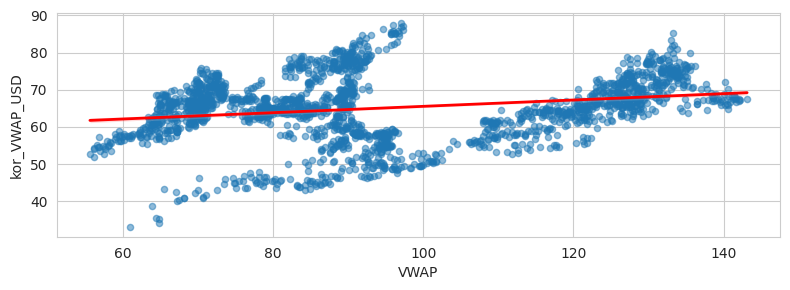

VWAP와 kor_VWAP_USD 사이의 상관계수 : 0.23
p-value: 4.340911752502271e-26



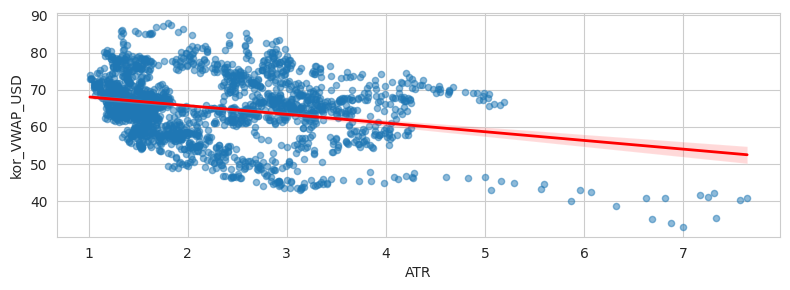

ATR와 kor_VWAP_USD 사이의 상관계수 : -0.27
p-value: 2.0859765658443787e-35



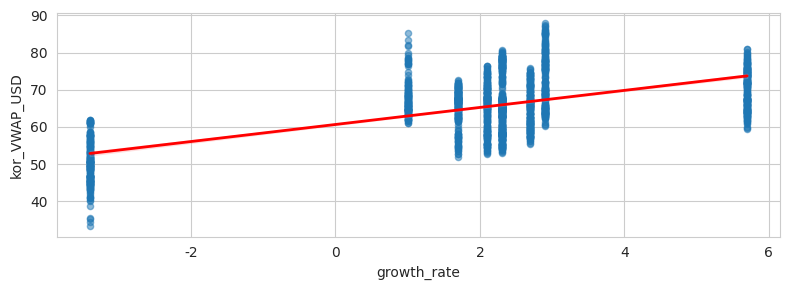

growth_rate와 kor_VWAP_USD 사이의 상관계수 : 0.62
p-value: 7.57618443491751e-218



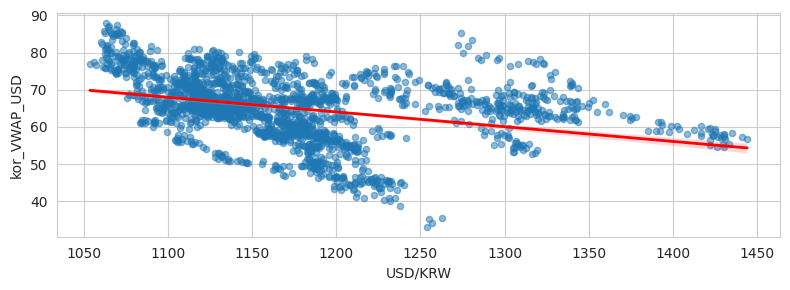

USD/KRW와 kor_VWAP_USD 사이의 상관계수 : -0.35
p-value: 1.7154454923362756e-59



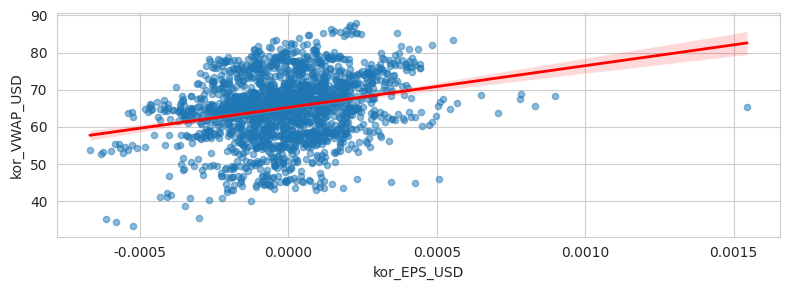

kor_EPS_USD와 kor_VWAP_USD 사이의 상관계수 : 0.25
p-value: 8.764673455671275e-31



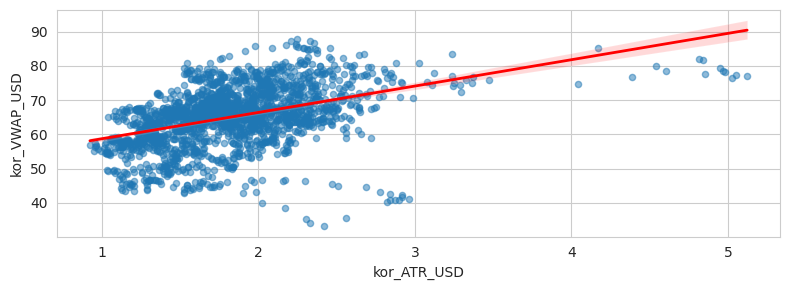

kor_ATR_USD와 kor_VWAP_USD 사이의 상관계수 : 0.43
p-value: 1.1107071685735548e-95



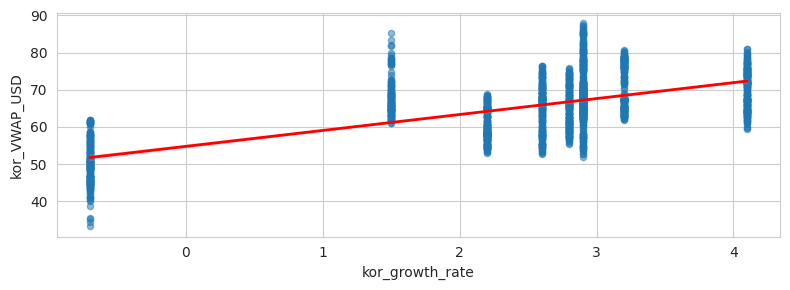

kor_growth_rate와 kor_VWAP_USD 사이의 상관계수 : 0.65
p-value: 1.794862286226304e-251



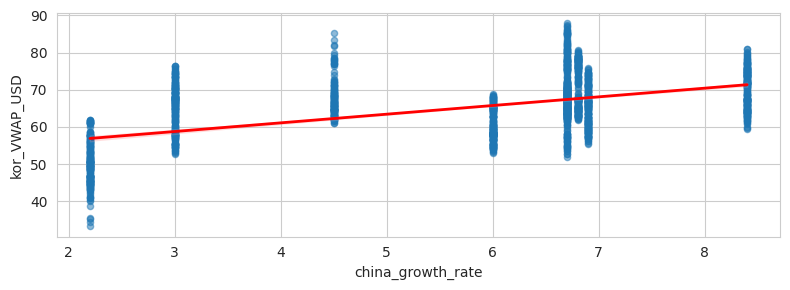

china_growth_rate와 kor_VWAP_USD 사이의 상관계수 : 0.53
p-value: 1.2771758790735932e-151



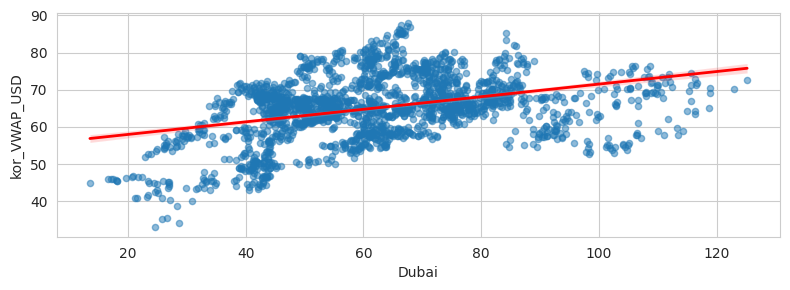

Dubai와 kor_VWAP_USD 사이의 상관계수 : 0.37
p-value: 1.3242735493567938e-69



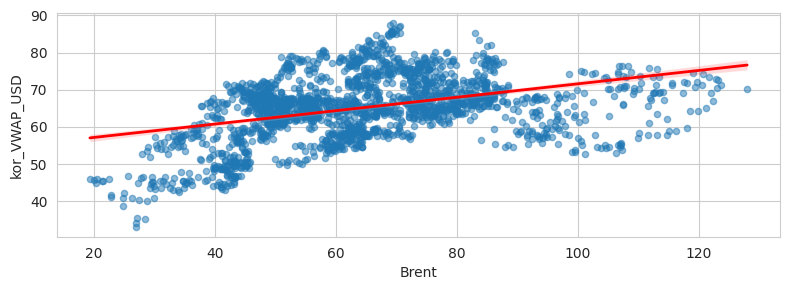

Brent와 kor_VWAP_USD 사이의 상관계수 : 0.39
p-value: 8.792345475868231e-78



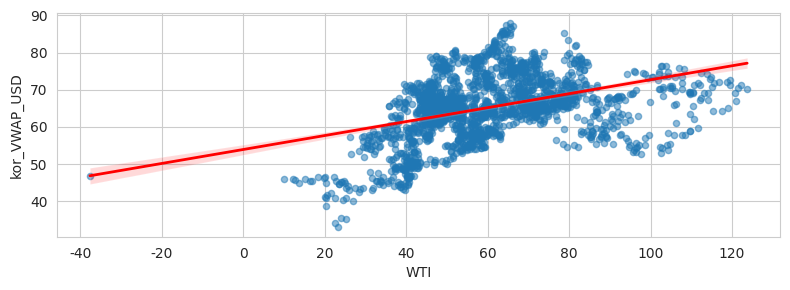

WTI와 kor_VWAP_USD 사이의 상관계수 : 0.40
p-value: 1.7916543800374846e-80



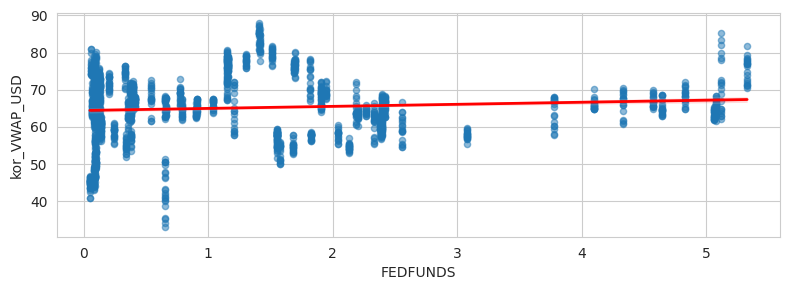

FEDFUNDS와 kor_VWAP_USD 사이의 상관계수 : 0.09
p-value: 3.6513434991895546e-05



In [30]:
import scipy.stats as stat

def draw_two(df, col_list):
    for col in col_list:
        plt.figure(figsize=(8, 3))
        sns.set_style("whitegrid")
        sns.regplot(y='kor_VWAP_USD', x=col, data=df, scatter_kws={'s':20, 'alpha':0.5}, line_kws={'color':'red', 'lw':2})

        plt.xlabel(col)
        plt.ylabel('kor_VWAP_USD')

        plt.tight_layout()
        plt.show()

        corr_coef, p_value = stat.pearsonr(df[col], df['kor_VWAP_USD'])

        print(f'{col}와 kor_VWAP_USD 사이의 상관계수 : {corr_coef:.2f}')
        print(f'p-value: {p_value}\n')

draw_two(ak, check_two)

In [31]:
correlation_matrix = ak[check_one].corr()

correlation_matrix

,EPS_28,VWAP,ATR,growth_rate,USD/KRW,kor_EPS_USD,kor_VWAP_USD,kor_ATR_USD,kor_growth_rate,china_growth_rate,Dubai,Brent,WTI,FEDFUNDS
EPS_28,1.000000,0.036981,-0.048339,-0.099398,0.090497,0.097845,-0.015539,-0.021668,-0.089108,-0.072084,-0.083770,-0.076357,-0.096990,0.074411
VWAP,0.036981,1.000000,0.613593,0.223257,0.443727,-0.034603,0.229408,0.326804,0.077115,-0.207211,0.739542,0.723975,0.746288,0.326291
ATR,-0.048339,0.613593,1.000000,-0.144327,0.563507,-0.129039,-0.268279,0.347090,-0.246997,-0.515105,0.417683,0.417617,0.432412,0.129444
growth_rate,-0.099398,0.223257,-0.144327,1.000000,-0.215490,-0.025273,0.617804,0.261942,0.958356,0.819112,0.346904,0.362968,0.367736,-0.062343
USD/KRW,0.090497,0.443727,0.563507,-0.215490,1.000000,-0.019711,-0.346826,0.156156,-0.254964,-0.566648,0.435203,0.429088,0.437618,0.545560
kor_EPS_USD,0.097845,-0.034603,-0.129039,-0.025273,-0.019711,1.000000,0.249838,0.190983,-0.014435,-0.024291,-0.017481,-0.015036,-0.023352,0.035004
kor_VWAP_USD,-0.015539,0.229408,-0.268279,0.617804,-0.346826,0.249838,1.000000,0.433959,0.652934,0.532330,0.373955,0.394138,0.400482,0.090675
kor_ATR_USD,-0.021668,0.326804,0.347090,0.261942,0.156156,0.190983,0.433959,1.000000,0.228722,0.079849,0.349330,0.358309,0.368154,0.134035
kor_growth_rate,-0.089108,0.077115,-0.246997,0.958356,-0.254964,-0.014435,0.652934,0.228722,1.000000,0.828889,0.246692,0.272245,0.287573,-0.146148
china_growth_rate,-0.072084,-0.207211,-0.515105,0.819112,-0.566648,-0.024291,0.532330,0.079849,0.828889,1.000000,-0.166836,-0.155473,-0.150392,-0.248039


In [32]:
correlation_matrix[['kor_VWAP_USD']].T

,EPS_28,VWAP,ATR,growth_rate,USD/KRW,kor_EPS_USD,kor_VWAP_USD,kor_ATR_USD,kor_growth_rate,china_growth_rate,Dubai,Brent,WTI,FEDFUNDS
kor_VWAP_USD,-0.015539,0.229408,-0.268279,0.617804,-0.346826,0.249838,1.0,0.433959,0.652934,0.53233,0.373955,0.394138,0.400482,0.090675


In [33]:
result1.append(('XLB', correlation_matrix['kor_VWAP_USD']['VWAP']))

## XLRE
  + XLRE : Real Estate
    + 부동산, 부동산업 관련 회사


### NH에서 준 정보를 활용한 상관관계 분석


In [34]:
stock_name= ['TIGER 리츠부동산인프라', '롯데리츠', '신한알파리츠', '롯데프라임리츠', '미래에셋맵스리츠', '제이알글로벌리츠', '이지스밸류리츠', 'SK D&D', '한국자산신탁', '한국토지신탁', '자이 S&D']
stock_code =korea_list = ['329200', '330590', '293940', '338100', '357250', '348950', '334890', '210980', '123890', '034830', '317400']

etf = ['XLRE']

year = '2023'
date = '0101'

find_best_R(etf, stock_name, stock_code, year, date, 0)

['거래일자', '시가', '고가', '저가', '종가', '거래량']
주식 받아오기 끝
가능한 조합: 2047
상관계수 : 0.22540792922224737, p-value : 0.00428045266195445 ['TIGER 리츠부동산인프라']
상관계수 : 0.36586570998321666, p-value : 2.1113296483011244e-06 ['신한알파리츠']
상관계수 : 0.47303063363890835, p-value : 3.04910629690708e-10 ['한국자산신탁']
end


### 주식 중 XLRE에 해당하는 주식 찾기 - 상관관계 약화로 진행X
+ NH에서 준 데이터로 조사한 결과 상관계수가 0.5를 넘지 못해 생략

## XLK
  + XLk : Technology
    + 기술, 기술회사들이 있는 섹터


### NH에서 준 정보를 활용한 상관관계 분석


In [35]:
stock_name= ['SK하이닉스' ,'삼성전자', '삼성SDI', '삼성전기', '삼성SDS', '네이버', '삼성전자우', 'LG화학', 'LG애너지솔루션', '카카오']
stock_code =['000660', '005930', '006400', '009150', '018260', '035420', '005935', '051910', '373220', '035720']

etf = ['XLK']

year = '2023'
date = '0101'

find_best_R(etf, stock_name, stock_code, year, date, 0)

['거래일자', '시가', '고가', '저가', '종가', '거래량']
주식 받아오기 끝
가능한 조합: 1023
상관계수 : 0.93810129410642, p-value : 3.441387713261371e-74 ['SK하이닉스']
상관계수 : 0.9454169684882447, p-value : 2.3652335550285692e-78 ['SK하이닉스' '삼성전자']
end


### 주식 중 XLK에 해당하는 주식 찾기
+ 미국
  + AAPL : 애플
  + MSFT : 마이크로소프트
  + NVDA : 엔비디아
  + AVGO : 브로드컴(반도체 및 인프라)
  + ADBE : 어도비
+ 한국
    + 000660 : SK하이닉스
    + 005930 : 삼성전자
    + 006400 : 삼성SDI
    + 009150 : 삼성전기
    + 018260 : 삼성SDS
    + 035420 : 네이버
    + 005935 : 삼성전자우
    + 051910 : LG화학
    + 373220 : LG애너지솔루션
    + 035720 : 카카오
        + https://www.samsungfund.com/etf/product/view.do?id=2ETF82
        + 대한민국 대표 수출 산업인 IT 산업, 국내 전기전자/IT하드웨어/반도체 산업

In [36]:
america_list = list(sector_info.loc[sector_info['sector_name']=='XLK', 'tck_iem_cd'].unique())
korea_list = ['000660', '005930', '006400', '009150', '018260', '035420', '005935', '051910', '373220', '035720']

In [ ]:
ak = return_ak(america_list, korea_list)

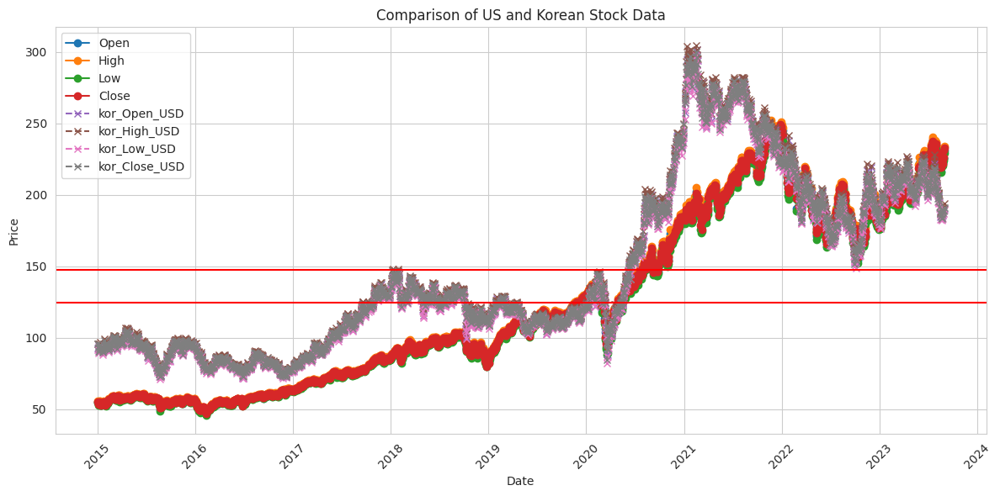

In [38]:
plt.figure(figsize=(12, 6))
plt.plot(ak.index, ak['Open'], label='Open', marker='o')
plt.plot(ak.index, ak['High'], label='High', marker='o')
plt.plot(ak.index, ak['Low'], label='Low', marker='o')
plt.plot(ak.index, ak['Close'], label='Close', marker='o')

plt.plot(ak.index, ak['kor_Open_USD'], label='kor_Open_USD', linestyle='--', marker='x')
plt.plot(ak.index, ak['kor_High_USD'], label='kor_High_USD', linestyle='--', marker='x')
plt.plot(ak.index, ak['kor_Low_USD'], label='kor_Low_USD', linestyle='--', marker='x')
plt.plot(ak.index, ak['kor_Close_USD'], label='kor_Close_USD', linestyle='--', marker='x')

plt.title('Comparison of US and Korean Stock Data')
plt.xlabel('Date')
plt.axhline(y=((ak['Open']+ak['High']+ak['Low']+ak['Close'])/4).mean(), color='red')
plt.axhline(y=((ak['kor_Open_USD']+ak['kor_High_USD']+ak['kor_Low_USD']+ak['kor_Close_USD'])/4).mean(), color='red')
plt.ylabel('Price')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()

plt.show()

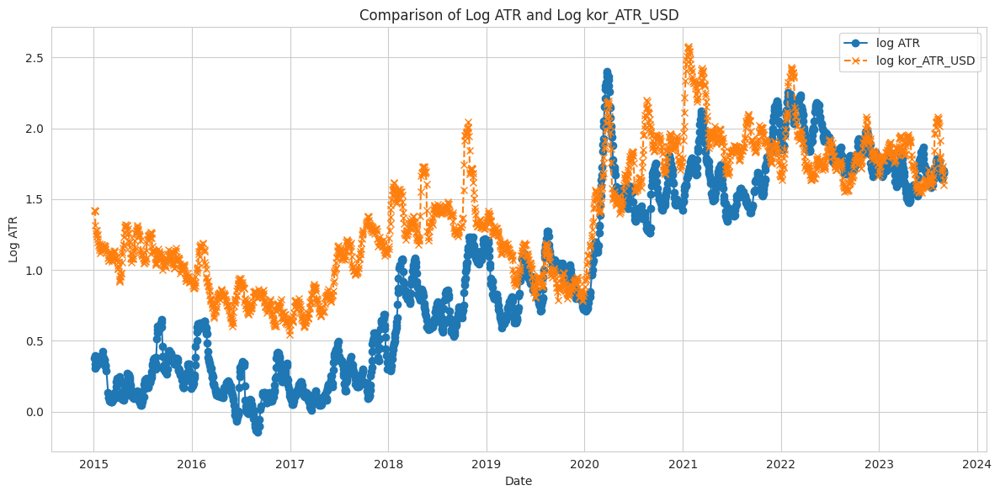

In [39]:
us_atr = ak['ATR']

kor_atr_usd = ak['kor_ATR_USD']

log_us_atr = np.log(us_atr)
log_kor_atr_usd = np.log(kor_atr_usd)

plt.figure(figsize=(12, 6))
plt.plot(ak.index, log_us_atr, label='log ATR', marker='o')
plt.plot(ak.index, log_kor_atr_usd, label='log kor_ATR_USD', linestyle='--', marker='x')

plt.title('Comparison of Log ATR and Log kor_ATR_USD')
plt.xlabel('Date')
plt.ylabel('Log ATR')
plt.legend()
plt.tight_layout()
plt.show()

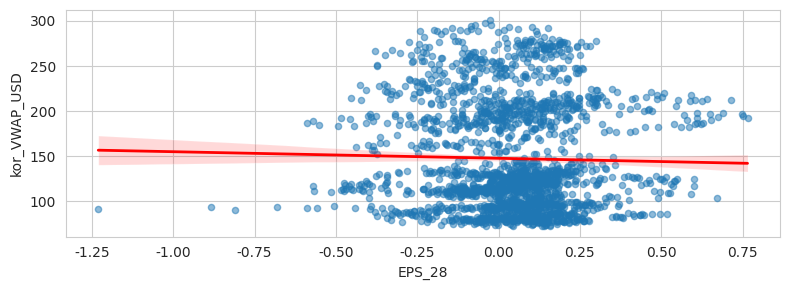

EPS_28와 kor_VWAP_USD 사이의 상관계수 : -0.02
p-value: 0.27524294733483823



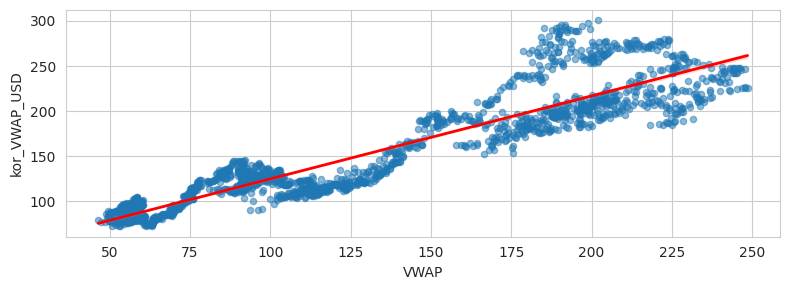

VWAP와 kor_VWAP_USD 사이의 상관계수 : 0.93
p-value: 0.0



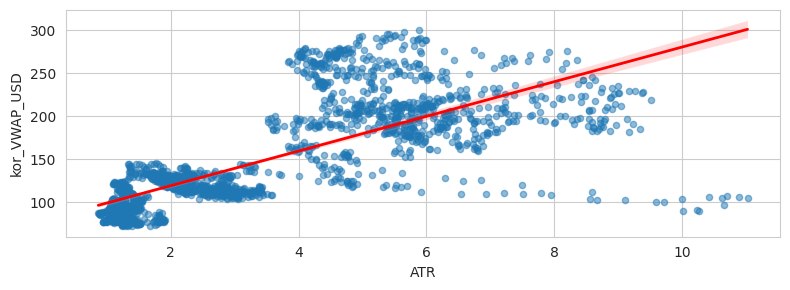

ATR와 kor_VWAP_USD 사이의 상관계수 : 0.75
p-value: 0.0



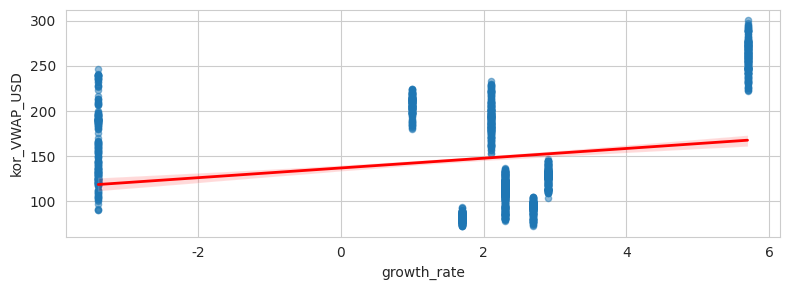

growth_rate와 kor_VWAP_USD 사이의 상관계수 : 0.21
p-value: 1.784785486054352e-21



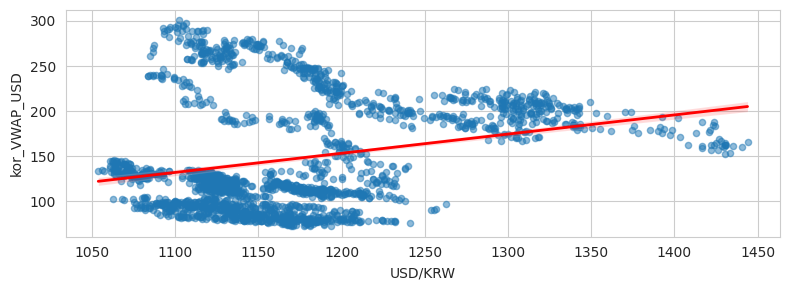

USD/KRW와 kor_VWAP_USD 사이의 상관계수 : 0.26
p-value: 1.850177336331357e-34



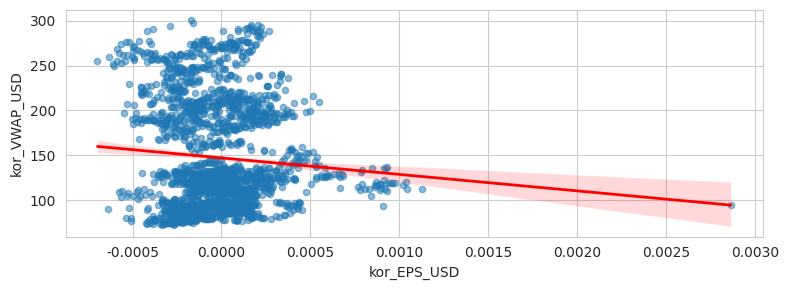

kor_EPS_USD와 kor_VWAP_USD 사이의 상관계수 : -0.08
p-value: 0.0004072323830894184



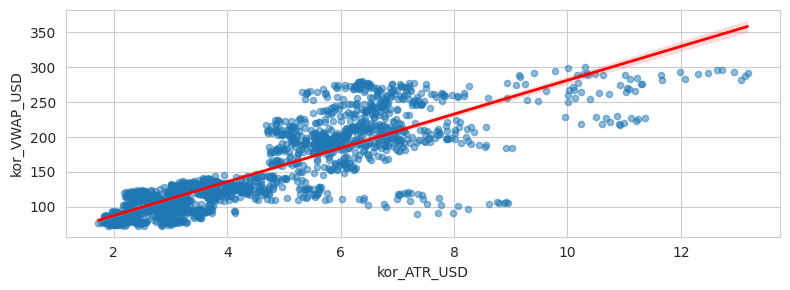

kor_ATR_USD와 kor_VWAP_USD 사이의 상관계수 : 0.85
p-value: 0.0



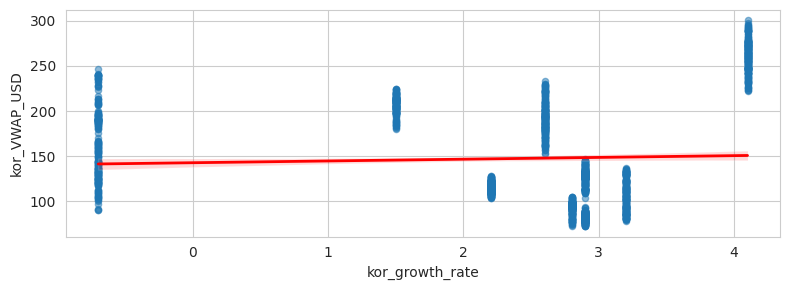

kor_growth_rate와 kor_VWAP_USD 사이의 상관계수 : 0.04
p-value: 0.05288127610419408



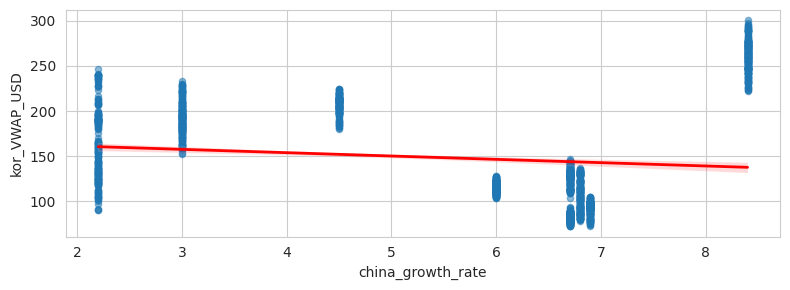

china_growth_rate와 kor_VWAP_USD 사이의 상관계수 : -0.12
p-value: 4.519439974475413e-08



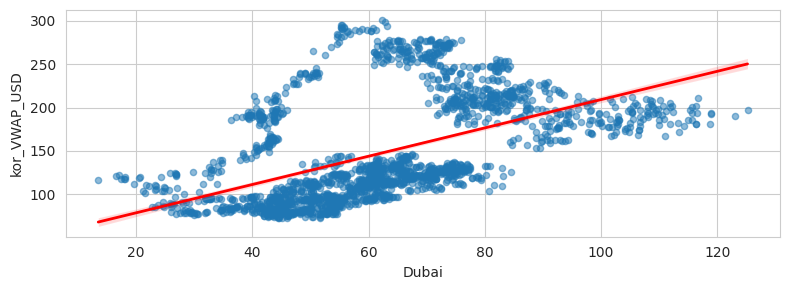

Dubai와 kor_VWAP_USD 사이의 상관계수 : 0.51
p-value: 3.0715249296479216e-140



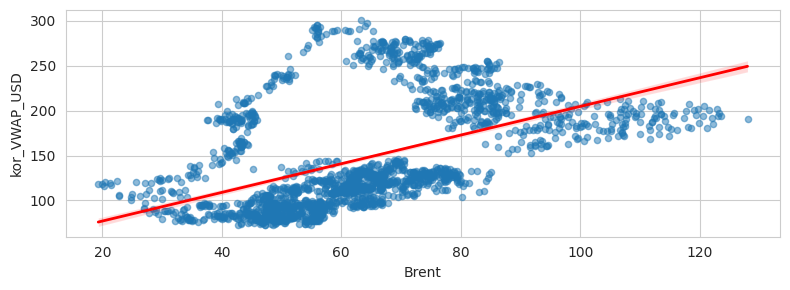

Brent와 kor_VWAP_USD 사이의 상관계수 : 0.50
p-value: 8.245811553742246e-130



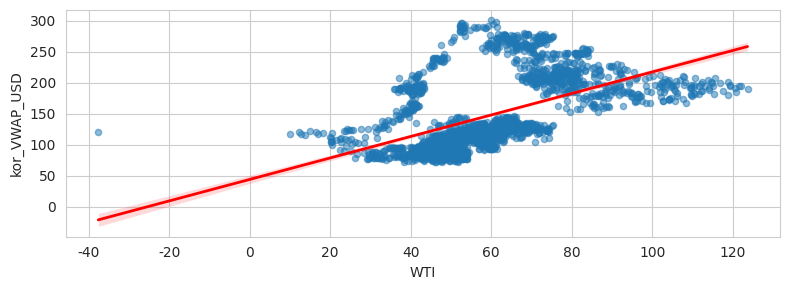

WTI와 kor_VWAP_USD 사이의 상관계수 : 0.53
p-value: 4.583588674762659e-148



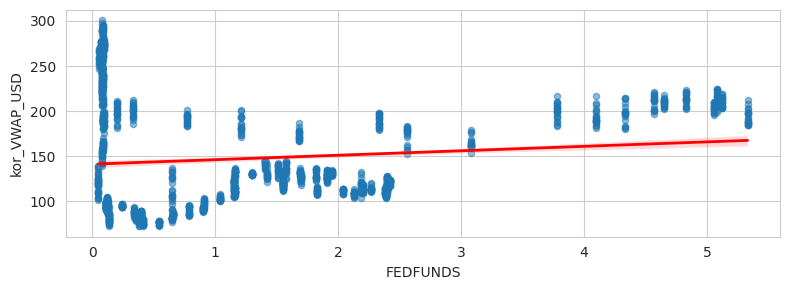

FEDFUNDS와 kor_VWAP_USD 사이의 상관계수 : 0.12
p-value: 1.3882203385484888e-07



In [40]:
draw_two(ak, check_two)

In [41]:
correlation_matrix = ak[check_one].corr()

correlation_matrix

,EPS_28,VWAP,ATR,growth_rate,USD/KRW,kor_EPS_USD,kor_VWAP_USD,kor_ATR_USD,kor_growth_rate,china_growth_rate,Dubai,Brent,WTI,FEDFUNDS
EPS_28,1.000000,0.023532,-0.092399,-0.141277,0.067439,-0.023529,-0.024009,-0.139974,-0.141925,-0.084031,-0.060767,-0.056805,-0.077358,0.154200
VWAP,0.023532,1.000000,0.840463,0.084707,0.507811,-0.095765,0.927797,0.775996,-0.087058,-0.307695,0.632699,0.610508,0.632993,0.301695
ATR,-0.092399,0.840463,1.000000,-0.082972,0.574199,-0.140410,0.749387,0.811407,-0.211761,-0.498601,0.537103,0.528697,0.547817,0.179253
growth_rate,-0.141277,0.084707,-0.082972,1.000000,-0.215490,-0.147752,0.207177,0.055911,0.958356,0.819112,0.346904,0.362968,0.367736,-0.062343
USD/KRW,0.067439,0.507811,0.574199,-0.215490,1.000000,-0.024303,0.264616,0.276456,-0.254964,-0.566648,0.435203,0.429088,0.437618,0.545560
kor_EPS_USD,-0.023529,-0.095765,-0.140410,-0.147752,-0.024303,1.000000,-0.077691,-0.047539,-0.141042,-0.100928,0.008947,-0.001154,-0.029161,0.132746
kor_VWAP_USD,-0.024009,0.927797,0.749387,0.207177,0.264616,-0.077691,1.000000,0.852709,0.042587,-0.119936,0.514760,0.497702,0.526952,0.115527
kor_ATR_USD,-0.139974,0.775996,0.811407,0.055911,0.276456,-0.047539,0.852709,1.000000,-0.084315,-0.248234,0.409834,0.397221,0.416769,0.053954
kor_growth_rate,-0.141925,-0.087058,-0.211761,0.958356,-0.254964,-0.141042,0.042587,-0.084315,1.000000,0.828889,0.246692,0.272245,0.287573,-0.146148
china_growth_rate,-0.084031,-0.307695,-0.498601,0.819112,-0.566648,-0.100928,-0.119936,-0.248234,0.828889,1.000000,-0.166836,-0.155473,-0.150392,-0.248039


In [42]:
correlation_matrix[['kor_VWAP_USD']].T

,EPS_28,VWAP,ATR,growth_rate,USD/KRW,kor_EPS_USD,kor_VWAP_USD,kor_ATR_USD,kor_growth_rate,china_growth_rate,Dubai,Brent,WTI,FEDFUNDS
kor_VWAP_USD,-0.024009,0.927797,0.749387,0.207177,0.264616,-0.077691,1.0,0.852709,0.042587,-0.119936,0.51476,0.497702,0.526952,0.115527


In [43]:
result1.append(('XLK', correlation_matrix['kor_VWAP_USD']['VWAP']))

## XLU
  + XLU : Utility
    + 기반사업(공익사업), 전기, 수도 등의 회사

### NH에서 준 정보를 활용한 상관관계 분석


In [44]:
stock_name= ['한국전력공사보통주', '한국가스공사보통주', 'SK가스보통주', '지오릿에너지', 'SGC에너지보통주', '한국주철관', '한전기술', '한전KPS', '서울도시가스보통주', '삼천리보통주', '지역난방공사보통주']
stock_code = ['015760', '036460', '018670', '270520', '005090', '000970', '052690', '051600', '017390', '004690', '071320']
etf = ['XLU']

year = '2023'
date = '0101'

find_best_R(etf, stock_name, stock_code, year, date, 0)

['거래일자', '시가', '고가', '저가', '종가', '거래량']
주식 받아오기 끝
가능한 조합: 2047
상관계수 : 0.5240872521413819, p-value : 1.3462436525328713e-12 ['한국전력공사보통주']
상관계수 : 0.533009409609435, p-value : 4.741193770516956e-13 ['한국전력공사보통주' '한국가스공사보통주']
end


### 주식 중 XLU에 해당하는 주식 찾기
+ 미국
  + NEE : 넥스테라 에너지(전력 지수 회사, 에너지 회사)
  + SO : 서던 컴퍼니(가스, 전기 유통)
  + DUK : 듀크 에너지(미국의 전력 및 천연 가스 지주 회사)
  + SRE : 셈프라(공공 유틸리티 지주 회사)
  + EXC : Exelon(미국에서 가장 큰 규제 전기 유틸리티)
+ 한국
    + 015760 : 한국전력공사보통주
    + 036460 : 한국가스공사보통주
    + 018670 : SK가스보통주
    + 270520 : 지오릿에너지
    + 005090 : SGC에너지보통주
        + 한전은 원자재 가격이 상승해도 전기값을 쉽게 못올림
        + 이에따른 적자가 계속 발생
        + 한국가스공사는 유가와 연관

In [45]:
america_list = list(sector_info.loc[sector_info['sector_name']=='XLU', 'tck_iem_cd'].unique())
korea_list = ['015760', '036460', '018670', '270520', '005090', '000970', '052690', '051600', '017390', '004690', '071320']

In [ ]:
ak = return_ak(america_list, korea_list)

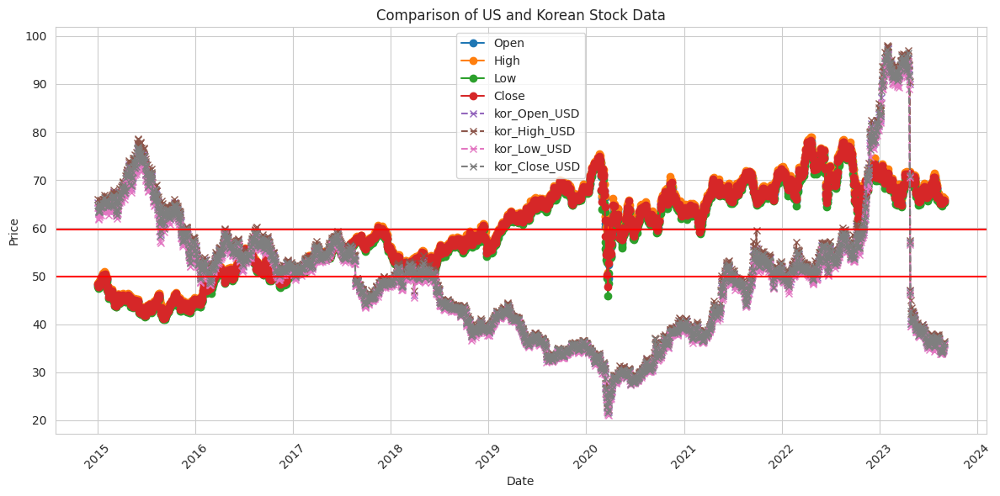

In [47]:
plt.figure(figsize=(12, 6))
plt.plot(ak.index, ak['Open'], label='Open', marker='o')
plt.plot(ak.index, ak['High'], label='High', marker='o')
plt.plot(ak.index, ak['Low'], label='Low', marker='o')
plt.plot(ak.index, ak['Close'], label='Close', marker='o')

plt.plot(ak.index, ak['kor_Open_USD'], label='kor_Open_USD', linestyle='--', marker='x')
plt.plot(ak.index, ak['kor_High_USD'], label='kor_High_USD', linestyle='--', marker='x')
plt.plot(ak.index, ak['kor_Low_USD'], label='kor_Low_USD', linestyle='--', marker='x')
plt.plot(ak.index, ak['kor_Close_USD'], label='kor_Close_USD', linestyle='--', marker='x')

plt.title('Comparison of US and Korean Stock Data')
plt.xlabel('Date')
plt.axhline(y=((ak['Open']+ak['High']+ak['Low']+ak['Close'])/4).mean(), color='red')
plt.axhline(y=((ak['kor_Open_USD']+ak['kor_High_USD']+ak['kor_Low_USD']+ak['kor_Close_USD'])/4).mean(), color='red')
plt.ylabel('Price')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()

plt.show()

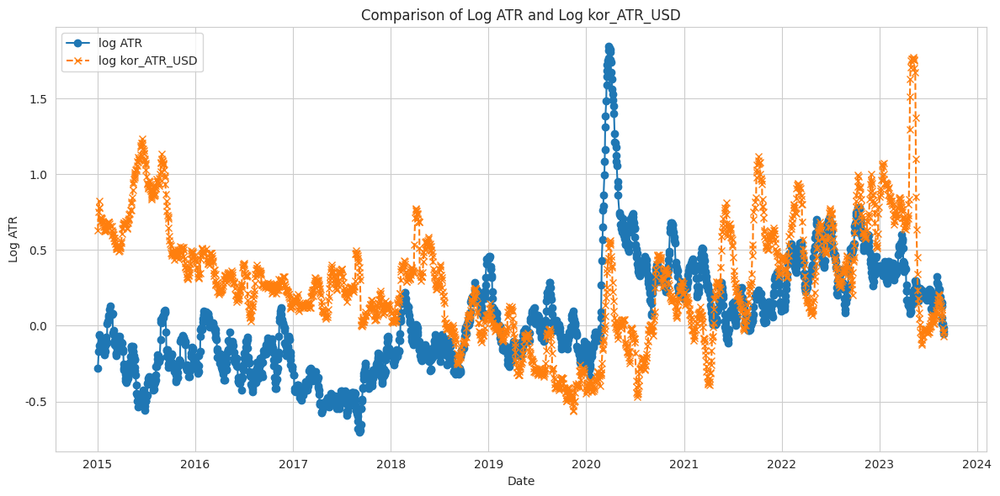

In [48]:
us_atr = ak['ATR']
kor_atr_usd = ak['kor_ATR_USD']

log_us_atr = np.log(us_atr)
log_kor_atr_usd = np.log(kor_atr_usd)

plt.figure(figsize=(12, 6))
plt.plot(ak.index, log_us_atr, label='log ATR', marker='o')
plt.plot(ak.index, log_kor_atr_usd, label='log kor_ATR_USD', linestyle='--', marker='x')

plt.title('Comparison of Log ATR and Log kor_ATR_USD')
plt.xlabel('Date')
plt.ylabel('Log ATR')
plt.legend()
plt.tight_layout()
plt.show()

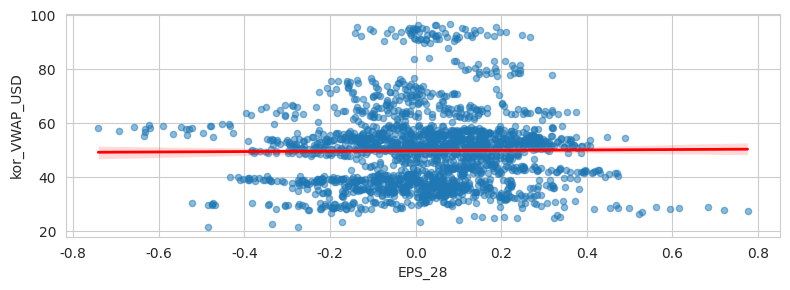

EPS_28와 kor_VWAP_USD 사이의 상관계수 : 0.01
p-value: 0.6541445410611306



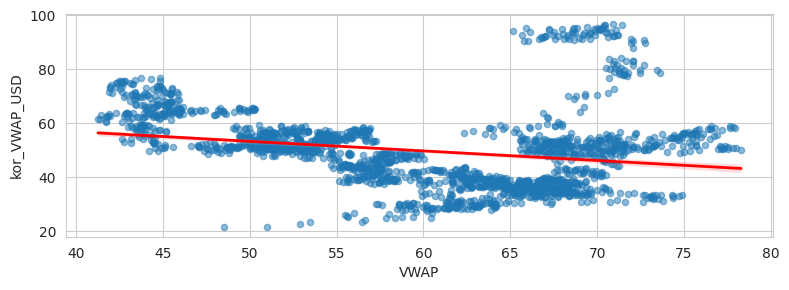

VWAP와 kor_VWAP_USD 사이의 상관계수 : -0.23
p-value: 6.378864048492389e-27



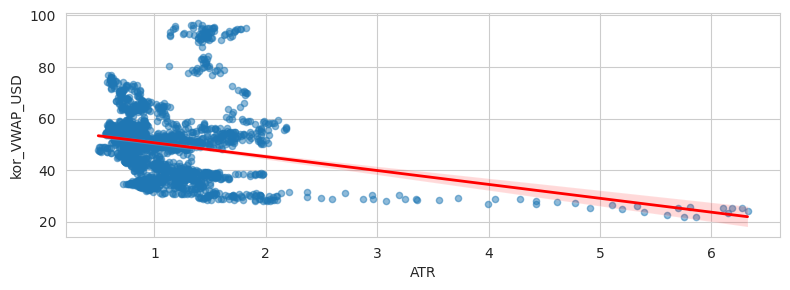

ATR와 kor_VWAP_USD 사이의 상관계수 : -0.23
p-value: 9.838121930013826e-26



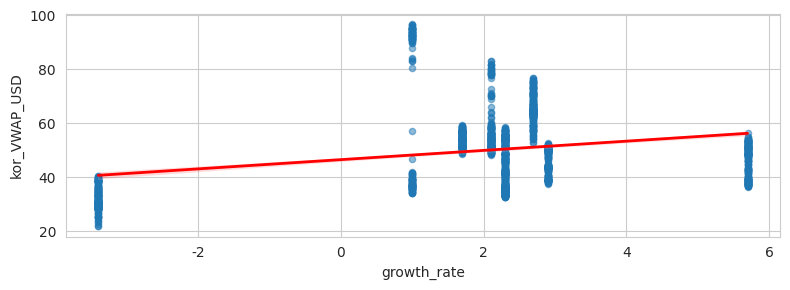

growth_rate와 kor_VWAP_USD 사이의 상관계수 : 0.28
p-value: 1.434567181778452e-39



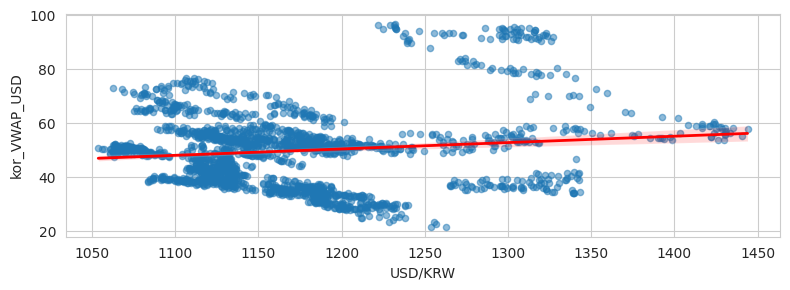

USD/KRW와 kor_VWAP_USD 사이의 상관계수 : 0.13
p-value: 6.997641663545649e-09



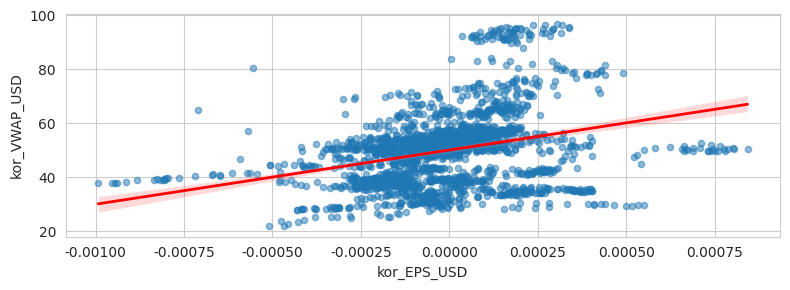

kor_EPS_USD와 kor_VWAP_USD 사이의 상관계수 : 0.31
p-value: 1.1821065849264579e-46



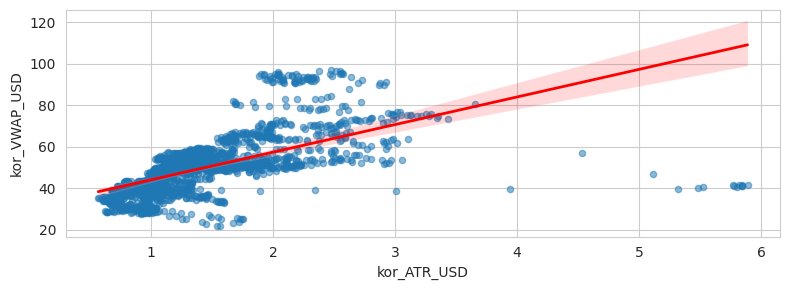

kor_ATR_USD와 kor_VWAP_USD 사이의 상관계수 : 0.61
p-value: 2.3917890877882746e-209



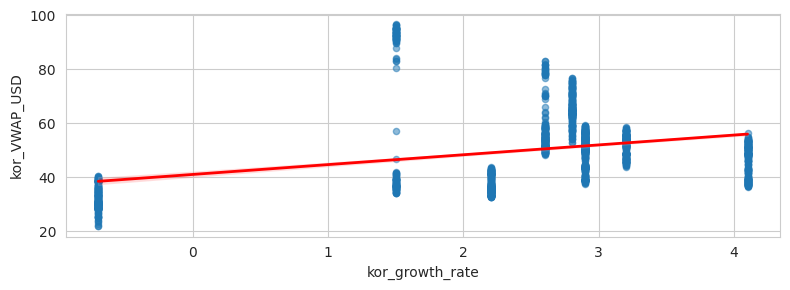

kor_growth_rate와 kor_VWAP_USD 사이의 상관계수 : 0.34
p-value: 1.0330888731693903e-57



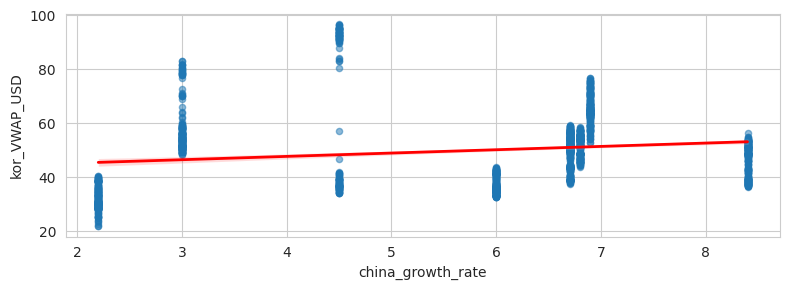

china_growth_rate와 kor_VWAP_USD 사이의 상관계수 : 0.17
p-value: 2.1555467325717945e-15



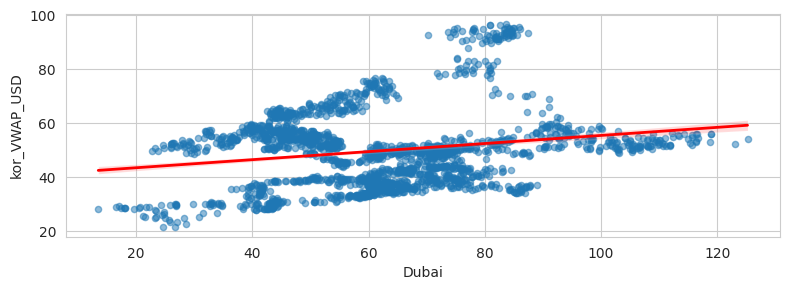

Dubai와 kor_VWAP_USD 사이의 상관계수 : 0.20
p-value: 8.365263719475264e-21



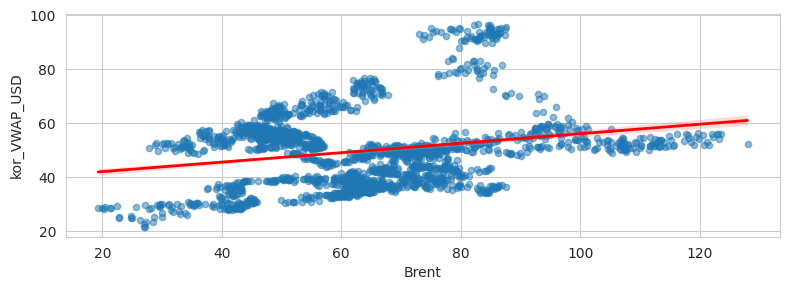

Brent와 kor_VWAP_USD 사이의 상관계수 : 0.24
p-value: 1.3324679104746882e-27



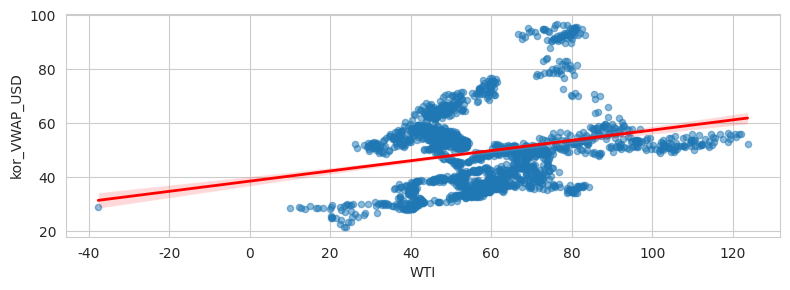

WTI와 kor_VWAP_USD 사이의 상관계수 : 0.25
p-value: 2.1651890187223056e-30



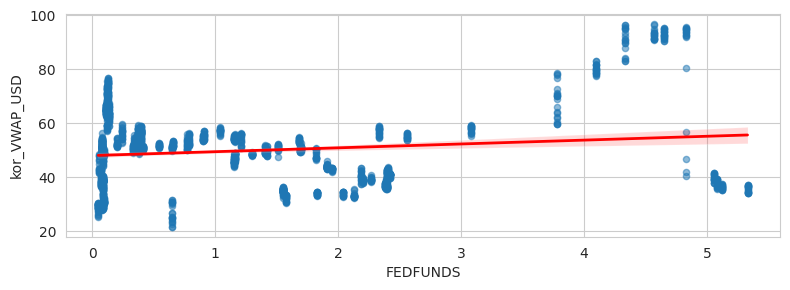

FEDFUNDS와 kor_VWAP_USD 사이의 상관계수 : 0.14
p-value: 4.00884113251549e-11



In [49]:
draw_two(ak, check_two)

In [50]:
correlation_matrix = ak[check_one].corr()

correlation_matrix

,EPS_28,VWAP,ATR,growth_rate,USD/KRW,kor_EPS_USD,kor_VWAP_USD,kor_ATR_USD,kor_growth_rate,china_growth_rate,Dubai,Brent,WTI,FEDFUNDS
EPS_28,1.000000,0.033542,-0.084505,-0.001303,-0.064822,0.004963,0.009860,-0.113540,0.042027,0.063403,-0.152308,-0.143469,-0.148879,-0.040571
VWAP,0.033542,1.000000,0.343176,-0.071238,0.526700,0.002287,-0.233176,-0.134400,-0.207175,-0.454659,0.618617,0.593355,0.595890,0.382341
ATR,-0.084505,0.343176,1.000000,-0.384378,0.417482,-0.073195,-0.227779,0.049866,-0.455841,-0.536724,0.042045,0.040992,0.034954,0.048283
growth_rate,-0.001303,-0.071238,-0.384378,1.000000,-0.215490,0.072917,0.283724,0.156745,0.958356,0.819112,0.346904,0.362968,0.367736,-0.062343
USD/KRW,-0.064822,0.526700,0.417482,-0.215490,1.000000,-0.085456,0.126936,0.228317,-0.254964,-0.566648,0.435203,0.429088,0.437618,0.545560
kor_EPS_USD,0.004963,0.002287,-0.073195,0.072917,-0.085456,1.000000,0.307962,0.093982,0.071009,0.016211,0.047250,0.065098,0.058164,-0.061295
kor_VWAP_USD,0.009860,-0.233176,-0.227779,0.283724,0.126936,0.307962,1.000000,0.608161,0.341763,0.173252,0.203726,0.236205,0.248200,0.144575
kor_ATR_USD,-0.113540,-0.134400,0.049866,0.156745,0.228317,0.093982,0.608161,1.000000,0.152028,0.021497,0.206860,0.226370,0.245061,0.081104
kor_growth_rate,0.042027,-0.207175,-0.455841,0.958356,-0.254964,0.071009,0.341763,0.152028,1.000000,0.828889,0.246692,0.272245,0.287573,-0.146148
china_growth_rate,0.063403,-0.454659,-0.536724,0.819112,-0.566648,0.016211,0.173252,0.021497,0.828889,1.000000,-0.166836,-0.155473,-0.150392,-0.248039


In [51]:
correlation_matrix[['kor_VWAP_USD']].T

,EPS_28,VWAP,ATR,growth_rate,USD/KRW,kor_EPS_USD,kor_VWAP_USD,kor_ATR_USD,kor_growth_rate,china_growth_rate,Dubai,Brent,WTI,FEDFUNDS
kor_VWAP_USD,0.00986,-0.233176,-0.227779,0.283724,0.126936,0.307962,1.0,0.608161,0.341763,0.173252,0.203726,0.236205,0.2482,0.144575


In [52]:
result1.append(('XLU', correlation_matrix['kor_VWAP_USD']['VWAP']))

## XLC
+ XLC : Communication Services
    + 통신서비스에 관련한 회사 모음

### NH에서 준 정보를 활용한 상관관계 분석


In [53]:
stock_name= ['세종텔레콤',  'LG유플러스', 'SK텔레콤', '네이버',  '이루온', '서진시스템', '크래프톤', '인스코비']
stock_code = ['036630', '032640', '017670' , '035420', '065440', '178320',  '259960',  '006490']

etf = ['XLC']

year = '2023'
date = '0101'

find_best_R(etf, stock_name, stock_code, year, date, 0)

['거래일자', '시가', '고가', '저가', '종가', '거래량']
주식 받아오기 끝
가능한 조합: 255
상관계수 : 0.3481957308783559, p-value : 6.875927202707525e-06 ['네이버']
상관계수 : 0.35872481567892595, p-value : 3.431493477140848e-06 ['네이버' '서진시스템']
end


### 주식 중 XLC에 해당하는 주식 찾기 - 상관관계 약화로 진행X
+ NH에서 준 데이터로 조사한 결과 상관계수가 0.5를 넘지 못해 생략

## XLY
  + XLY : Consumer Discretionary
    + 사치재, 소득의 여유가 있다면 소비하고 싶어하고 소비하는 것들에 대한 회사들의 모음

### NH에서 준 정보를 활용한 상관관계 분석


In [54]:
stock_name = ['대한항공', '진에어', '신세계', '현대백화점', '현대차', '기아', '한샘', '리바트', 'LX하우시스', '휠라', 'jpyent', '하이브']
stock_code = ['003490', '272450', '004170', '069960', '005380', '000270', '009240', '079430','108670',  '081660',  '035900', '352820']

etf = ['XLY']

year = '2023'
date = '0101'

find_best_R(etf, stock_name, stock_code, year, date, 0)

['거래일자', '시가', '고가', '저가', '종가', '거래량']
주식 받아오기 끝
가능한 조합: 4095
상관계수 : 0.4403399170776319, p-value : 6.314959604472017e-09 ['대한항공']
상관계수 : 0.5767262534876899, p-value : 1.780956329024057e-15 ['현대차']
상관계수 : 0.8196078262011401, p-value : 8.122948563367468e-40 ['LX하우시스']
상관계수 : 0.822980847525662, p-value : 2.1261922436129745e-40 ['대한항공' 'LX하우시스']
상관계수 : 0.834530474855178, p-value : 1.724827001105878e-42 ['LX하우시스' '휠라']
상관계수 : 0.8472334788137839, p-value : 5.5258825646483955e-45 ['대한항공' '현대백화점' '기아']
상관계수 : 0.8885345704375857, p-value : 5.372940253605206e-55 ['현대백화점' '기아' 'LX하우시스']
상관계수 : 0.8963706353505234, p-value : 2.412798278730712e-57 ['대한항공' '현대백화점' '기아' 'LX하우시스']
상관계수 : 0.9034765673428982, p-value : 1.215967967502452e-59 ['현대백화점' '기아' 'LX하우시스' '휠라']
상관계수 : 0.9089433234304283, p-value : 1.5574646372474076e-61 ['대한항공' '현대백화점' '기아' 'LX하우시스' '휠라']
end


### 주식 중 XLY에 해당하는 주식 찾기

In [55]:
america_list = list(sector_info.loc[sector_info['sector_name']=='XLY', 'tck_iem_cd'].unique())
korea_list = ['003490', '272450', '004170', '069960', '005380', '000270', '009240', '079430','108670',  '081660',  '035900', '352820']

In [ ]:
ak = return_ak(america_list, korea_list)

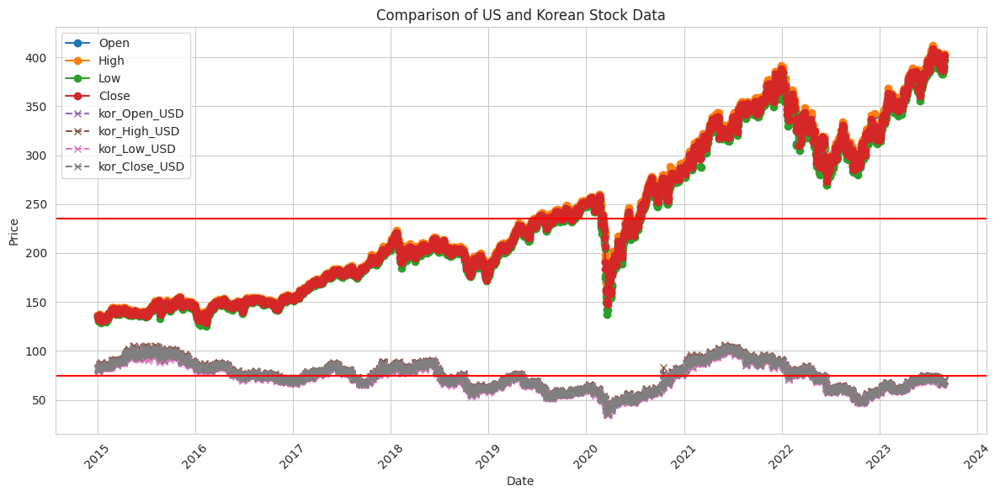

In [57]:
plt.figure(figsize=(12, 6))
plt.plot(ak.index, ak['Open'], label='Open', marker='o')
plt.plot(ak.index, ak['High'], label='High', marker='o')
plt.plot(ak.index, ak['Low'], label='Low', marker='o')
plt.plot(ak.index, ak['Close'], label='Close', marker='o')

plt.plot(ak.index, ak['kor_Open_USD'], label='kor_Open_USD', linestyle='--', marker='x')
plt.plot(ak.index, ak['kor_High_USD'], label='kor_High_USD', linestyle='--', marker='x')
plt.plot(ak.index, ak['kor_Low_USD'], label='kor_Low_USD', linestyle='--', marker='x')
plt.plot(ak.index, ak['kor_Close_USD'], label='kor_Close_USD', linestyle='--', marker='x')

plt.title('Comparison of US and Korean Stock Data')
plt.xlabel('Date')
plt.axhline(y=((ak['Open']+ak['High']+ak['Low']+ak['Close'])/4).mean(), color='red')
plt.axhline(y=((ak['kor_Open_USD']+ak['kor_High_USD']+ak['kor_Low_USD']+ak['kor_Close_USD'])/4).mean(), color='red')
plt.ylabel('Price')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()

plt.show()

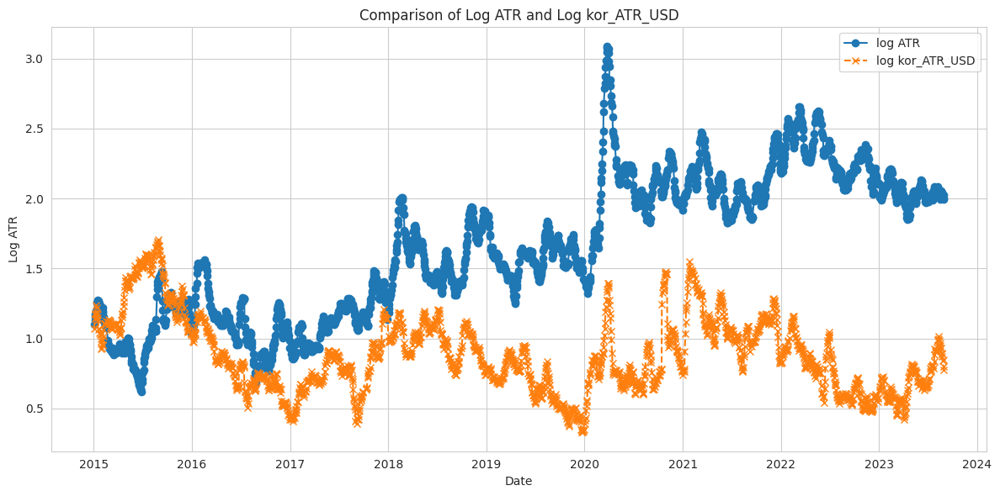

In [58]:
us_atr = ak['ATR']
kor_atr_usd = ak['kor_ATR_USD']

log_us_atr = np.log(us_atr)
log_kor_atr_usd = np.log(kor_atr_usd)

plt.figure(figsize=(12, 6))
plt.plot(ak.index, log_us_atr, label='log ATR', marker='o')
plt.plot(ak.index, log_kor_atr_usd, label='log kor_ATR_USD', linestyle='--', marker='x')

plt.title('Comparison of Log ATR and Log kor_ATR_USD')
plt.xlabel('Date')
plt.ylabel('Log ATR')
plt.legend()
plt.tight_layout()
plt.show()

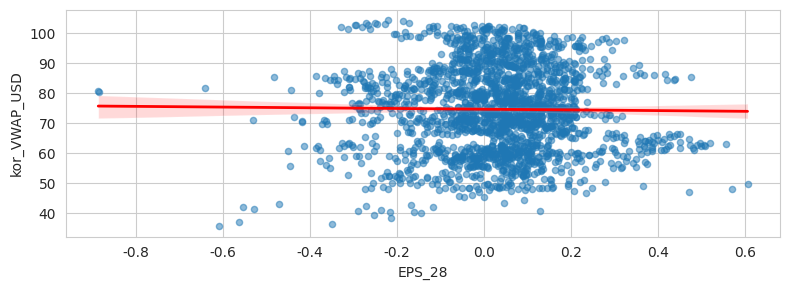

EPS_28와 kor_VWAP_USD 사이의 상관계수 : -0.01
p-value: 0.5509480128917459



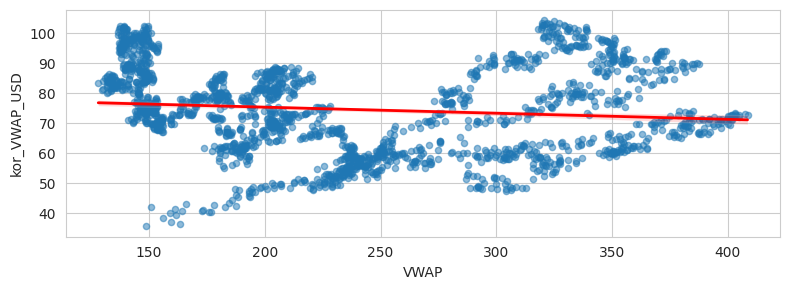

VWAP와 kor_VWAP_USD 사이의 상관계수 : -0.11
p-value: 3.748002544727992e-07



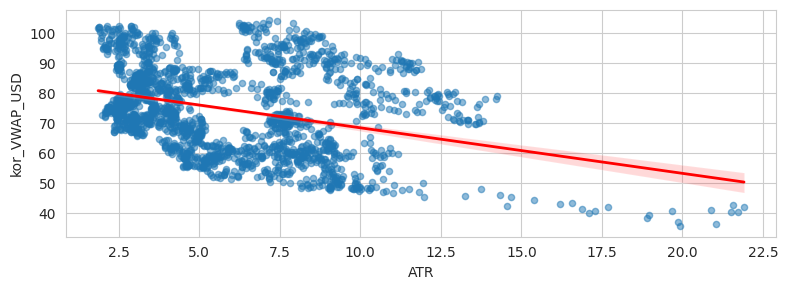

ATR와 kor_VWAP_USD 사이의 상관계수 : -0.33
p-value: 1.845956312654914e-52



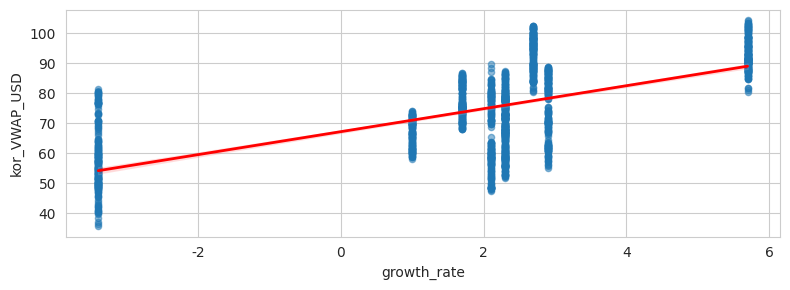

growth_rate와 kor_VWAP_USD 사이의 상관계수 : 0.62
p-value: 1.879844728740622e-216



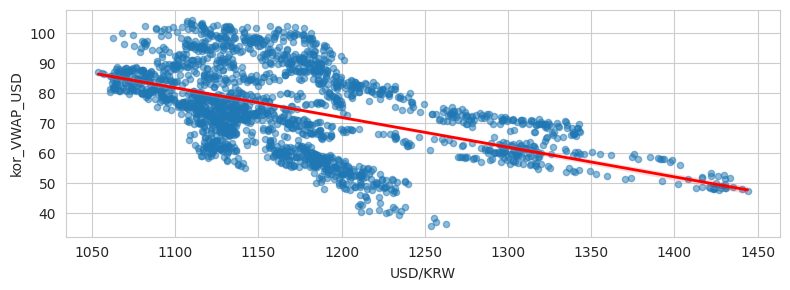

USD/KRW와 kor_VWAP_USD 사이의 상관계수 : -0.52
p-value: 8.640022543651316e-142



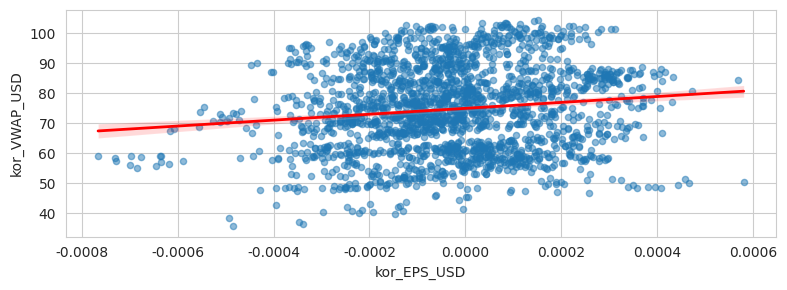

kor_EPS_USD와 kor_VWAP_USD 사이의 상관계수 : 0.13
p-value: 2.9128244939356143e-09



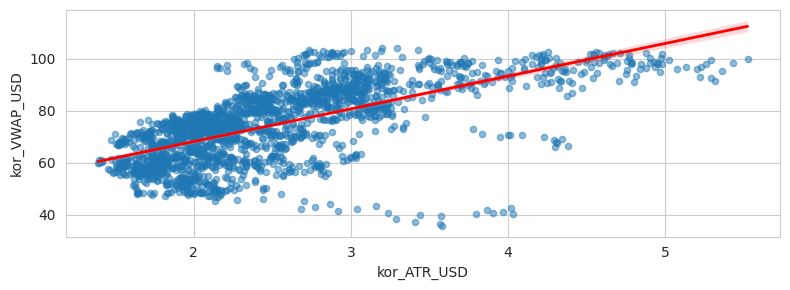

kor_ATR_USD와 kor_VWAP_USD 사이의 상관계수 : 0.66
p-value: 1.0382081864960742e-257



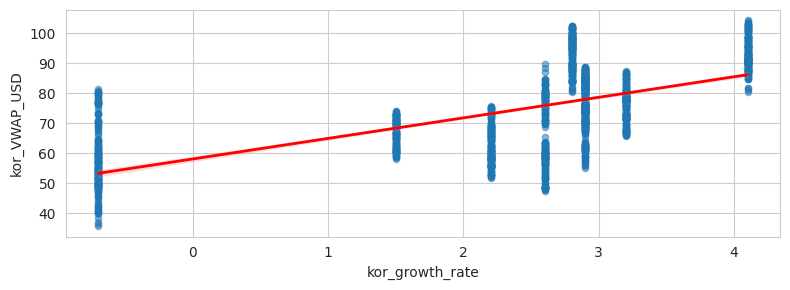

kor_growth_rate와 kor_VWAP_USD 사이의 상관계수 : 0.62
p-value: 5.73159138829105e-223



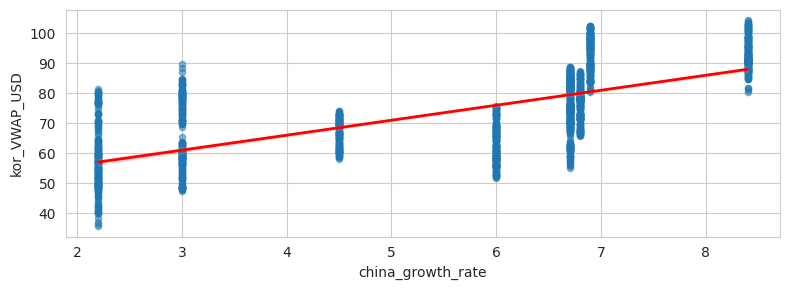

china_growth_rate와 kor_VWAP_USD 사이의 상관계수 : 0.68
p-value: 1.20931081630874e-281



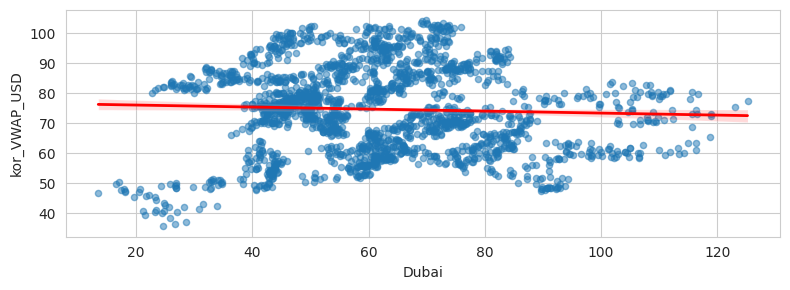

Dubai와 kor_VWAP_USD 사이의 상관계수 : -0.04
p-value: 0.04399850198224662



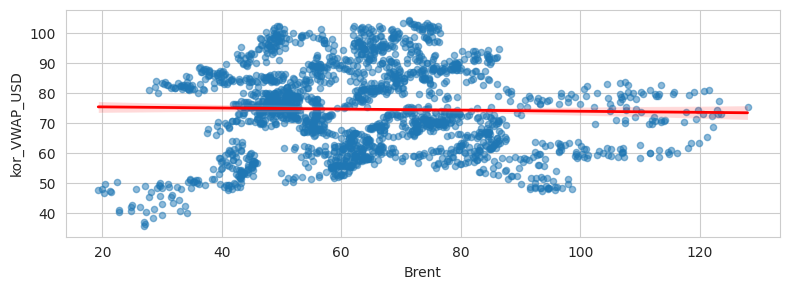

Brent와 kor_VWAP_USD 사이의 상관계수 : -0.02
p-value: 0.28101207744386986



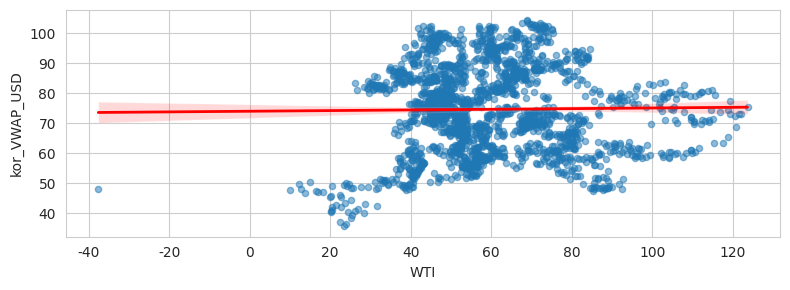

WTI와 kor_VWAP_USD 사이의 상관계수 : 0.01
p-value: 0.5284442625749639



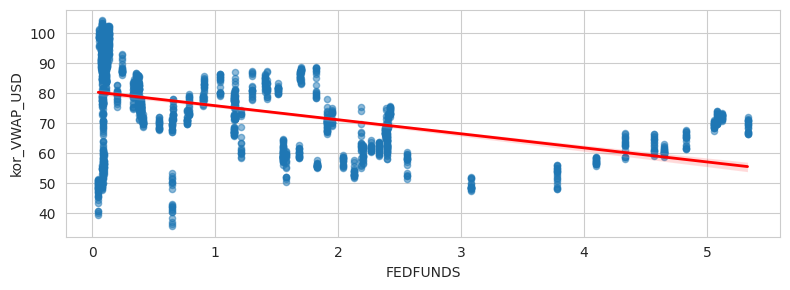

FEDFUNDS와 kor_VWAP_USD 사이의 상관계수 : -0.46
p-value: 5.664825086454241e-109



In [59]:
draw_two(ak, check_two)

In [60]:
correlation_matrix = ak[check_one].corr()

correlation_matrix

,EPS_28,VWAP,ATR,growth_rate,USD/KRW,kor_EPS_USD,kor_VWAP_USD,kor_ATR_USD,kor_growth_rate,china_growth_rate,Dubai,Brent,WTI,FEDFUNDS
EPS_28,1.000000,0.076889,-0.197151,0.018920,0.098166,0.114968,-0.013124,-0.190377,0.020476,0.048233,-0.013460,-0.016708,-0.035813,0.191974
VWAP,0.076889,1.000000,0.682445,0.106422,0.536972,0.024940,-0.111484,-0.189124,-0.062633,-0.288104,0.668188,0.645137,0.665055,0.418650
ATR,-0.197151,0.682445,1.000000,-0.171995,0.507929,-0.087767,-0.326246,-0.031788,-0.291831,-0.530356,0.415391,0.409218,0.422595,0.111925
growth_rate,0.018920,0.106422,-0.171995,1.000000,-0.215490,-0.034170,0.616245,0.265584,0.958356,0.819112,0.346904,0.362968,0.367736,-0.062343
USD/KRW,0.098166,0.536972,0.507929,-0.215490,1.000000,-0.098039,-0.517216,-0.355182,-0.254964,-0.566648,0.435203,0.429088,0.437618,0.545560
kor_EPS_USD,0.114968,0.024940,-0.087767,-0.034170,-0.098039,1.000000,0.130097,0.039932,-0.055204,-0.014448,0.031786,0.027789,0.009896,0.108180
kor_VWAP_USD,-0.013124,-0.111484,-0.326246,0.616245,-0.517216,0.130097,1.000000,0.658971,0.623457,0.680904,-0.044306,-0.023723,0.013873,-0.460417
kor_ATR_USD,-0.190377,-0.189124,-0.031788,0.265584,-0.355182,0.039932,0.658971,1.000000,0.221246,0.340798,-0.152040,-0.143668,-0.137380,-0.422893
kor_growth_rate,0.020476,-0.062633,-0.291831,0.958356,-0.254964,-0.055204,0.623457,0.221246,1.000000,0.828889,0.246692,0.272245,0.287573,-0.146148
china_growth_rate,0.048233,-0.288104,-0.530356,0.819112,-0.566648,-0.014448,0.680904,0.340798,0.828889,1.000000,-0.166836,-0.155473,-0.150392,-0.248039


In [61]:
correlation_matrix[['kor_VWAP_USD']].T

,EPS_28,VWAP,ATR,growth_rate,USD/KRW,kor_EPS_USD,kor_VWAP_USD,kor_ATR_USD,kor_growth_rate,china_growth_rate,Dubai,Brent,WTI,FEDFUNDS
kor_VWAP_USD,-0.013124,-0.111484,-0.326246,0.616245,-0.517216,0.130097,1.0,0.658971,0.623457,0.680904,-0.044306,-0.023723,0.013873,-0.460417


In [62]:
result1.append(('XLY', correlation_matrix['kor_VWAP_USD']['VWAP']))

## XLP
  + XLP : Consumer Staples
    + 필수 소비재, 필수적으로 소비해야 하는 것들의 판매하는 회사

### NH에서 준 정보를 활용한 상관관계 분석


In [63]:
stock_name = ['KT&G', 'gs 리테일', '이마트', '아모레퍼시픽', 'lg 생활건강', '오리온', 'cj제일제당', '하이트진로', '농심', '오뚜기', '롯데칠성', 'SPC삼립']
stock_code = ['033780', '007070', '139480', '090430', '051900', '271560', '097950', '000080', '004370', '007310', '005300', '005610']

etf = ['XLP']

year = '2023'
date = '0101'

find_best_R(etf, stock_name, stock_code, year, date, 0)

['거래일자', '시가', '고가', '저가', '종가', '거래량']
주식 받아오기 끝
가능한 조합: 4095
상관계수 : 0.5383818907616127, p-value : 2.4916810592369795e-13 ['농심']
end


### 주식 중 XLP에 해당하는 주식 찾기

In [64]:
america_list = list(sector_info.loc[sector_info['sector_name']=='XLP', 'tck_iem_cd'].unique())
korea_list = ['033780', '007070', '139480', '090430', '051900', '271560', '097950', '000080', '004370', '007310', '005300', '005610']

In [ ]:
ak = return_ak(america_list, korea_list)

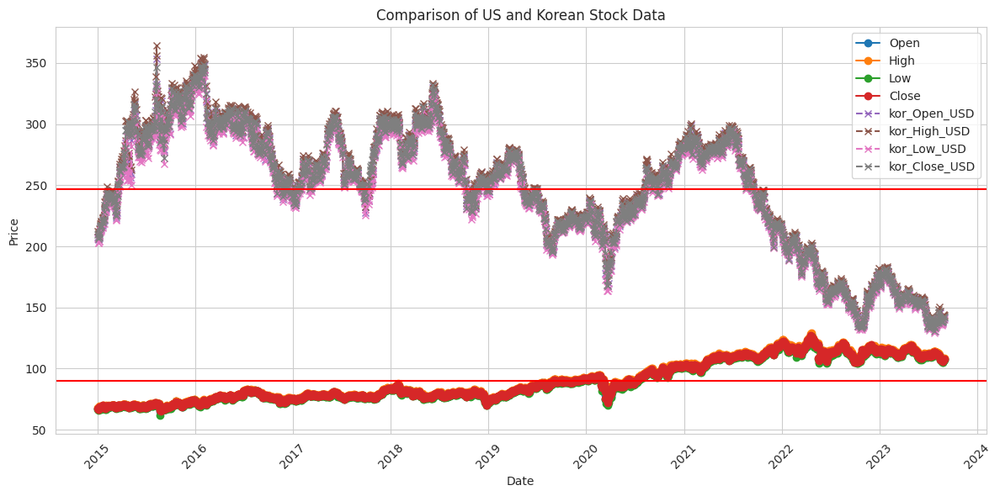

In [66]:
plt.figure(figsize=(12, 6))
plt.plot(ak.index, ak['Open'], label='Open', marker='o')
plt.plot(ak.index, ak['High'], label='High', marker='o')
plt.plot(ak.index, ak['Low'], label='Low', marker='o')
plt.plot(ak.index, ak['Close'], label='Close', marker='o')

plt.plot(ak.index, ak['kor_Open_USD'], label='kor_Open_USD', linestyle='--', marker='x')
plt.plot(ak.index, ak['kor_High_USD'], label='kor_High_USD', linestyle='--', marker='x')
plt.plot(ak.index, ak['kor_Low_USD'], label='kor_Low_USD', linestyle='--', marker='x')
plt.plot(ak.index, ak['kor_Close_USD'], label='kor_Close_USD', linestyle='--', marker='x')

plt.title('Comparison of US and Korean Stock Data')
plt.xlabel('Date')
plt.axhline(y=((ak['Open']+ak['High']+ak['Low']+ak['Close'])/4).mean(), color='red')
plt.axhline(y=((ak['kor_Open_USD']+ak['kor_High_USD']+ak['kor_Low_USD']+ak['kor_Close_USD'])/4).mean(), color='red')
plt.ylabel('Price')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()

plt.show()

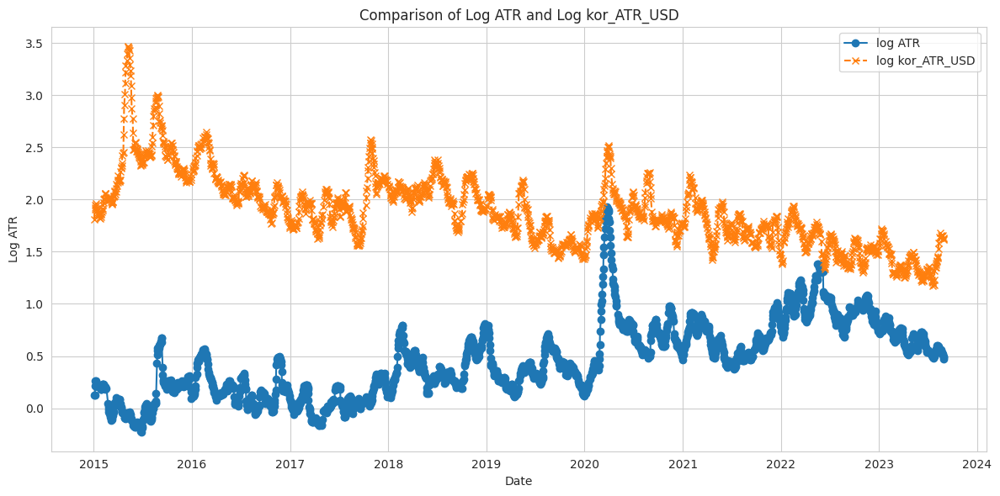

In [67]:
us_atr = ak['ATR']
kor_atr_usd = ak['kor_ATR_USD']

log_us_atr = np.log(us_atr)
log_kor_atr_usd = np.log(kor_atr_usd)

plt.figure(figsize=(12, 6))
plt.plot(ak.index, log_us_atr, label='log ATR', marker='o')
plt.plot(ak.index, log_kor_atr_usd, label='log kor_ATR_USD', linestyle='--', marker='x')

plt.title('Comparison of Log ATR and Log kor_ATR_USD')
plt.xlabel('Date')
plt.ylabel('Log ATR')
plt.legend()
plt.tight_layout()
plt.show()

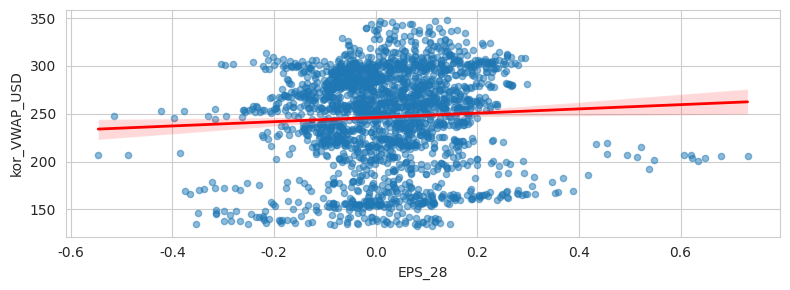

EPS_28와 kor_VWAP_USD 사이의 상관계수 : 0.06
p-value: 0.009278964696804852



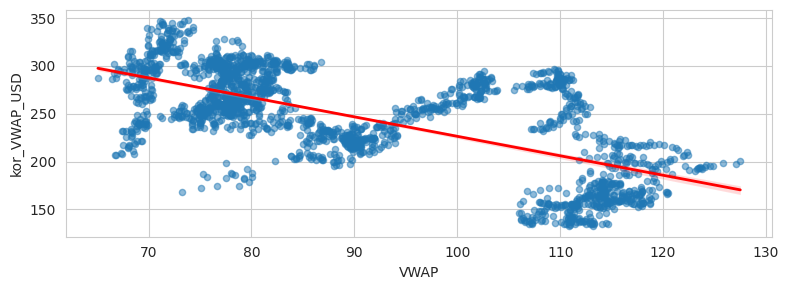

VWAP와 kor_VWAP_USD 사이의 상관계수 : -0.67
p-value: 1.6402547093620327e-268



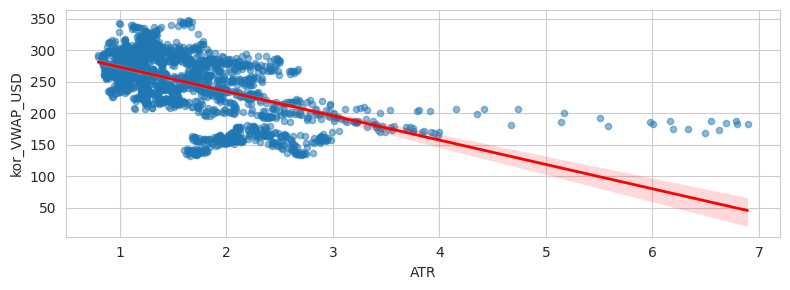

ATR와 kor_VWAP_USD 사이의 상관계수 : -0.55
p-value: 1.0991492335288398e-165



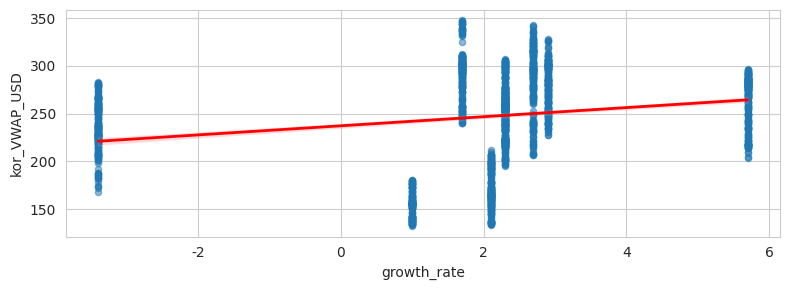

growth_rate와 kor_VWAP_USD 사이의 상관계수 : 0.22
p-value: 1.8735726065346505e-23



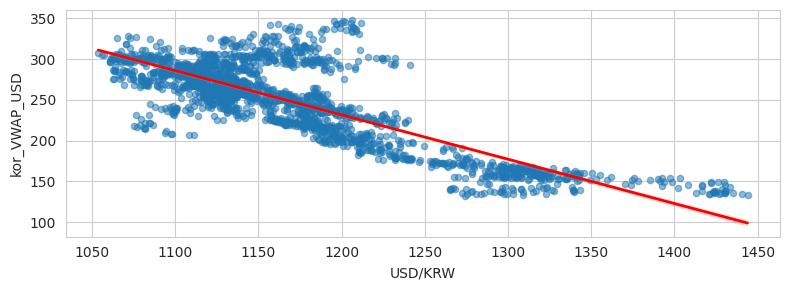

USD/KRW와 kor_VWAP_USD 사이의 상관계수 : -0.81
p-value: 0.0



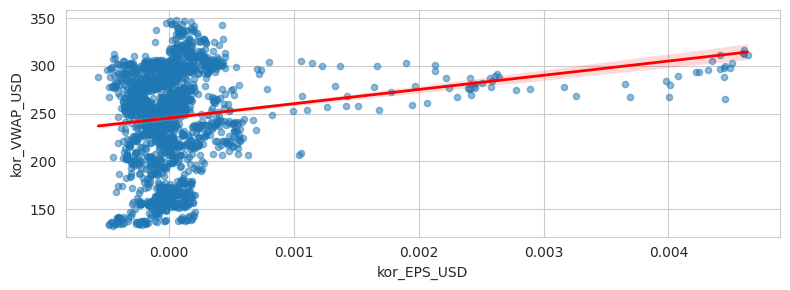

kor_EPS_USD와 kor_VWAP_USD 사이의 상관계수 : 0.17
p-value: 3.309290596388727e-15



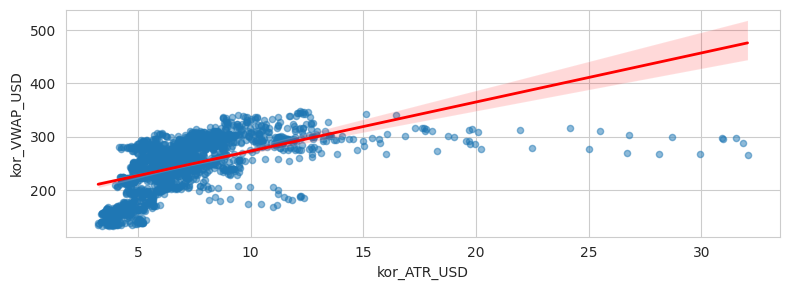

kor_ATR_USD와 kor_VWAP_USD 사이의 상관계수 : 0.56
p-value: 2.693153423259726e-172



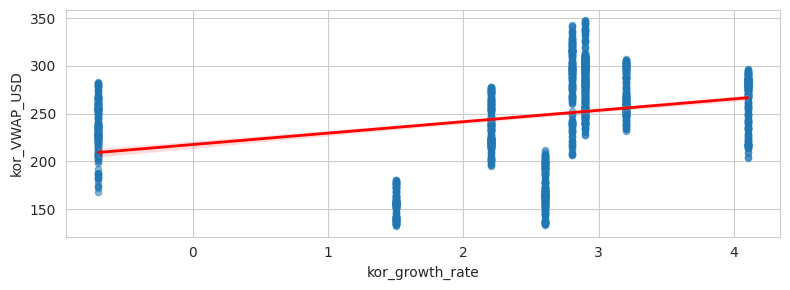

kor_growth_rate와 kor_VWAP_USD 사이의 상관계수 : 0.31
p-value: 1.4050883037973934e-46



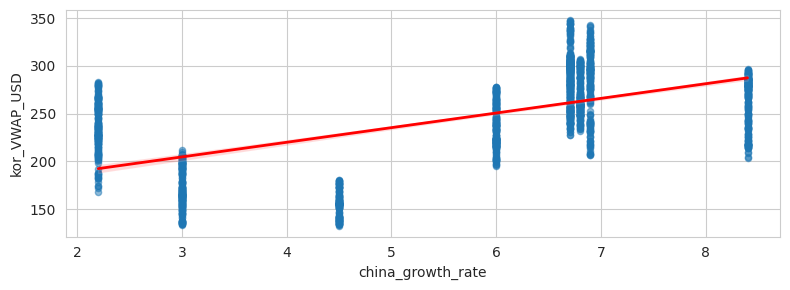

china_growth_rate와 kor_VWAP_USD 사이의 상관계수 : 0.59
p-value: 1.9292131995496286e-195



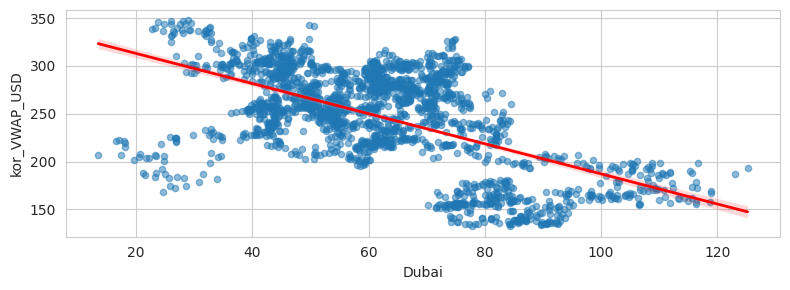

Dubai와 kor_VWAP_USD 사이의 상관계수 : -0.59
p-value: 8.453489988274062e-194



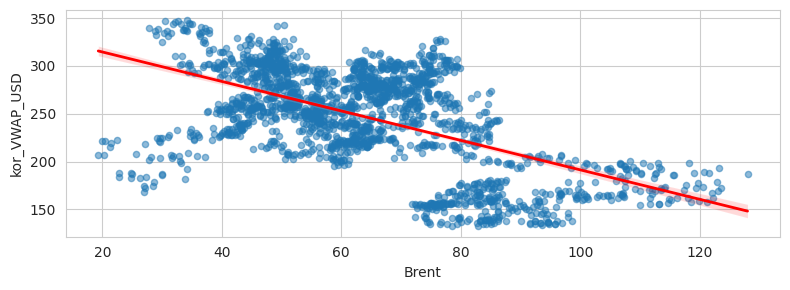

Brent와 kor_VWAP_USD 사이의 상관계수 : -0.57
p-value: 5.1245607964857145e-179



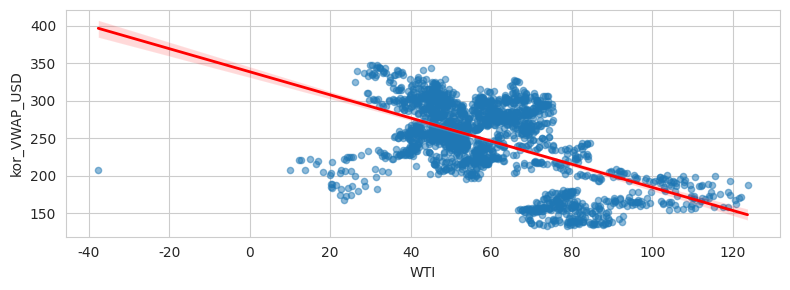

WTI와 kor_VWAP_USD 사이의 상관계수 : -0.56
p-value: 3.224854802199597e-169



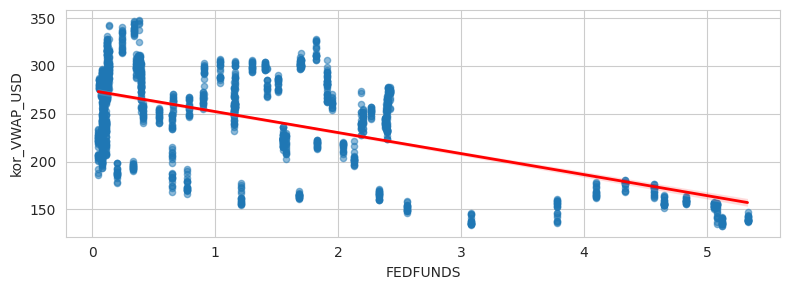

FEDFUNDS와 kor_VWAP_USD 사이의 상관계수 : -0.61
p-value: 3.420307198233631e-212



In [68]:
draw_two(ak, check_two)

In [69]:
correlation_matrix = ak[check_one].corr()

correlation_matrix

,EPS_28,VWAP,ATR,growth_rate,USD/KRW,kor_EPS_USD,kor_VWAP_USD,kor_ATR_USD,kor_growth_rate,china_growth_rate,Dubai,Brent,WTI,FEDFUNDS
EPS_28,1.000000,0.030040,0.054682,-0.042344,0.038471,-0.034331,0.057211,0.057320,-0.023800,-0.024077,-0.095460,-0.084026,-0.101755,-0.064245
VWAP,0.030040,1.000000,0.545100,0.059991,0.603455,-0.250685,-0.669103,-0.593146,-0.067571,-0.382549,0.676333,0.663990,0.694549,0.319691
ATR,0.054682,0.545100,1.000000,-0.241000,0.499147,-0.212809,-0.552702,-0.222065,-0.320486,-0.544036,0.293152,0.296088,0.304462,0.084808
growth_rate,-0.042344,0.059991,-0.241000,1.000000,-0.215490,0.016550,0.217013,0.035089,0.958356,0.819112,0.346904,0.362968,0.367736,-0.062343
USD/KRW,0.038471,0.603455,0.499147,-0.215490,1.000000,-0.188839,-0.805163,-0.385934,-0.254964,-0.566648,0.435203,0.429088,0.437618,0.545560
kor_EPS_USD,-0.034331,-0.250685,-0.212809,0.016550,-0.188839,1.000000,0.172103,0.570539,0.033727,0.081339,-0.039017,-0.031435,-0.055579,-0.101163
kor_VWAP_USD,0.057211,-0.669103,-0.552702,0.217013,-0.805163,0.172103,1.000000,0.561812,0.307717,0.591632,-0.589616,-0.570792,-0.557606,-0.611426
kor_ATR_USD,0.057320,-0.593146,-0.222065,0.035089,-0.385934,0.570539,0.561812,1.000000,0.105754,0.270489,-0.400310,-0.380166,-0.390004,-0.392433
kor_growth_rate,-0.023800,-0.067571,-0.320486,0.958356,-0.254964,0.033727,0.307717,0.105754,1.000000,0.828889,0.246692,0.272245,0.287573,-0.146148
china_growth_rate,-0.024077,-0.382549,-0.544036,0.819112,-0.566648,0.081339,0.591632,0.270489,0.828889,1.000000,-0.166836,-0.155473,-0.150392,-0.248039


In [70]:
correlation_matrix[['kor_VWAP_USD']].T

,EPS_28,VWAP,ATR,growth_rate,USD/KRW,kor_EPS_USD,kor_VWAP_USD,kor_ATR_USD,kor_growth_rate,china_growth_rate,Dubai,Brent,WTI,FEDFUNDS
kor_VWAP_USD,0.057211,-0.669103,-0.552702,0.217013,-0.805163,0.172103,1.0,0.561812,0.307717,0.591632,-0.589616,-0.570792,-0.557606,-0.611426


In [71]:
result1.append(('XLP', correlation_matrix['kor_VWAP_USD']['VWAP']))

## XLE
  + XLE : Energy
    + 에너지 관련 회사들이 속해 있는 섹터

### NH에서 준 정보를 활용한 상관관계 분석


In [72]:
stock_name= ['한화솔루션','HD현대에너지솔루션','GS','oil','한국쉘석유','SK이노베이션','롯데케미칼','금호석유','대한유화']
stock_code = ['009830','322000','078930','010950','002960','096770','011170','011780','006650']
etf = ['XLE']

year = '2023'
date = '0101'

find_best_R(etf, stock_name, stock_code, year, date, 0)

['거래일자', '시가', '고가', '저가', '종가', '거래량']
주식 받아오기 끝
가능한 조합: 511
상관계수 : 0.2983385770519454, p-value : 0.0001336792742574615 ['GS']
상관계수 : 0.4030162974180228, p-value : 1.387870197283934e-07 ['oil']
end


### 주식 중 XLE에 해당하는 주식 찾기 - 상관관계 약화로 진행X
+ NH에서 준 데이터로 조사한 결과 상관계수가 0.5를 넘지 못해 생략

## XLF
  + XLF : Financials
    + 금융, 금융회사들이 속해 있는 섹터

#### NH에서 준 정보를 활용한 상관관계 분석

In [73]:
stock_name= ['국민은행', '하나은행', '신한은행', '우리은행','기업은행','카카오뱅크','DGB금융지주']
stock_code = ['105560', '086790', '055550', '316140','024110','323410','139130']

etf = ['XLF']

year = '2023'
date = '0101'

find_best_R(etf, stock_name, stock_code, year, date, 0)

['거래일자', '시가', '고가', '저가', '종가', '거래량']
주식 받아오기 끝
가능한 조합: 127
상관계수 : 0.5533717105327892, p-value : 3.8921908116134825e-14 ['국민은행']
상관계수 : 0.7875308729324983, p-value : 7.9432962845276e-35 ['하나은행']
상관계수 : 0.7887342972888637, p-value : 5.353631357190919e-35 ['하나은행' '신한은행']
상관계수 : 0.7933596213531962, p-value : 1.146877591694344e-35 ['하나은행' 'DGB금융지주']
end


### 주식 중 XLF에 해당하는 주식 찾기

In [74]:
america_list = list(sector_info.loc[sector_info['sector_name']=='XLF', 'tck_iem_cd'].unique())
korea_list = ['105560', '086790', '055550', '316140','024110','323410','139130']

In [ ]:
ak = return_ak(america_list, korea_list)

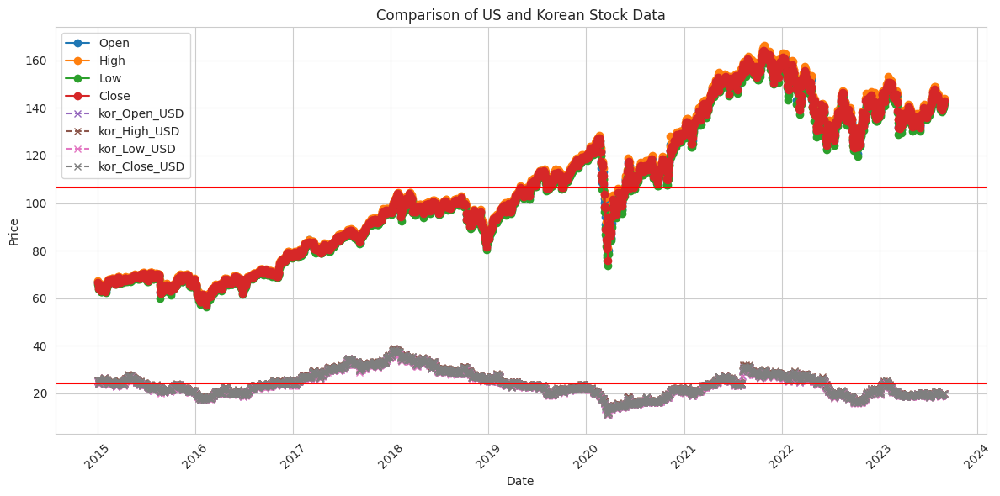

In [76]:
plt.figure(figsize=(12, 6))
plt.plot(ak.index, ak['Open'], label='Open', marker='o')
plt.plot(ak.index, ak['High'], label='High', marker='o')
plt.plot(ak.index, ak['Low'], label='Low', marker='o')
plt.plot(ak.index, ak['Close'], label='Close', marker='o')

plt.plot(ak.index, ak['kor_Open_USD'], label='kor_Open_USD', linestyle='--', marker='x')
plt.plot(ak.index, ak['kor_High_USD'], label='kor_High_USD', linestyle='--', marker='x')
plt.plot(ak.index, ak['kor_Low_USD'], label='kor_Low_USD', linestyle='--', marker='x')
plt.plot(ak.index, ak['kor_Close_USD'], label='kor_Close_USD', linestyle='--', marker='x')

plt.title('Comparison of US and Korean Stock Data')
plt.xlabel('Date')
plt.axhline(y=((ak['Open']+ak['High']+ak['Low']+ak['Close'])/4).mean(), color='red')
plt.axhline(y=((ak['kor_Open_USD']+ak['kor_High_USD']+ak['kor_Low_USD']+ak['kor_Close_USD'])/4).mean(), color='red')
plt.ylabel('Price')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()

plt.show()

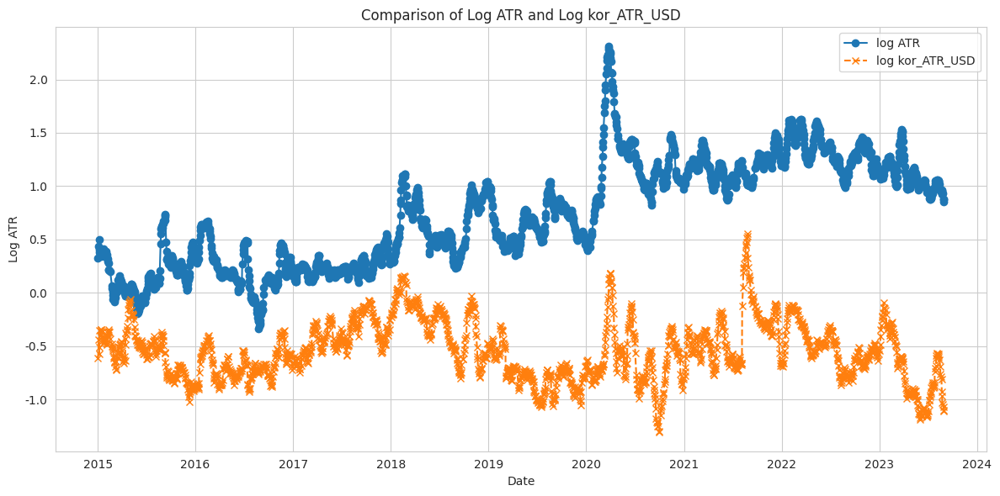

In [77]:
us_atr = ak['ATR']
kor_atr_usd = ak['kor_ATR_USD']

log_us_atr = np.log(us_atr)
log_kor_atr_usd = np.log(kor_atr_usd)

plt.figure(figsize=(12, 6))
plt.plot(ak.index, log_us_atr, label='log ATR', marker='o')
plt.plot(ak.index, log_kor_atr_usd, label='log kor_ATR_USD', linestyle='--', marker='x')

plt.title('Comparison of Log ATR and Log kor_ATR_USD')
plt.xlabel('Date')
plt.ylabel('Log ATR')
plt.legend()
plt.tight_layout()
plt.show()

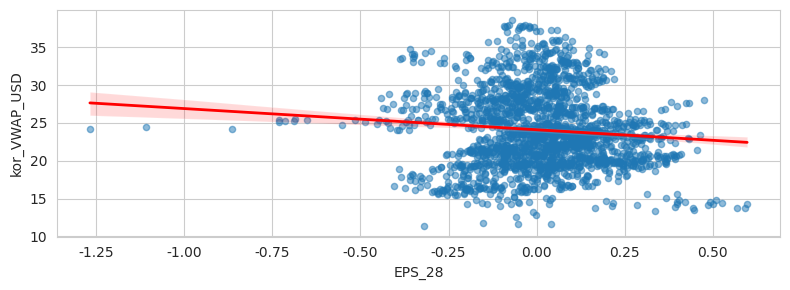

EPS_28와 kor_VWAP_USD 사이의 상관계수 : -0.10
p-value: 9.619062929622622e-06



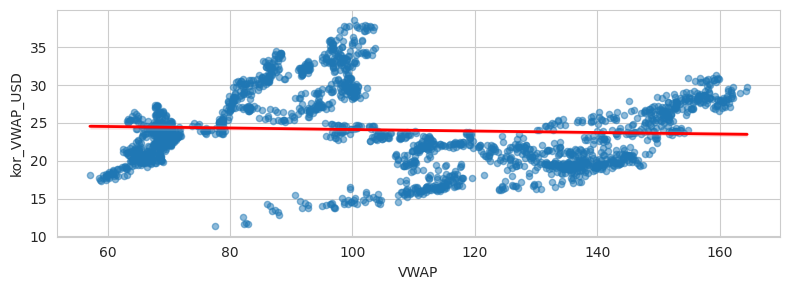

VWAP와 kor_VWAP_USD 사이의 상관계수 : -0.06
p-value: 0.007069559181445748



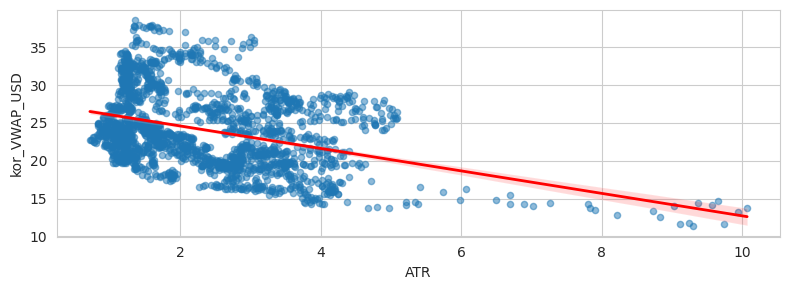

ATR와 kor_VWAP_USD 사이의 상관계수 : -0.37
p-value: 1.5303917626167915e-66



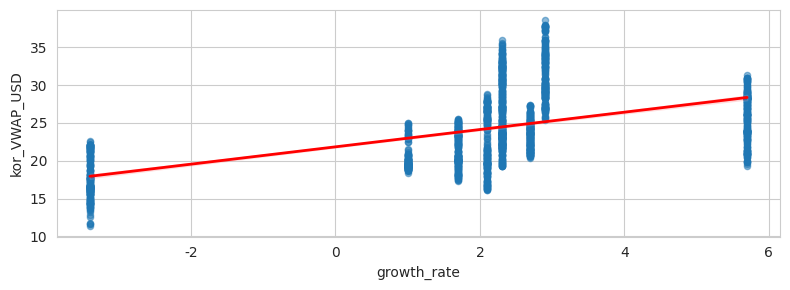

growth_rate와 kor_VWAP_USD 사이의 상관계수 : 0.52
p-value: 3.930303460145389e-145



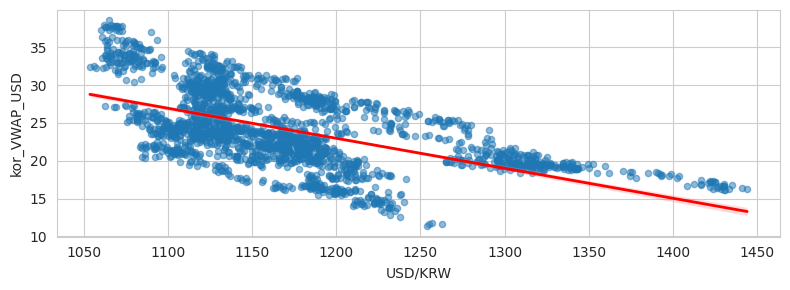

USD/KRW와 kor_VWAP_USD 사이의 상관계수 : -0.59
p-value: 4.539549516072703e-192



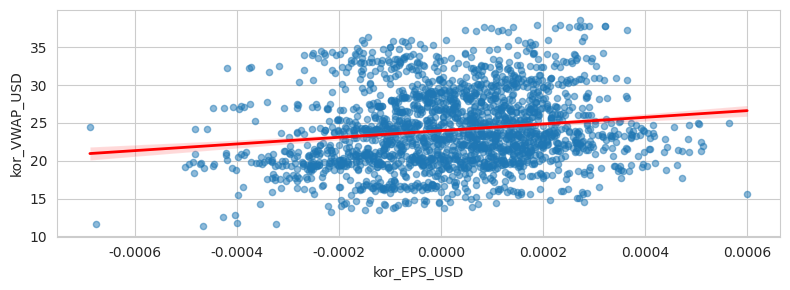

kor_EPS_USD와 kor_VWAP_USD 사이의 상관계수 : 0.16
p-value: 9.888959908042096e-13



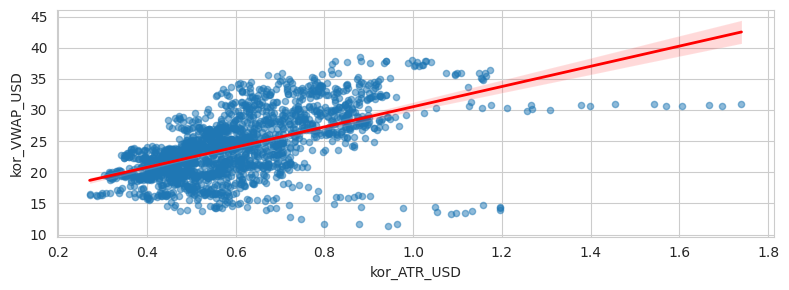

kor_ATR_USD와 kor_VWAP_USD 사이의 상관계수 : 0.57
p-value: 1.294692665948808e-178



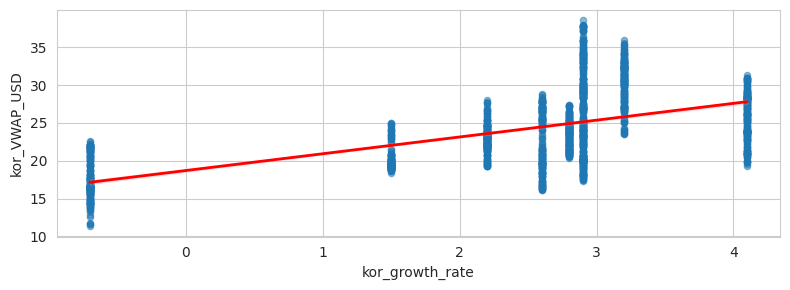

kor_growth_rate와 kor_VWAP_USD 사이의 상관계수 : 0.57
p-value: 2.205185863999329e-180



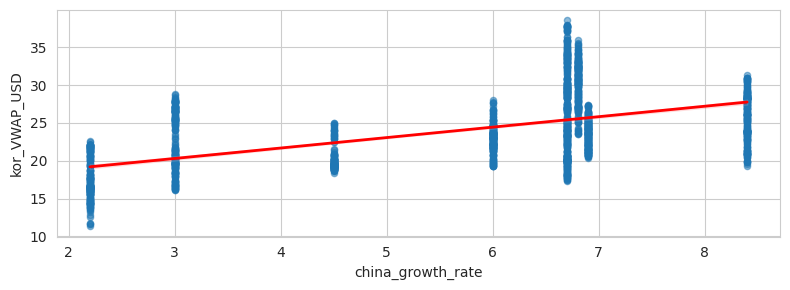

china_growth_rate와 kor_VWAP_USD 사이의 상관계수 : 0.53
p-value: 1.2146077112693584e-152



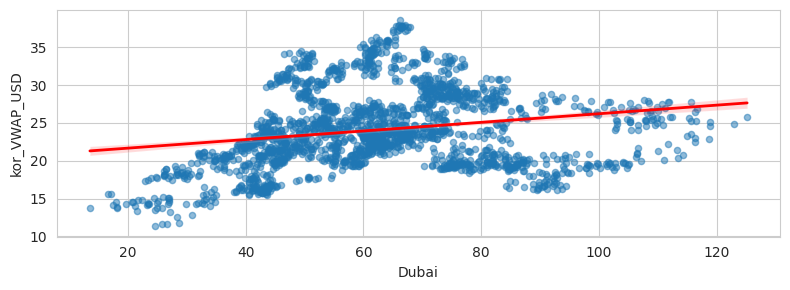

Dubai와 kor_VWAP_USD 사이의 상관계수 : 0.21
p-value: 1.4189080619804056e-22



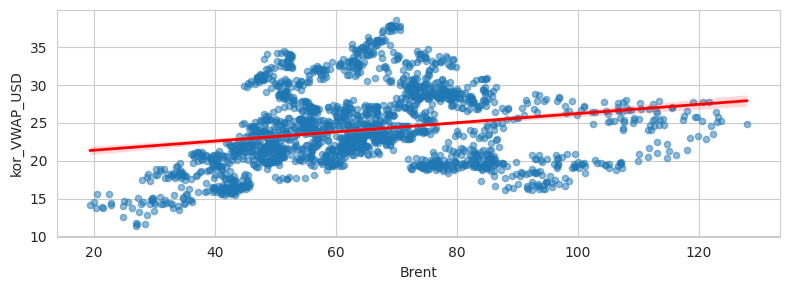

Brent와 kor_VWAP_USD 사이의 상관계수 : 0.22
p-value: 5.431293679714035e-25



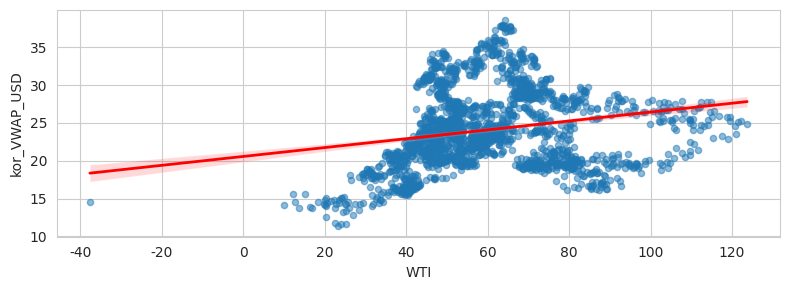

WTI와 kor_VWAP_USD 사이의 상관계수 : 0.21
p-value: 2.0567451869947652e-22



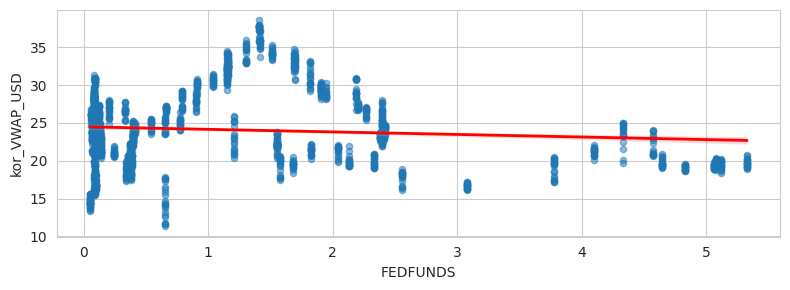

FEDFUNDS와 kor_VWAP_USD 사이의 상관계수 : -0.09
p-value: 1.7690220136351654e-05



In [78]:
draw_two(ak, check_two)

In [79]:
correlation_matrix = ak[check_one].corr()

correlation_matrix

,EPS_28,VWAP,ATR,growth_rate,USD/KRW,kor_EPS_USD,kor_VWAP_USD,kor_ATR_USD,kor_growth_rate,china_growth_rate,Dubai,Brent,WTI,FEDFUNDS
EPS_28,1.000000,-0.004209,-0.105178,-0.042238,0.047975,0.118407,-0.097170,-0.091967,-0.029287,-0.017131,-0.039463,-0.031662,-0.059186,0.107811
VWAP,-0.004209,1.000000,0.644065,0.128132,0.447312,0.070471,-0.059229,0.105664,-0.045861,-0.277550,0.678478,0.656588,0.670921,0.304705
ATR,-0.105178,0.644065,1.000000,-0.222602,0.490705,-0.108223,-0.366013,0.214724,-0.337659,-0.521550,0.311077,0.304220,0.316039,0.084800
growth_rate,-0.042238,0.128132,-0.222602,1.000000,-0.215490,-0.006448,0.522441,0.249475,0.958356,0.819112,0.346904,0.362968,0.367736,-0.062343
USD/KRW,0.047975,0.447312,0.490705,-0.215490,1.000000,-0.064809,-0.587475,-0.286002,-0.254964,-0.566648,0.435203,0.429088,0.437618,0.545560
kor_EPS_USD,0.118407,0.070471,-0.108223,-0.006448,-0.064809,1.000000,0.156004,0.065032,0.023342,0.022872,-0.048439,-0.039737,-0.016494,-0.083412
kor_VWAP_USD,-0.097170,-0.059229,-0.366013,0.522441,-0.587475,0.156004,1.000000,0.570262,0.572584,0.533858,0.212703,0.224337,0.211902,-0.094255
kor_ATR_USD,-0.091967,0.105664,0.214724,0.249475,-0.286002,0.065032,0.570262,1.000000,0.257692,0.206444,0.123541,0.138462,0.136206,-0.203954
kor_growth_rate,-0.029287,-0.045861,-0.337659,0.958356,-0.254964,0.023342,0.572584,0.257692,1.000000,0.828889,0.246692,0.272245,0.287573,-0.146148
china_growth_rate,-0.017131,-0.277550,-0.521550,0.819112,-0.566648,0.022872,0.533858,0.206444,0.828889,1.000000,-0.166836,-0.155473,-0.150392,-0.248039


In [80]:
correlation_matrix[['kor_VWAP_USD']].T

,EPS_28,VWAP,ATR,growth_rate,USD/KRW,kor_EPS_USD,kor_VWAP_USD,kor_ATR_USD,kor_growth_rate,china_growth_rate,Dubai,Brent,WTI,FEDFUNDS
kor_VWAP_USD,-0.09717,-0.059229,-0.366013,0.522441,-0.587475,0.156004,1.0,0.570262,0.572584,0.533858,0.212703,0.224337,0.211902,-0.094255


In [81]:
result1.append(('XLF', correlation_matrix['kor_VWAP_USD']['VWAP']))

## XLV
  + XLV : Health Care
    + 헬스케어 관련한 회사

### NH에서 준 정보를 활용한 상관관계 분석


In [82]:
stock_name= ['셀트리온','SK바이오사이언스','셀트리온헬스케어','루닛','뷰노','삼성바이오로직스','유한양행','한미약품','녹십자','종근당']
stock_code = ['068270','302440','091990','328130','338220','207940','000100','128940','006280','185750']

etf = ['XLV']

year = '2023'
date = '0101'

find_best_R(etf, stock_name, stock_code, year, date, 0)

['거래일자', '시가', '고가', '저가', '종가', '거래량']
주식 받아오기 끝
가능한 조합: 1023
상관계수 : 0.017218110647386785, p-value : 0.8294437601671126 ['셀트리온']
상관계수 : 0.0491946584517695, p-value : 0.5380267985476704 ['SK바이오사이언스']
상관계수 : 0.3189947902054599, p-value : 4.1633547560824874e-05 ['셀트리온헬스케어']
상관계수 : 0.36000977181473237, p-value : 3.14704012712576e-06 ['뷰노']
상관계수 : 0.3743652296604025, p-value : 1.1663003205560975e-06 ['셀트리온' '뷰노']
상관계수 : 0.4030263291784331, p-value : 1.3867866064053775e-07 ['셀트리온헬스케어' '뷰노']
상관계수 : 0.4118643600228666, p-value : 6.899143950636439e-08 ['뷰노' '한미약품']
상관계수 : 0.41664312443039325, p-value : 4.689915554977946e-08 ['뷰노' '녹십자']
end


### 주식 중 XLV에 해당하는 주식 찾기 - 상관관계 약화로 진행X
+ NH에서 준 데이터로 조사한 결과 상관계수가 0.5를 넘지 못해 생략

## XLI
+ XLI : Industrials
+ 제조업, 제조업군에 속하는 회사

### NH에서 준 정보를 활용한 상관관계 분석


In [83]:
stock_name= ['현대차','기아차','삼성중공업','HD현대중공업','LG전자','두산에너빌리티','KG모빌리티','삼성전자','현대로템']
stock_code = ['005380','000270','010140','124500','066570','034020','003620','005930','064350']

etf = ['XLI']

year = '2023'
date = '0101'

find_best_R(etf, stock_name, stock_code, year, date, 0)

['거래일자', '시가', '고가', '저가', '종가', '거래량']
주식 받아오기 끝
가능한 조합: 511
상관계수 : 0.39725027003375823, p-value : 2.1651327374299368e-07 ['현대차']
상관계수 : 0.9450738188192935, p-value : 3.8165685598099576e-78 ['삼성중공업']
end


### 주식 중 XLI에 해당하는 주식 찾기

In [84]:
america_list = list(sector_info.loc[sector_info['sector_name']=='XLI', 'tck_iem_cd'].unique())
korea_list = ['005380','000270','010140','124500','066570','034020','003620','005930','064350']

In [ ]:
ak = return_ak(america_list, korea_list)

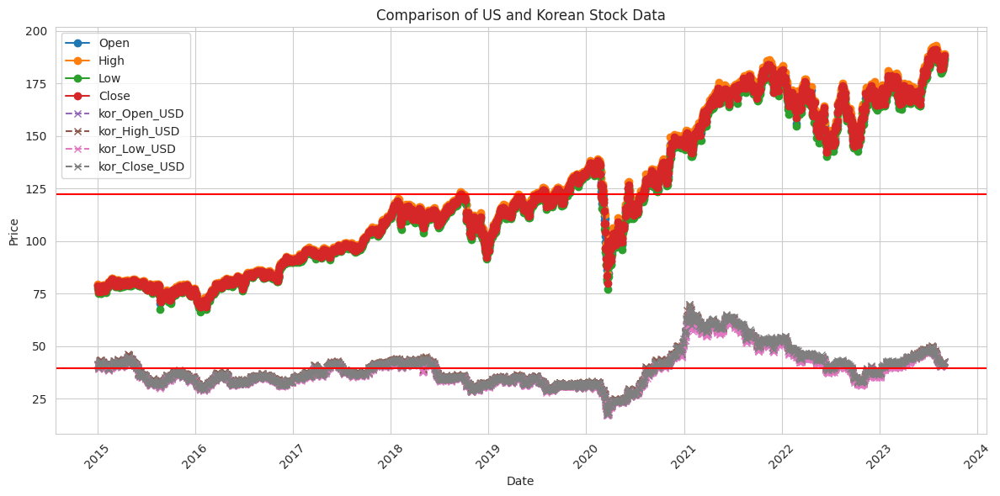

In [86]:
plt.figure(figsize=(12, 6))
plt.plot(ak.index, ak['Open'], label='Open', marker='o')
plt.plot(ak.index, ak['High'], label='High', marker='o')
plt.plot(ak.index, ak['Low'], label='Low', marker='o')
plt.plot(ak.index, ak['Close'], label='Close', marker='o')

plt.plot(ak.index, ak['kor_Open_USD'], label='kor_Open_USD', linestyle='--', marker='x')
plt.plot(ak.index, ak['kor_High_USD'], label='kor_High_USD', linestyle='--', marker='x')
plt.plot(ak.index, ak['kor_Low_USD'], label='kor_Low_USD', linestyle='--', marker='x')
plt.plot(ak.index, ak['kor_Close_USD'], label='kor_Close_USD', linestyle='--', marker='x')

plt.title('Comparison of US and Korean Stock Data')
plt.xlabel('Date')
plt.axhline(y=((ak['Open']+ak['High']+ak['Low']+ak['Close'])/4).mean(), color='red')
plt.axhline(y=((ak['kor_Open_USD']+ak['kor_High_USD']+ak['kor_Low_USD']+ak['kor_Close_USD'])/4).mean(), color='red')
plt.ylabel('Price')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()

plt.show()

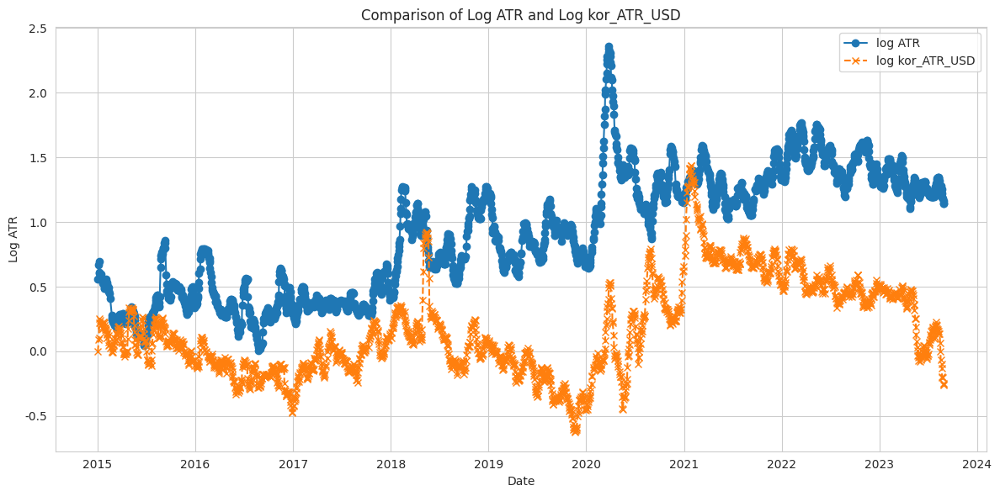

In [87]:
us_atr = ak['ATR']
kor_atr_usd = ak['kor_ATR_USD']

log_us_atr = np.log(us_atr)
log_kor_atr_usd = np.log(kor_atr_usd)

plt.figure(figsize=(12, 6))
plt.plot(ak.index, log_us_atr, label='log ATR', marker='o')
plt.plot(ak.index, log_kor_atr_usd, label='log kor_ATR_USD', linestyle='--', marker='x')

plt.title('Comparison of Log ATR and Log kor_ATR_USD')
plt.xlabel('Date')
plt.ylabel('Log ATR')
plt.legend()
plt.tight_layout()
plt.show()

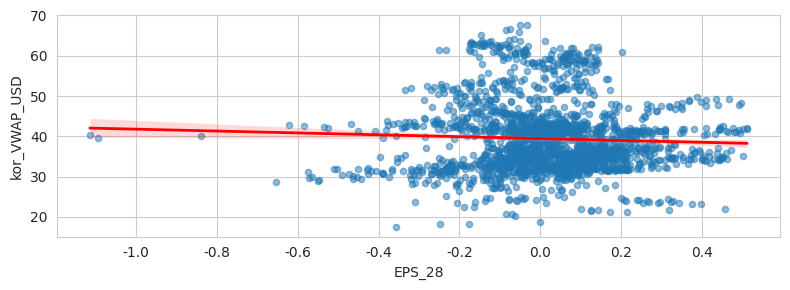

EPS_28와 kor_VWAP_USD 사이의 상관계수 : -0.05
p-value: 0.03331619347058867



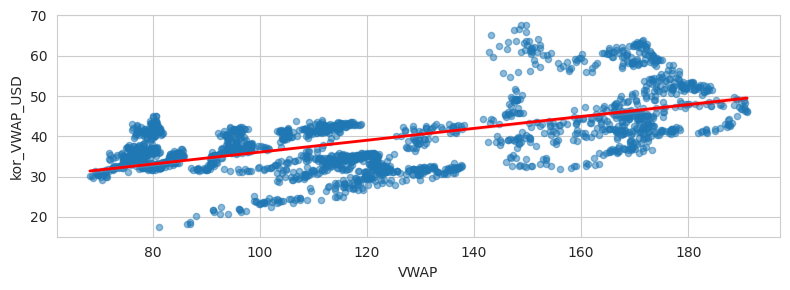

VWAP와 kor_VWAP_USD 사이의 상관계수 : 0.61
p-value: 1.84647072691313e-207



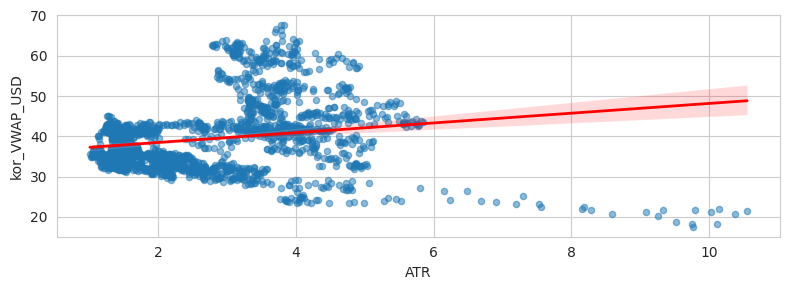

ATR와 kor_VWAP_USD 사이의 상관계수 : 0.19
p-value: 2.1711192052271264e-18



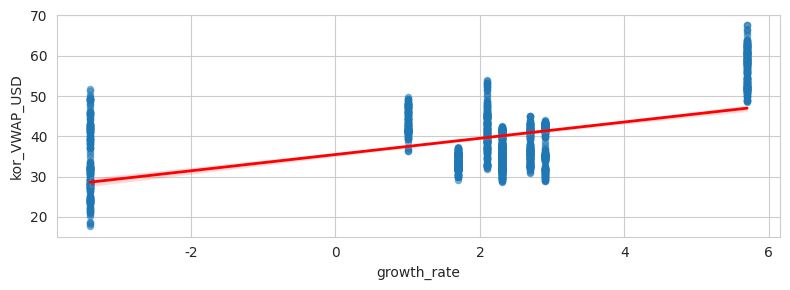

growth_rate와 kor_VWAP_USD 사이의 상관계수 : 0.54
p-value: 1.301483518210575e-158



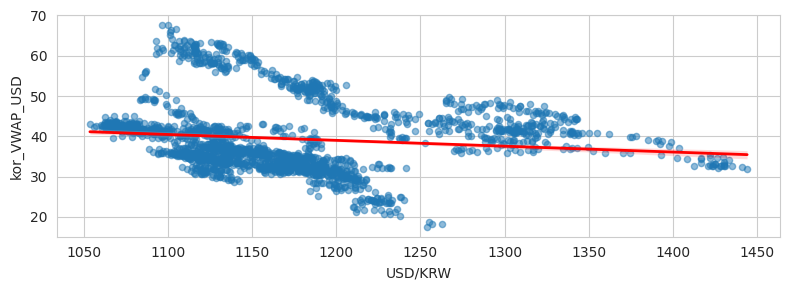

USD/KRW와 kor_VWAP_USD 사이의 상관계수 : -0.13
p-value: 7.081619731337867e-09



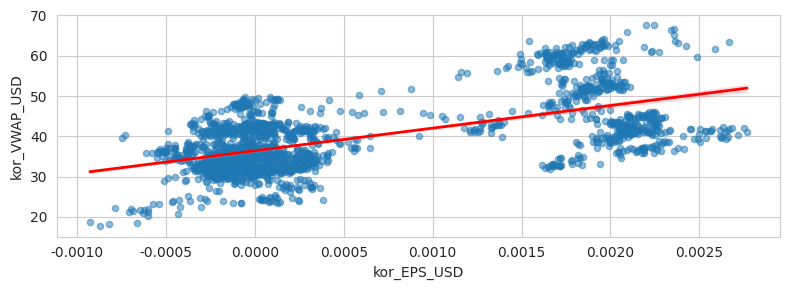

kor_EPS_USD와 kor_VWAP_USD 사이의 상관계수 : 0.61
p-value: 1.903190336829326e-211



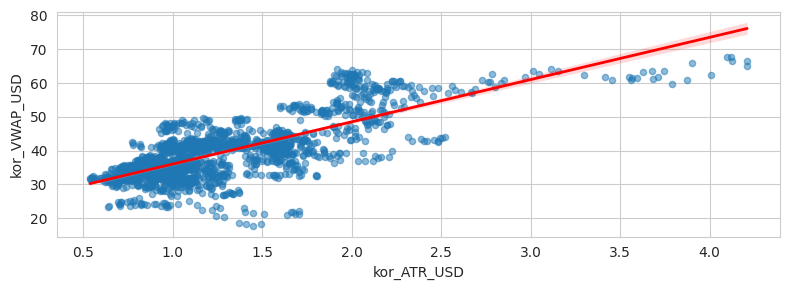

kor_ATR_USD와 kor_VWAP_USD 사이의 상관계수 : 0.76
p-value: 0.0



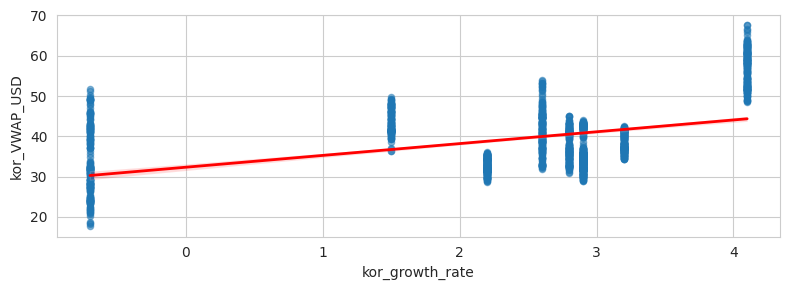

kor_growth_rate와 kor_VWAP_USD 사이의 상관계수 : 0.45
p-value: 2.0070865517499603e-101



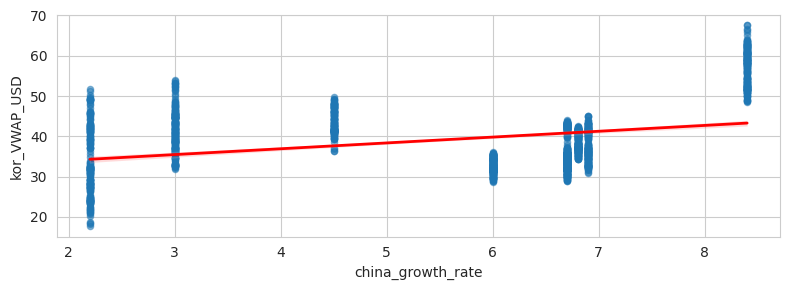

china_growth_rate와 kor_VWAP_USD 사이의 상관계수 : 0.33
p-value: 1.0831725087476879e-53



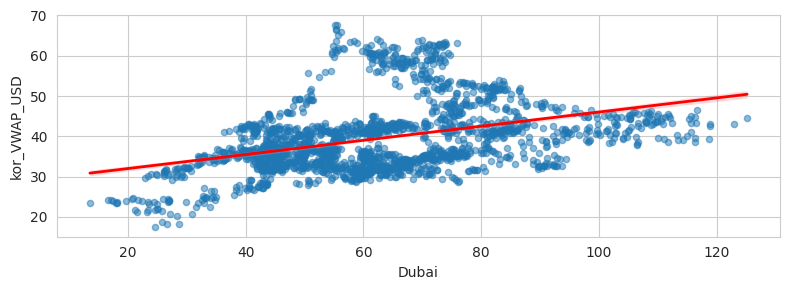

Dubai와 kor_VWAP_USD 사이의 상관계수 : 0.39
p-value: 1.356828749304396e-74



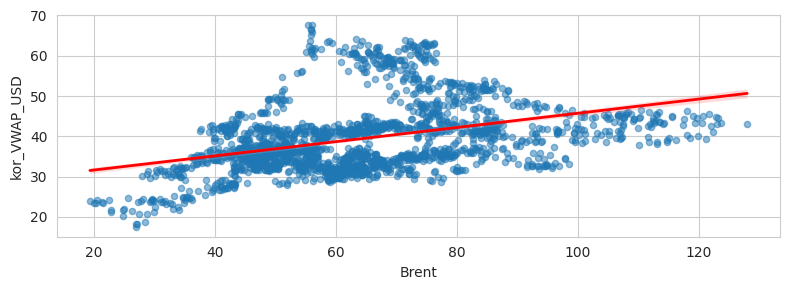

Brent와 kor_VWAP_USD 사이의 상관계수 : 0.38
p-value: 1.0186508181357428e-73



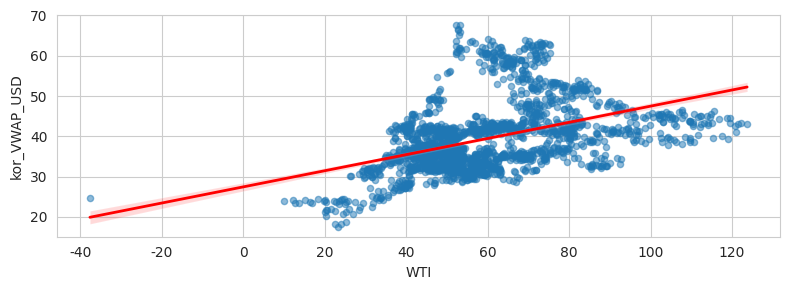

WTI와 kor_VWAP_USD 사이의 상관계수 : 0.43
p-value: 3.0904527855875884e-92



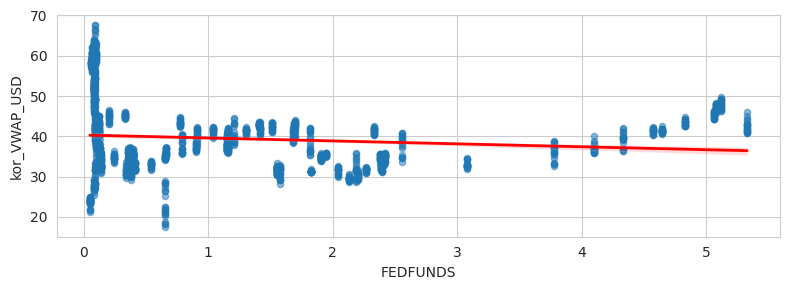

FEDFUNDS와 kor_VWAP_USD 사이의 상관계수 : -0.12
p-value: 5.2454485984930606e-08



In [88]:
draw_two(ak, check_two)

In [89]:
correlation_matrix = ak[check_one].corr()

correlation_matrix

,EPS_28,VWAP,ATR,growth_rate,USD/KRW,kor_EPS_USD,kor_VWAP_USD,kor_ATR_USD,kor_growth_rate,china_growth_rate,Dubai,Brent,WTI,FEDFUNDS
EPS_28,1.000000,0.017249,-0.142894,-0.083501,0.093685,-0.038749,-0.046814,-0.153896,-0.060197,-0.051474,-0.049650,-0.042776,-0.058218,0.114070
VWAP,0.017249,1.000000,0.649009,0.132550,0.501300,0.756362,0.605974,0.584228,-0.035395,-0.277997,0.708955,0.686939,0.701760,0.409245
ATR,-0.142894,0.649009,1.000000,-0.201642,0.522586,0.544612,0.190761,0.530339,-0.325674,-0.536530,0.386888,0.378620,0.385671,0.166356
growth_rate,-0.083501,0.132550,-0.201642,1.000000,-0.215490,0.344044,0.542632,0.345210,0.958356,0.819112,0.346904,0.362968,0.367736,-0.062343
USD/KRW,0.093685,0.501300,0.522586,-0.215490,1.000000,0.459919,-0.126892,0.087014,-0.254964,-0.566648,0.435203,0.429088,0.437618,0.545560
kor_EPS_USD,-0.038749,0.756362,0.544612,0.344044,0.459919,1.000000,0.610574,0.741329,0.252718,-0.112990,0.662236,0.669362,0.694788,0.146502
kor_VWAP_USD,-0.046814,0.605974,0.190761,0.542632,-0.126892,0.610574,1.000000,0.755335,0.445679,0.329966,0.386437,0.384286,0.426702,-0.119360
kor_ATR_USD,-0.153896,0.584228,0.530339,0.345210,0.087014,0.741329,0.755335,1.000000,0.235357,0.055468,0.375537,0.375099,0.405158,-0.148310
kor_growth_rate,-0.060197,-0.035395,-0.325674,0.958356,-0.254964,0.252718,0.445679,0.235357,1.000000,0.828889,0.246692,0.272245,0.287573,-0.146148
china_growth_rate,-0.051474,-0.277997,-0.536530,0.819112,-0.566648,-0.112990,0.329966,0.055468,0.828889,1.000000,-0.166836,-0.155473,-0.150392,-0.248039


In [90]:
correlation_matrix[['kor_VWAP_USD']].T

,EPS_28,VWAP,ATR,growth_rate,USD/KRW,kor_EPS_USD,kor_VWAP_USD,kor_ATR_USD,kor_growth_rate,china_growth_rate,Dubai,Brent,WTI,FEDFUNDS
kor_VWAP_USD,-0.046814,0.605974,0.190761,0.542632,-0.126892,0.610574,1.0,0.755335,0.445679,0.329966,0.386437,0.384286,0.426702,-0.11936


In [91]:
result1.append(('XLI', correlation_matrix['kor_VWAP_USD']['VWAP']))

## 정리
+ XLU, XLF, XLI, XLP, XLK
+ XLRE는 가격이 너무 낮고 변동성도 낮아서 수익성이 낮아보여서 제외

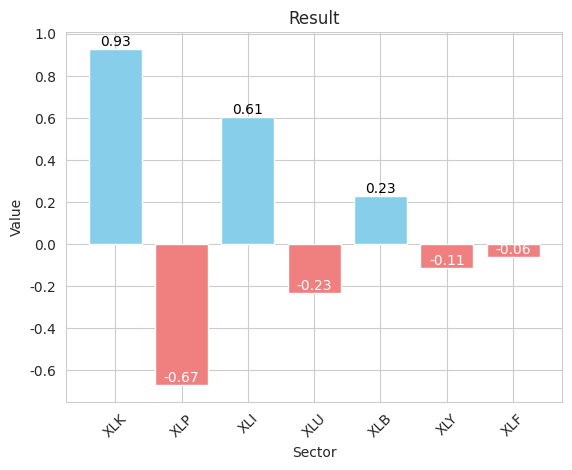

In [92]:
result1.sort(key=lambda x: abs(x[1]), reverse=True)
labels, values = zip(*result1)

colors = ['skyblue' if value >= 0 else 'lightcoral' for value in values]
plt.bar(labels, values, color=colors)
for label, value in zip(labels, values):
    plt.text(label, value, f'{value:.2f}', ha='center', va='bottom', fontsize=10, color='black' if value >= 0 else 'white')

plt.title('Result')
plt.xlabel('Sector')
plt.ylabel('Value')

plt.xticks(rotation=45)
plt.show()

# 중국 데이터 추가

* Sector 별로 기업 볼 수 있는 사이트
    * https://www.tradingview.com/markets/stocks-china/sectorandindustry-sector/
        * 해당 사이트에 들어가서 관심있는 섹터 클릭해서 url을 chinese_ticker에 넘겨주면 됩니다
* API 호출한 사이트
    * yfinance

## 중국이 포함된 메서드 정의

In [93]:
def china_ticker(url):

    ticker_list = []
    response = requests.get(url)
    dom = BeautifulSoup(response.text, 'html.parser')
    elements = dom.select('tr.row-RdUXZpkv.listRow')

    for element in elements:
        ticker = element.get('data-rowkey')
        market_symbol = ticker.split(':')[0]
        ticker = ticker.split(':')[1]

        if market_symbol == 'SZSE':
            ticker += '.SZ'
        else:
            ticker += '.SS'

        ticker_list.append(ticker)
    return ticker_list


In [94]:
yf.pdr_override()

In [95]:
def china_stock_info(stock_list):
    l = []
    stock = pdr.get_data_yahoo(stock_list[0],start = "2015-01-01", end = "2023-08-31")
    if len(stock) == 0:
        print(f'{stock_list[0]}는 2015~2023에 없는 데이터기때문에 제외')
    else:
        l.append(stock_list[0])

    for i in stock_list[1:]:
        temp = pdr.get_data_yahoo(i,start = "2015-01-01", end = "2023-08-31")
        if len(temp) == 0:
            print(f'{i}는 2015~2023에 없는 데이터기때문에 제외')
        else:
            stock = pd.concat([stock, temp], axis=0)
            l.append(i)

        stock = pd.concat([stock, temp], axis=0)
    a_result = stock.groupby(stock.index)[['Open', 'High', 'Low', 'Close', 'Volume']].mean()

    a_result['EPS'] = np.round(((a_result['Close'] - a_result['Open'])/a_result['Open'])*100, 4)
    a_result['EPS_28'] = a_result['EPS'].rolling(28, min_periods=1).mean()
    a_result['VWAP'] = np.round((a_result['Open']+a_result['High']+a_result['Low']+a_result['Close'])/4, 4)

    a_result['High-Low'] = a_result['High'] - a_result['Low']
    a_result['High-PrevClose'] = np.abs(a_result['High'] - a_result['Close'].shift())
    a_result['Low-PrevClose'] = np.abs(a_result['Low'] - a_result['Close'].shift())
    a_result['TR'] = np.max(a_result[['High-Low', 'High-PrevClose', 'Low-PrevClose']], axis=1)
    a_result['ATR'] = a_result['TR'].rolling(14, min_periods=1).mean()
    return a_result[['Open', 'High', 'Low', 'Close', 'Volume', 'EPS_28', 'VWAP', 'ATR']]

In [96]:
# 중국 데이터와 한국 데이터
def return_ak_china(china_list, korea_list, america_list):
    america = stock_info(america_list)

    korea = stock_info(korea_list)
    korea.columns= ['kor_open', 'kor_high', 'kor_low', 'kor_close', 'kor_volume', 'kor_EPS', 'kor_VWAP', 'kor_ATR']

    ak = pd.merge(america, korea, how='inner', on='Date')

    temp = fdr.DataReader('USD/KRW', '2015-01-01', '2023-08-31')[['Close']]


    temp = make_growth_ame(temp, america_growth_rate)
    temp = make_growth_kor(temp, kor_growth_rate)
    temp = make_growth_china(temp, china_growth_rate)

    df22 = fdr.DataReader('FRED:FEDFUNDS', '2014-12-31', '2023-08-31', data_source='fred')[['FEDFUNDS']]
    df22 = df22.resample('D').ffill()

    url = 'https://raw.githubusercontent.com/Hashtae9/MyData/main/crudeOil/Crude_Oil_20150101_20230831.csv'
    oil = pd.read_csv(url, encoding='cp949')
    oil['기간'] = pd.to_datetime(oil['기간'], format='%y년%m월%d일')
    oil = oil.rename(columns={'기간': 'Date', 'Dubai': 'Dubai', 'Brent': 'Brent', 'WTI': 'WTI'})
    oil = oil.set_index('Date')

    temp = pd.concat([temp, df22], axis=1, join='outer')
    temp = pd.concat([temp, oil], axis=1, join='outer')
    temp = temp.fillna(method='ffill')

    temp.reset_index(drop=False, inplace=True)

    temp.columns = ['Date', 'USD/KRW', 'growth_rate', 'kor_growth_rate', 'china_growth_rate', 'FEDFUNDS', 'Dubai', 'Brent', 'WTI']

    ak = pd.merge(ak, temp, how = 'inner', on='Date')

    ak['kor_Open_USD'] = ak['kor_open'] / ak['USD/KRW']
    ak['kor_High_USD'] = ak['kor_high'] / ak['USD/KRW']
    ak['kor_Low_USD'] = ak['kor_low'] / ak['USD/KRW']
    ak['kor_Close_USD'] = ak['kor_close'] / ak['USD/KRW']
    ak['kor_EPS_USD'] = ak['kor_EPS'] / ak['USD/KRW']
    ak['kor_VWAP_USD'] = ak['kor_VWAP'] / ak['USD/KRW']
    ak['kor_ATR_USD'] = ak['kor_ATR'] / ak['USD/KRW']

    china = china_stock_info(china_list)
    china.columns= ['chi_open', 'chi_high', 'chi_low', 'chi_close', 'chi_volume', 'chi_EPS', 'chi_VWAP', 'chi_ATR']

    ak = pd.merge(ak, china, how='inner', on='Date')

    temp = fdr.DataReader('CNY/USD', '2015-01-01', '2023-08-31')[['Close']]
    temp.columns = ['CNY/USD']
    china_korea = fdr.DataReader('KRW/CNY', '2015-01-01', '2023-08-31')[['Close']]
    china_korea.columns = ['KRW/CNY']
    china_korea['CNY/KRW'] = 1/china_korea['KRW/CNY']
    china_korea = china_korea[['CNY/KRW']]
    ak = pd.merge(ak, china_korea, how='inner', on='Date')
    ak = pd.merge(ak, temp, how='inner', on='Date')

    ak['chi_Open_USD'] = ak['chi_open'] / ak['CNY/USD']
    ak['chi_High_USD'] = ak['chi_high'] / ak['CNY/USD']
    ak['chi_Low_USD'] = ak['chi_low'] / ak['CNY/USD']
    ak['chi_Close_USD'] = ak['chi_close'] / ak['CNY/USD']
    ak['chi_EPS_USD'] = ak['chi_EPS'] / ak['CNY/USD']
    ak['chi_VWAP_USD'] = ak['chi_VWAP'] / ak['CNY/USD']
    ak['chi_ATR_USD'] = ak['chi_ATR'] / ak['CNY/USD']

    ak.fillna(method='ffill', inplace=True)

    ak['Date'] = pd.to_datetime(ak['Date'])
    ak.set_index('Date', inplace=True)
    return ak[['VWAP', 'Volume', 'EPS_28', 'ATR', 'kor_VWAP_USD', 'kor_volume', 'kor_EPS_USD', 'kor_ATR_USD', 'chi_VWAP_USD', 'chi_volume', 'chi_EPS_USD', 'chi_ATR_USD', 'USD/KRW', 'CNY/KRW', 'CNY/USD', 'growth_rate', 'kor_growth_rate', 'china_growth_rate', 'FEDFUNDS', 'Dubai', 'Brent', 'WTI']]

In [97]:
check_one = ['VWAP', 'Volume', 'ATR', 'kor_VWAP_USD', 'kor_volume', 'kor_ATR_USD', 'chi_VWAP_USD', 'chi_volume', 'chi_ATR_USD']
check_two = ['VWAP', 'Volume', 'EPS_28', 'ATR', 'kor_volume', 'kor_EPS_USD', 'kor_ATR_USD', 'chi_VWAP_USD', 'chi_volume', 'chi_EPS_USD', 'chi_ATR_USD', 'USD/KRW', 'CNY/KRW', 'CNY/USD', 'growth_rate', 'kor_growth_rate', 'china_growth_rate', 'FEDFUNDS', 'Dubai', 'Brent', 'WTI']
check_three = ['VWAP', 'Volume', 'EPS_28', 'ATR', 'kor_VWAP_USD', 'kor_volume', 'kor_EPS_USD', 'kor_ATR_USD', 'chi_VWAP_USD', 'chi_volume', 'chi_EPS_USD', 'chi_ATR_USD', 'USD/KRW', 'CNY/KRW', 'CNY/USD', 'growth_rate', 'kor_growth_rate', 'china_growth_rate', 'FEDFUNDS', 'Dubai', 'Brent', 'WTI']

In [98]:
pd.set_option('display.max_columns', None)

In [99]:
result2 = []

## XLK

In [100]:
korea_list = ['000660', '005930', '006400', '009150', '018260', '035420', '005935', '051910', '373220', '035720']
china_list = china_ticker('https://www.tradingview.com/markets/stocks-china/sectorandindustry-sector/technology-services/')
america_list = list(sector_info.loc[sector_info['sector_name']=='XLK', 'tck_iem_cd'].unique())

In [ ]:
ak = return_ak_china(china_list, korea_list, america_list)

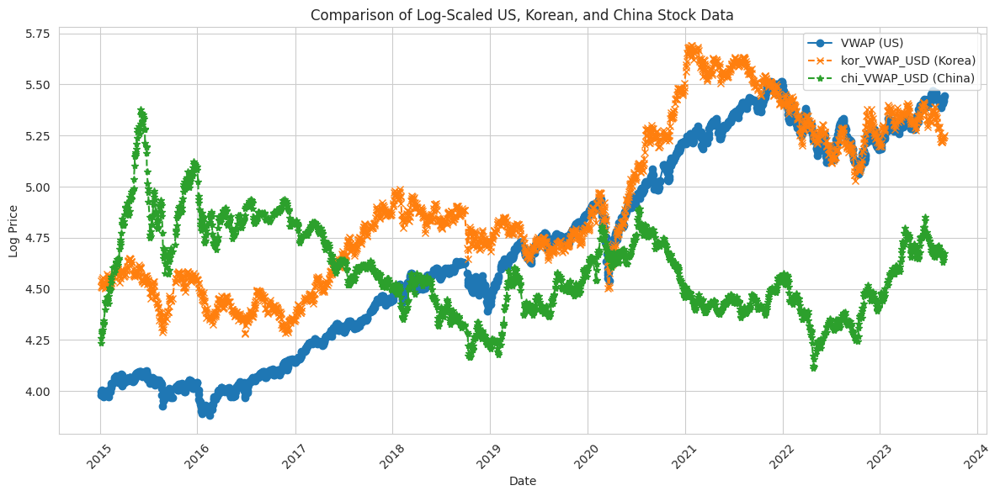

In [102]:
VWAP_log = np.log(ak['VWAP'])
kor_VWAP_USD_log = np.log(ak['kor_VWAP_USD'])
chi_VWAP_USD_log = np.log(ak['chi_VWAP_USD'])

plt.figure(figsize=(12, 6))
plt.plot(ak.index, VWAP_log, label='VWAP (US)', marker='o')
plt.plot(ak.index, kor_VWAP_USD_log, label='kor_VWAP_USD (Korea)', linestyle='--', marker='x')
plt.plot(ak.index, chi_VWAP_USD_log, label='chi_VWAP_USD (China)', linestyle='--', marker='*')

plt.title('Comparison of Log-Scaled US, Korean, and China Stock Data')
plt.xlabel('Date')
plt.ylabel('Log Price')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()

plt.show()


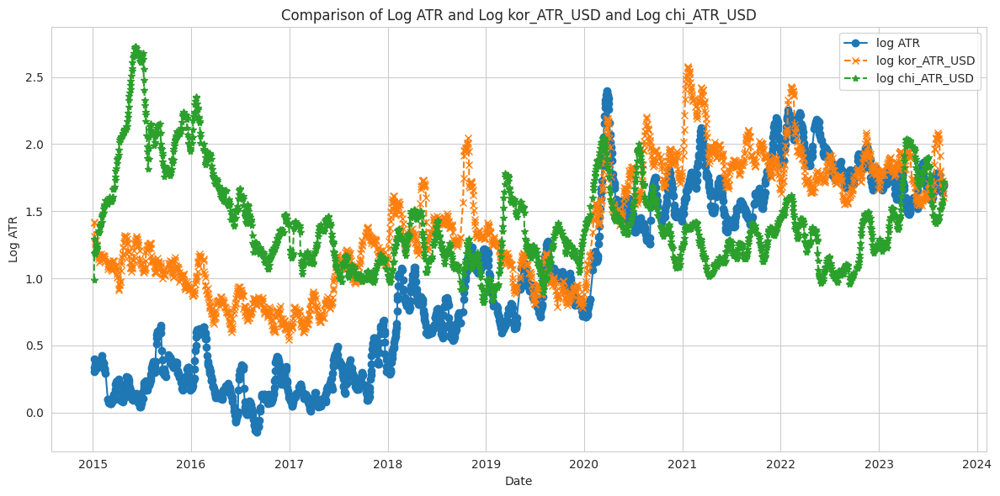

In [103]:
us_atr = ak['ATR']
kor_atr_usd = ak['kor_ATR_USD']
chi_atr_usd = ak['chi_ATR_USD']

log_us_atr = np.log(us_atr)
log_kor_atr_usd = np.log(kor_atr_usd)
log_chi_atr_usd = np.log(chi_atr_usd)

plt.figure(figsize=(12, 6))
plt.plot(ak.index, log_us_atr, label='log ATR', marker='o')
plt.plot(ak.index, log_kor_atr_usd, label='log kor_ATR_USD', linestyle='--', marker='x')
plt.plot(ak.index, log_chi_atr_usd, label='log chi_ATR_USD', linestyle='--', marker='*')

plt.title('Comparison of Log ATR and Log kor_ATR_USD and Log chi_ATR_USD')
plt.xlabel('Date')
plt.ylabel('Log ATR')
plt.legend()
plt.tight_layout()
plt.show()

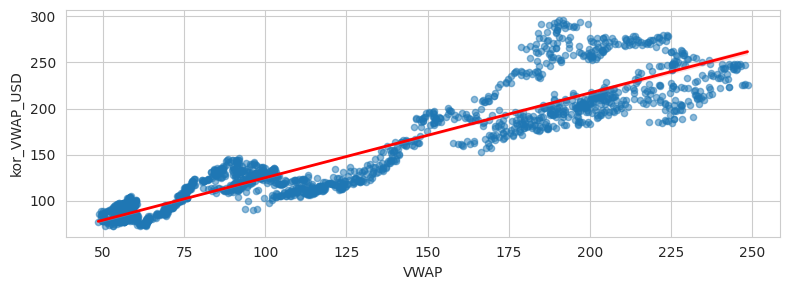

VWAP와 kor_VWAP_USD 사이의 상관계수 : 0.93
p-value: 0.0



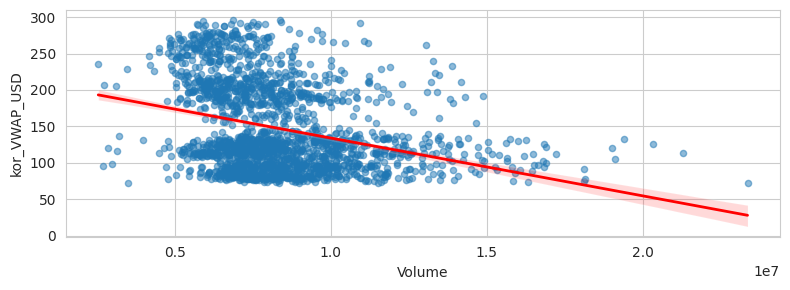

Volume와 kor_VWAP_USD 사이의 상관계수 : -0.31
p-value: 1.4532270486230375e-45



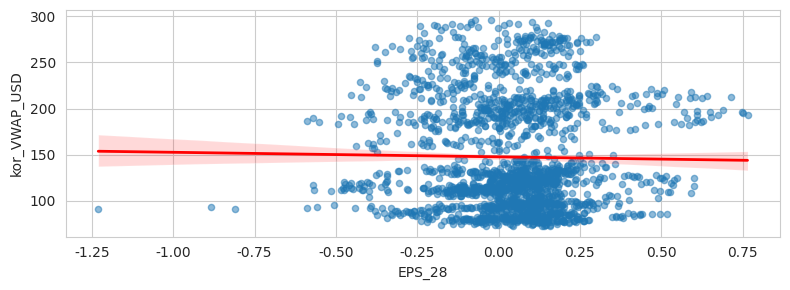

EPS_28와 kor_VWAP_USD 사이의 상관계수 : -0.02
p-value: 0.4726303029500932



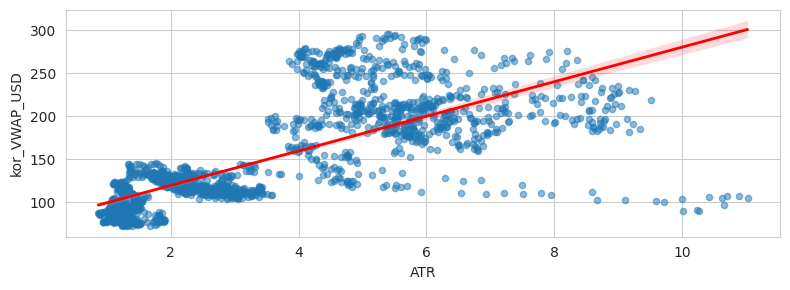

ATR와 kor_VWAP_USD 사이의 상관계수 : 0.75
p-value: 0.0



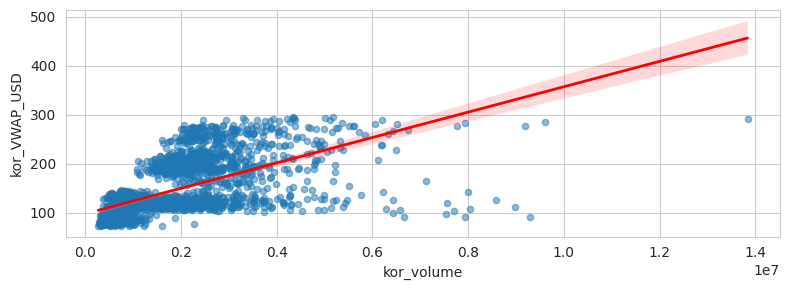

kor_volume와 kor_VWAP_USD 사이의 상관계수 : 0.60
p-value: 4.427910900384381e-197



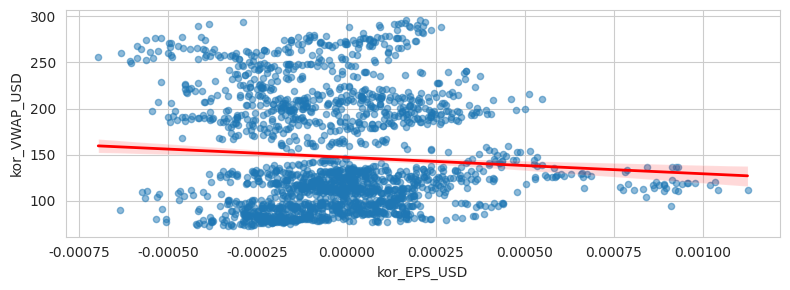

kor_EPS_USD와 kor_VWAP_USD 사이의 상관계수 : -0.07
p-value: 0.0011341421427849224



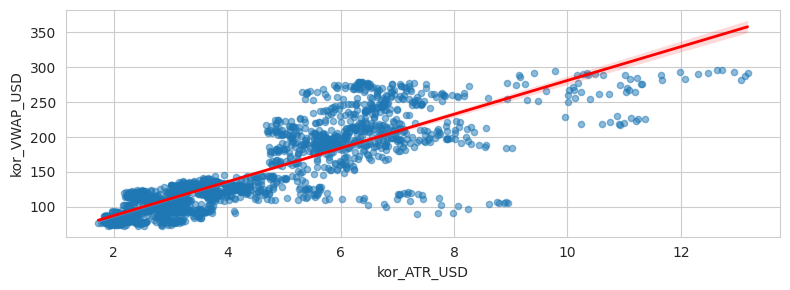

kor_ATR_USD와 kor_VWAP_USD 사이의 상관계수 : 0.85
p-value: 0.0



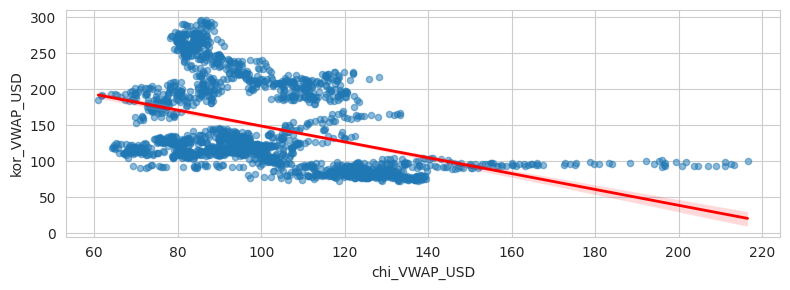

chi_VWAP_USD와 kor_VWAP_USD 사이의 상관계수 : -0.44
p-value: 2.537354352231467e-92



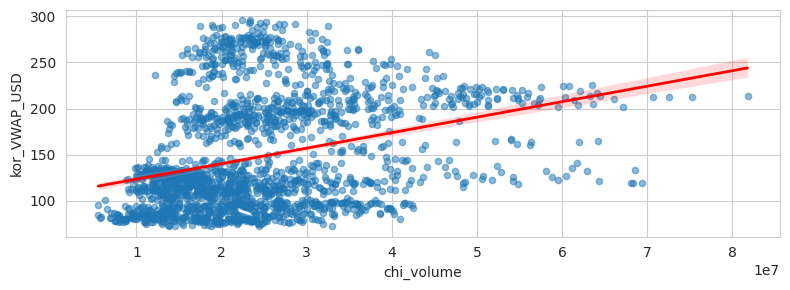

chi_volume와 kor_VWAP_USD 사이의 상관계수 : 0.31
p-value: 5.891309291871388e-46



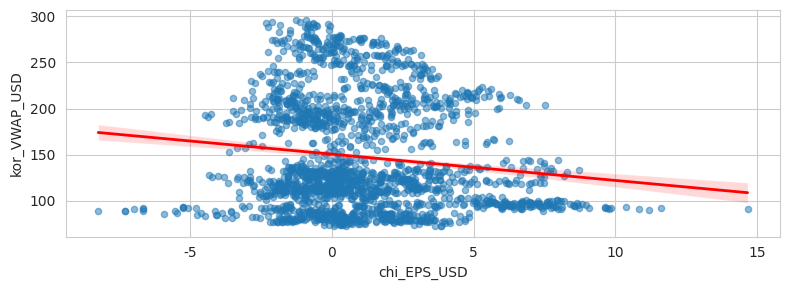

chi_EPS_USD와 kor_VWAP_USD 사이의 상관계수 : -0.13
p-value: 5.450194902576372e-09



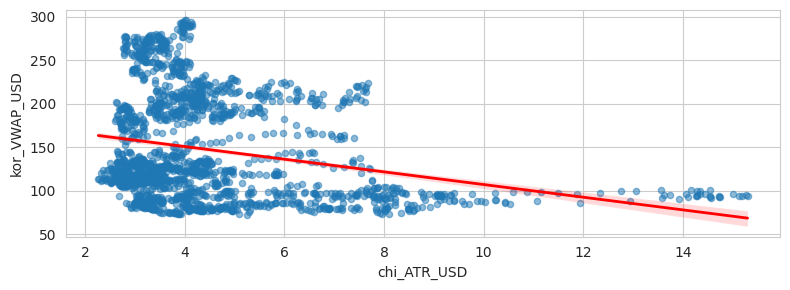

chi_ATR_USD와 kor_VWAP_USD 사이의 상관계수 : -0.25
p-value: 5.717486178794731e-29



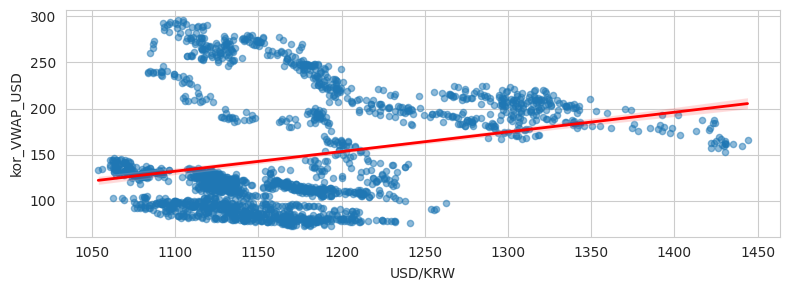

USD/KRW와 kor_VWAP_USD 사이의 상관계수 : 0.27
p-value: 4.4054767892928155e-33



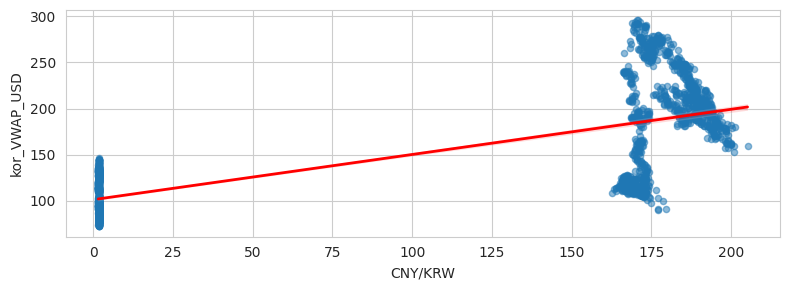

CNY/KRW와 kor_VWAP_USD 사이의 상관계수 : 0.73
p-value: 0.0



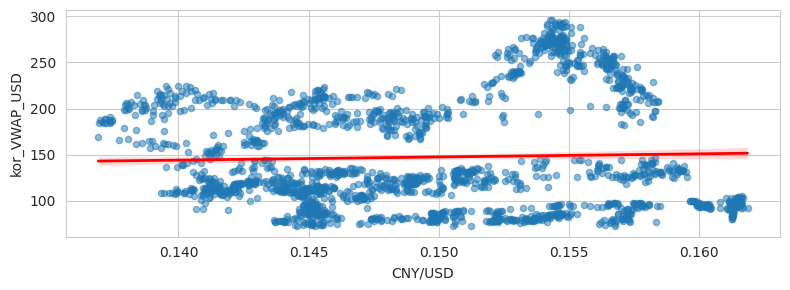

CNY/USD와 kor_VWAP_USD 사이의 상관계수 : 0.04
p-value: 0.10889022116773539



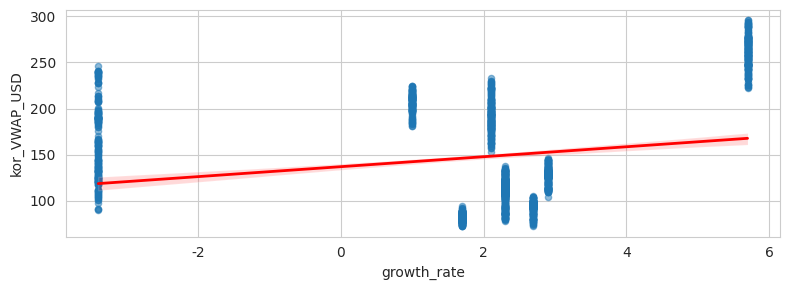

growth_rate와 kor_VWAP_USD 사이의 상관계수 : 0.21
p-value: 1.585567761668398e-20



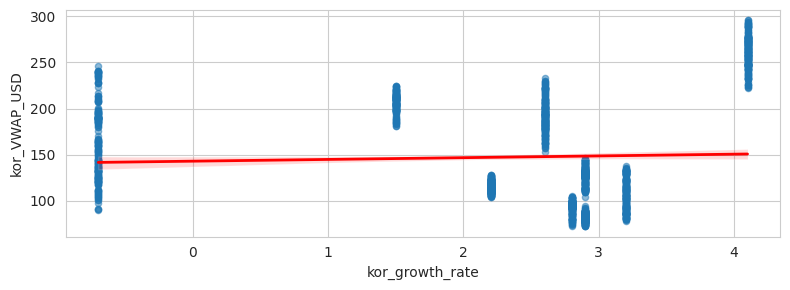

kor_growth_rate와 kor_VWAP_USD 사이의 상관계수 : 0.04
p-value: 0.06765024815016582



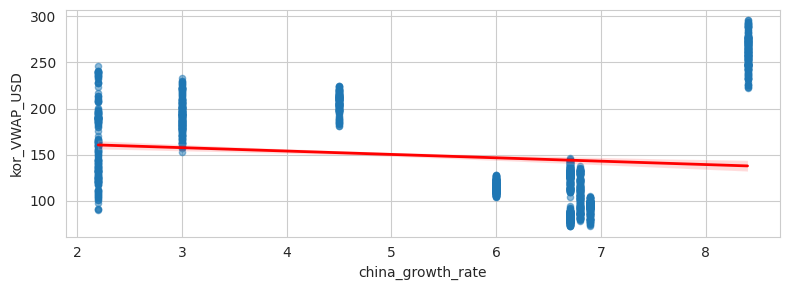

china_growth_rate와 kor_VWAP_USD 사이의 상관계수 : -0.12
p-value: 1.1437073637529092e-07



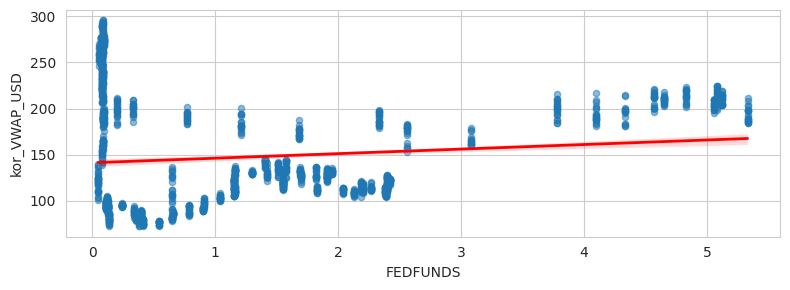

FEDFUNDS와 kor_VWAP_USD 사이의 상관계수 : 0.12
p-value: 2.6647771659006334e-07



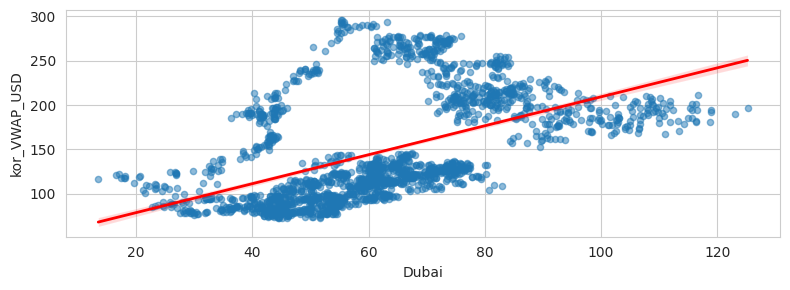

Dubai와 kor_VWAP_USD 사이의 상관계수 : 0.51
p-value: 1.6596896923166955e-133



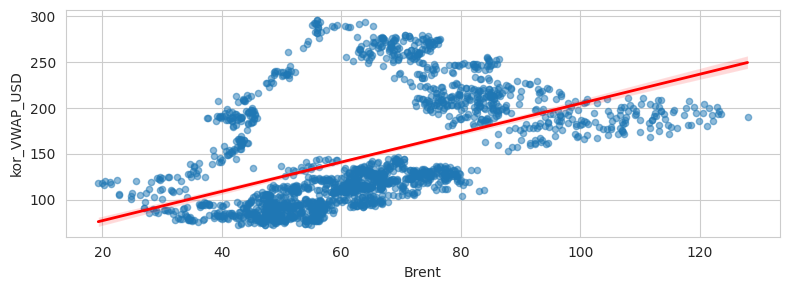

Brent와 kor_VWAP_USD 사이의 상관계수 : 0.50
p-value: 1.7033473472562587e-123



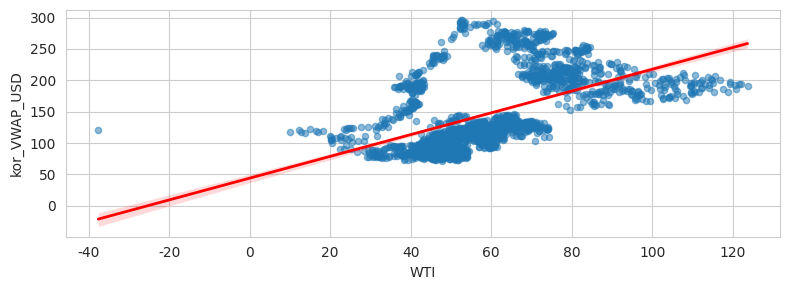

WTI와 kor_VWAP_USD 사이의 상관계수 : 0.53
p-value: 8.381049457175192e-141



In [104]:
draw_two(ak, check_two)

In [105]:
correlation_matrix = ak[check_three].corr()

correlation_matrix

,VWAP,Volume,EPS_28,ATR,kor_VWAP_USD,kor_volume,kor_EPS_USD,kor_ATR_USD,chi_VWAP_USD,chi_volume,chi_EPS_USD,chi_ATR_USD,USD/KRW,CNY/KRW,CNY/USD,growth_rate,kor_growth_rate,china_growth_rate,FEDFUNDS,Dubai,Brent,WTI
VWAP,1.000000,-0.327971,0.034655,0.838943,0.927676,0.594226,-0.092726,0.775220,-0.459276,0.398832,-0.134873,-0.260144,0.508258,0.846113,-0.176725,0.085993,-0.087325,-0.304728,0.302402,0.631791,0.609482,0.632008
Volume,-0.327971,1.000000,-0.180906,-0.064283,-0.311127,0.053456,0.054872,-0.100413,0.037294,-0.038921,0.063349,0.155683,-0.118878,-0.250571,0.053974,-0.155878,-0.110878,-0.061511,-0.128912,-0.214995,-0.212519,-0.232604
EPS_28,0.034655,-0.180906,1.000000,-0.085775,-0.016174,-0.013984,-0.006490,-0.135729,0.145641,0.124284,0.144874,-0.012581,0.080034,0.049862,-0.109375,-0.138110,-0.138554,-0.089624,0.156275,-0.048418,-0.044096,-0.063742
ATR,0.838943,-0.064283,-0.085775,1.000000,0.747491,0.644588,-0.140428,0.809592,-0.433507,0.368472,-0.136433,-0.168580,0.575277,0.799866,-0.184754,-0.084027,-0.214513,-0.497273,0.181770,0.535336,0.526186,0.544604
kor_VWAP_USD,0.927676,-0.311127,-0.016174,0.747491,1.000000,0.604595,-0.073209,0.852153,-0.435838,0.312447,-0.130800,-0.247639,0.265020,0.728348,0.036095,0.206894,0.041137,-0.118992,0.115503,0.513917,0.496719,0.525859
kor_volume,0.594226,0.053456,-0.013984,0.644588,0.604595,1.000000,0.070503,0.663589,-0.366292,0.263944,-0.148918,-0.164295,0.205830,0.634259,-0.222254,-0.202649,-0.352567,-0.355626,0.021409,0.175513,0.147849,0.144755
kor_EPS_USD,-0.092726,0.054872,-0.006490,-0.140428,-0.073209,0.070503,1.000000,-0.040055,-0.132129,-0.051696,0.048391,-0.198672,-0.025752,-0.096283,-0.241009,-0.156220,-0.147823,-0.108044,0.143126,0.010940,0.000380,-0.029778
kor_ATR_USD,0.775220,-0.100413,-0.135729,0.809592,0.852153,0.663589,-0.040055,1.000000,-0.389474,0.287967,-0.154377,-0.135315,0.275275,0.637230,0.023632,0.057610,-0.084196,-0.245818,0.056626,0.411957,0.398594,0.417449
chi_VWAP_USD,-0.459276,0.037294,0.145641,-0.433507,-0.435838,-0.366292,-0.132129,-0.389474,1.000000,0.153242,0.275188,0.732480,-0.126161,-0.428217,0.185085,-0.248472,-0.142426,0.066658,-0.256929,-0.531663,-0.518970,-0.483838
chi_volume,0.398832,-0.038921,0.124284,0.368472,0.312447,0.263944,-0.051696,0.287967,0.153242,1.000000,0.425814,0.363763,0.365771,0.416385,-0.052077,-0.198694,-0.318218,-0.306850,0.274653,0.169222,0.154795,0.155322


In [106]:
correlation_matrix[['kor_VWAP_USD']].T

,VWAP,Volume,EPS_28,ATR,kor_VWAP_USD,kor_volume,kor_EPS_USD,kor_ATR_USD,chi_VWAP_USD,chi_volume,chi_EPS_USD,chi_ATR_USD,USD/KRW,CNY/KRW,CNY/USD,growth_rate,kor_growth_rate,china_growth_rate,FEDFUNDS,Dubai,Brent,WTI
kor_VWAP_USD,0.927676,-0.311127,-0.016174,0.747491,1.0,0.604595,-0.073209,0.852153,-0.435838,0.312447,-0.1308,-0.247639,0.26502,0.728348,0.036095,0.206894,0.041137,-0.118992,0.115503,0.513917,0.496719,0.525859


In [107]:
result2.append(['XLK', (correlation_matrix['kor_VWAP_USD']['VWAP'], correlation_matrix['kor_VWAP_USD']['chi_VWAP_USD'])])

## XLI

In [108]:
korea_list = stock_code =['005380','000270','010140','124500','066570','034020','003620','005930','064350']
china_list = china_ticker('https://www.tradingview.com/markets/stocks-china/sectorandindustry-sector/process-industries/')
america_list = list(sector_info.loc[sector_info['sector_name']=='XLI', 'tck_iem_cd'].unique())

In [ ]:
ak = return_ak_china(china_list, korea_list, america_list)

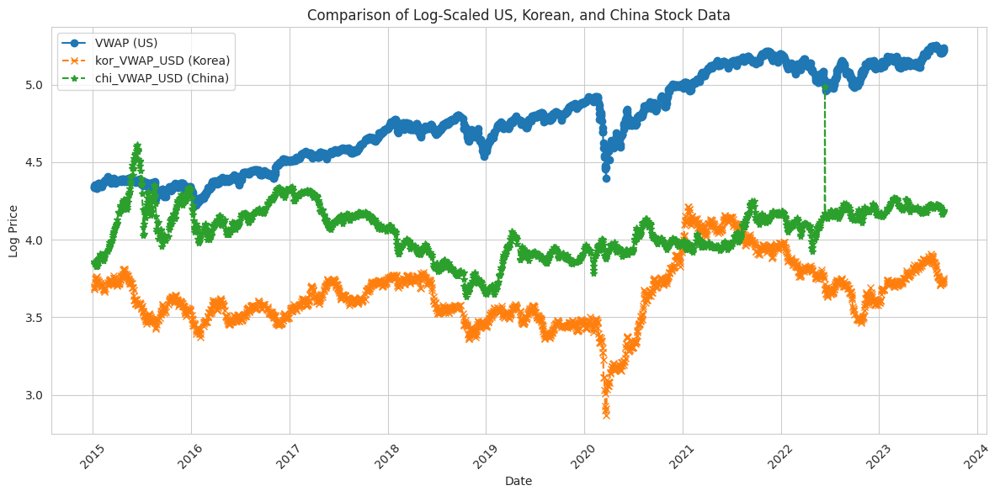

In [110]:
VWAP_log = np.log(ak['VWAP'])
kor_VWAP_USD_log = np.log(ak['kor_VWAP_USD'])
chi_VWAP_USD_log = np.log(ak['chi_VWAP_USD'])

plt.figure(figsize=(12, 6))
plt.plot(ak.index, VWAP_log, label='VWAP (US)', marker='o')
plt.plot(ak.index, kor_VWAP_USD_log, label='kor_VWAP_USD (Korea)', linestyle='--', marker='x')
plt.plot(ak.index, chi_VWAP_USD_log, label='chi_VWAP_USD (China)', linestyle='--', marker='*')

plt.title('Comparison of Log-Scaled US, Korean, and China Stock Data')
plt.xlabel('Date')
plt.ylabel('Log Price')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()

plt.show()


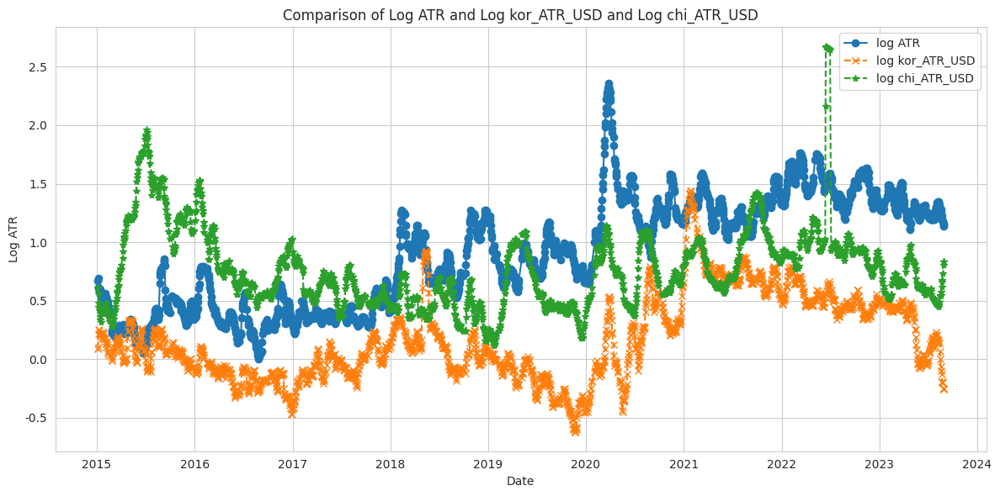

In [111]:
us_atr = ak['ATR']
kor_atr_usd = ak['kor_ATR_USD']
chi_atr_usd = ak['chi_ATR_USD']

log_us_atr = np.log(us_atr)
log_kor_atr_usd = np.log(kor_atr_usd)
log_chi_atr_usd = np.log(chi_atr_usd)

plt.figure(figsize=(12, 6))
plt.plot(ak.index, log_us_atr, label='log ATR', marker='o')
plt.plot(ak.index, log_kor_atr_usd, label='log kor_ATR_USD', linestyle='--', marker='x')
plt.plot(ak.index, log_chi_atr_usd, label='log chi_ATR_USD', linestyle='--', marker='*')

plt.title('Comparison of Log ATR and Log kor_ATR_USD and Log chi_ATR_USD')
plt.xlabel('Date')
plt.ylabel('Log ATR')
plt.legend()
plt.tight_layout()
plt.show()

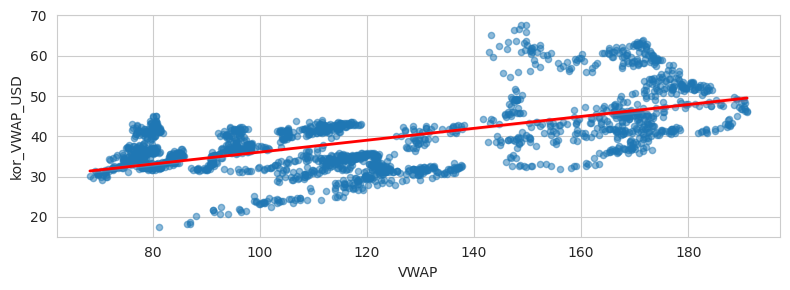

VWAP와 kor_VWAP_USD 사이의 상관계수 : 0.61
p-value: 7.610658862067452e-198



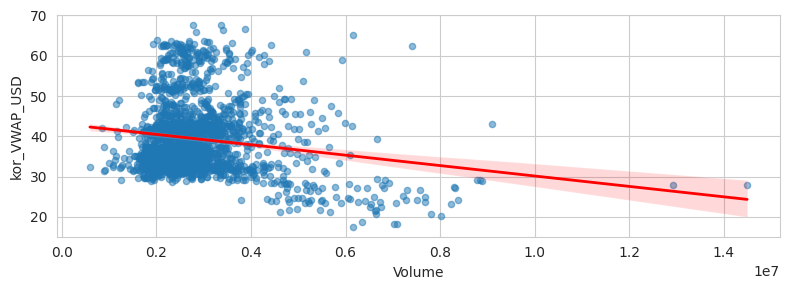

Volume와 kor_VWAP_USD 사이의 상관계수 : -0.17
p-value: 9.217779527934577e-14



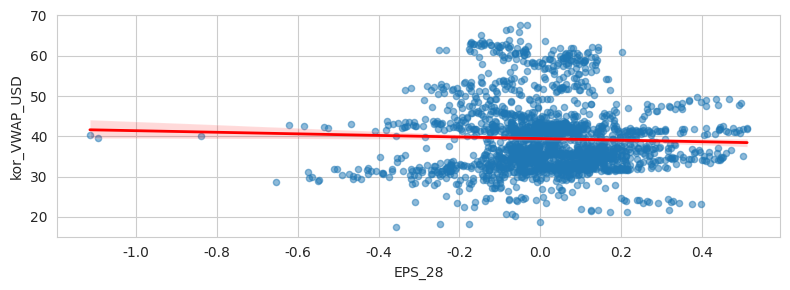

EPS_28와 kor_VWAP_USD 사이의 상관계수 : -0.04
p-value: 0.0808460491200303



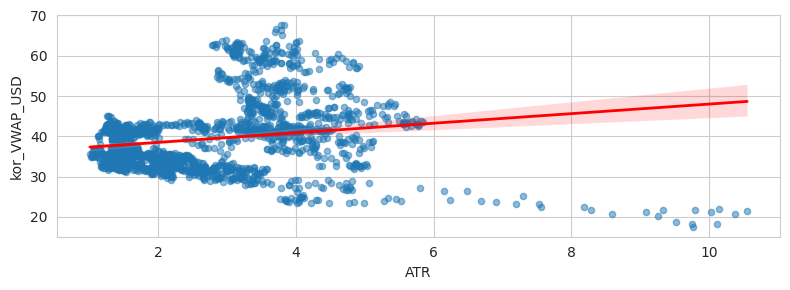

ATR와 kor_VWAP_USD 사이의 상관계수 : 0.19
p-value: 5.2465105179836774e-17



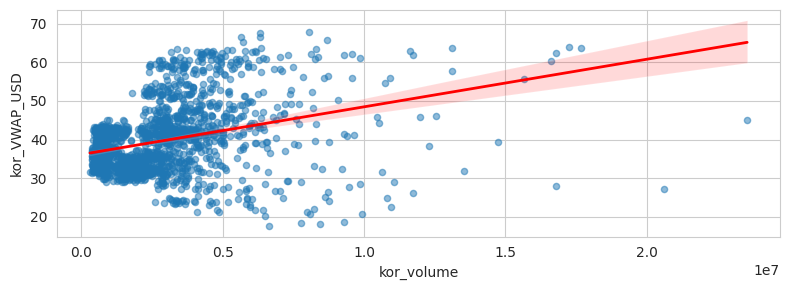

kor_volume와 kor_VWAP_USD 사이의 상관계수 : 0.33
p-value: 1.3906431895560198e-51



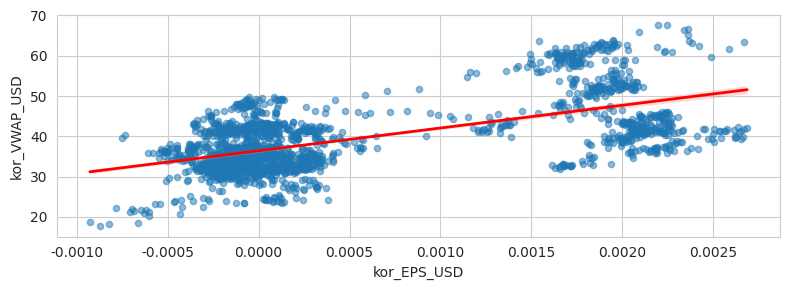

kor_EPS_USD와 kor_VWAP_USD 사이의 상관계수 : 0.61
p-value: 1.4968710157410987e-202



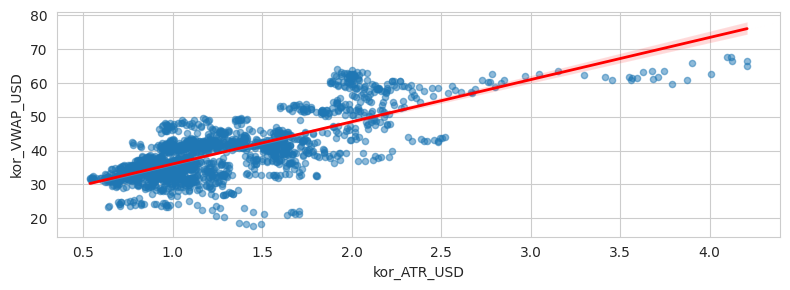

kor_ATR_USD와 kor_VWAP_USD 사이의 상관계수 : 0.75
p-value: 0.0



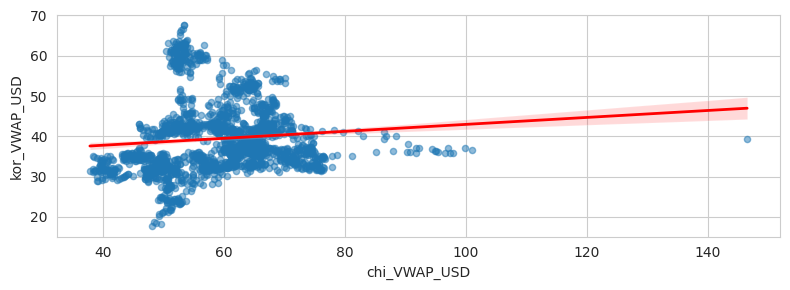

chi_VWAP_USD와 kor_VWAP_USD 사이의 상관계수 : 0.10
p-value: 1.4354404505648971e-05



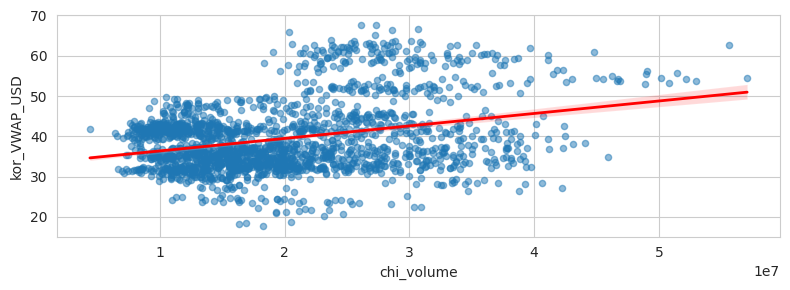

chi_volume와 kor_VWAP_USD 사이의 상관계수 : 0.31
p-value: 8.276176028049782e-46



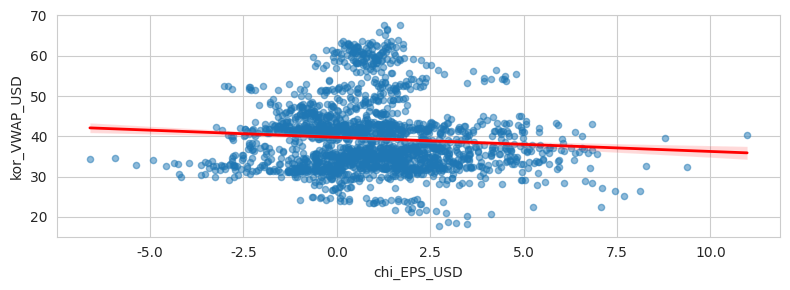

chi_EPS_USD와 kor_VWAP_USD 사이의 상관계수 : -0.08
p-value: 0.0003554394385652534



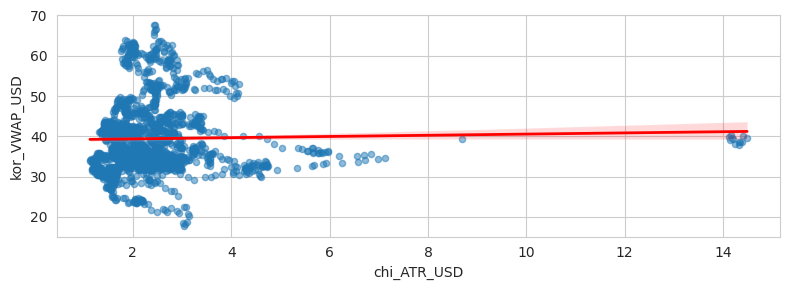

chi_ATR_USD와 kor_VWAP_USD 사이의 상관계수 : 0.02
p-value: 0.33499933026080586



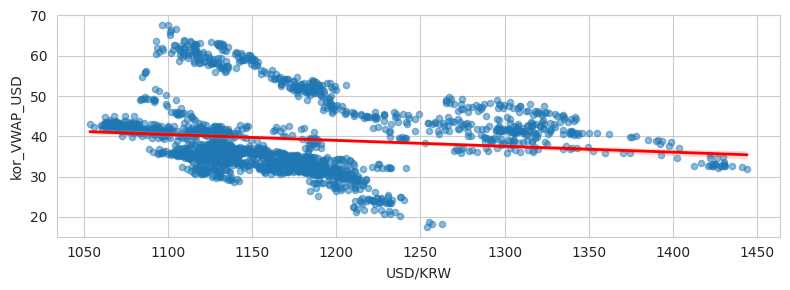

USD/KRW와 kor_VWAP_USD 사이의 상관계수 : -0.13
p-value: 1.3585007329419285e-08



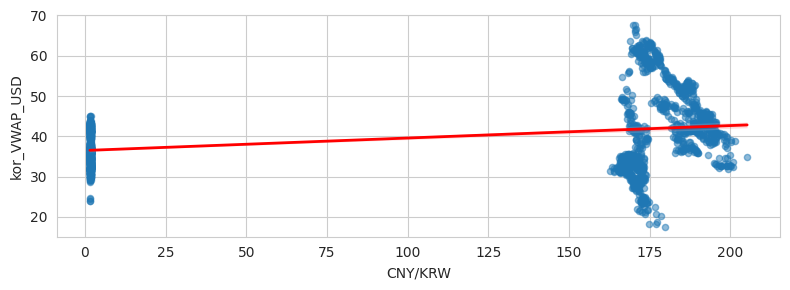

CNY/KRW와 kor_VWAP_USD 사이의 상관계수 : 0.32
p-value: 1.3453801743825633e-48



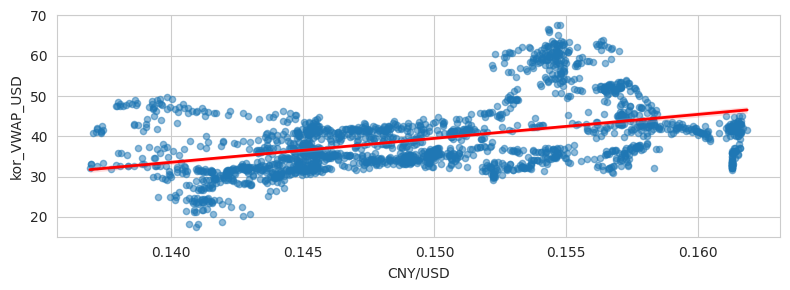

CNY/USD와 kor_VWAP_USD 사이의 상관계수 : 0.44
p-value: 9.101378728115878e-94



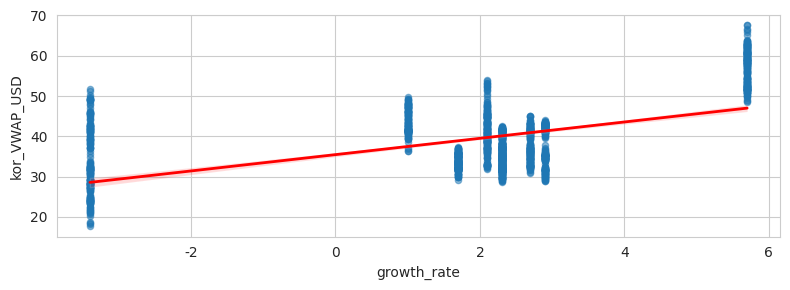

growth_rate와 kor_VWAP_USD 사이의 상관계수 : 0.54
p-value: 8.801145065094655e-152



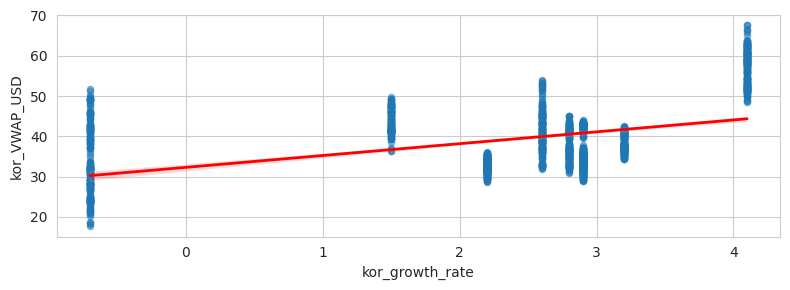

kor_growth_rate와 kor_VWAP_USD 사이의 상관계수 : 0.45
p-value: 7.382720210373719e-97



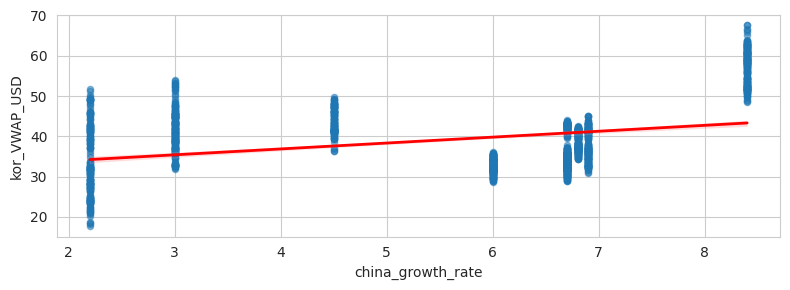

china_growth_rate와 kor_VWAP_USD 사이의 상관계수 : 0.33
p-value: 3.687461561468377e-52



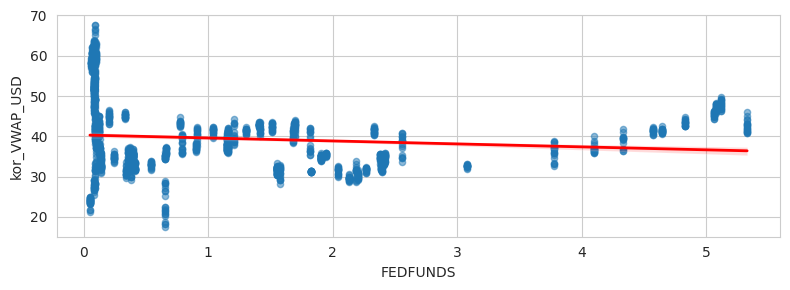

FEDFUNDS와 kor_VWAP_USD 사이의 상관계수 : -0.12
p-value: 7.9138188532284e-08



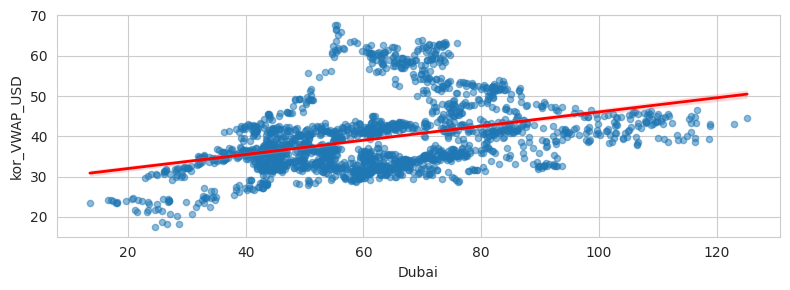

Dubai와 kor_VWAP_USD 사이의 상관계수 : 0.39
p-value: 4.135243358549246e-71



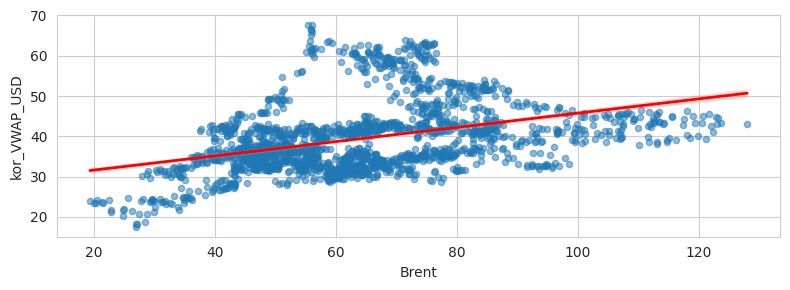

Brent와 kor_VWAP_USD 사이의 상관계수 : 0.38
p-value: 2.442529878500143e-70



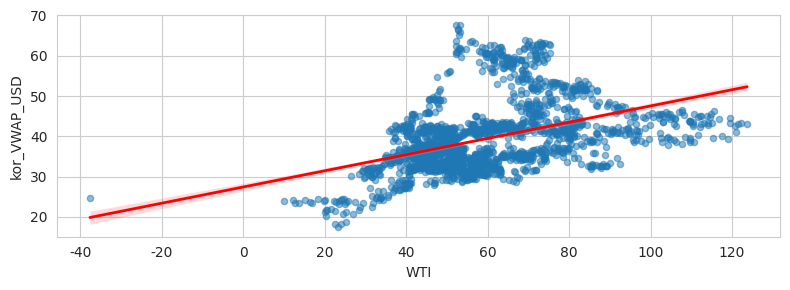

WTI와 kor_VWAP_USD 사이의 상관계수 : 0.43
p-value: 5.866094627863079e-88



In [112]:
draw_two(ak, check_two)

In [113]:
correlation_matrix = ak[check_three].corr()

correlation_matrix

,VWAP,Volume,EPS_28,ATR,kor_VWAP_USD,kor_volume,kor_EPS_USD,kor_ATR_USD,chi_VWAP_USD,chi_volume,chi_EPS_USD,chi_ATR_USD,USD/KRW,CNY/KRW,CNY/USD,growth_rate,kor_growth_rate,china_growth_rate,FEDFUNDS,Dubai,Brent,WTI
VWAP,1.000000,-0.060064,0.027909,0.647255,0.605530,0.551051,0.755448,0.581566,-0.021839,0.190099,-0.225560,-0.028015,0.502690,0.811129,-0.219422,0.134318,-0.034858,-0.275342,0.409751,0.708072,0.686136,0.701181
Volume,-0.060064,1.000000,-0.148143,0.418856,-0.166649,0.387050,-0.047846,0.125019,-0.138226,0.123716,0.074321,0.074018,0.071948,0.164268,-0.072808,-0.439675,-0.451381,-0.371891,-0.275579,-0.284782,-0.289349,-0.280297
EPS_28,0.027909,-0.148143,1.000000,-0.140416,-0.039303,-0.023260,-0.025458,-0.146161,0.164916,0.033328,0.131195,-0.058122,0.106503,0.028347,-0.124742,-0.078301,-0.053391,-0.054839,0.116048,-0.037124,-0.029664,-0.043265
ATR,0.647255,0.418856,-0.140416,1.000000,0.187086,0.606996,0.541817,0.525180,-0.182017,0.175439,-0.110452,0.089638,0.522153,0.727769,-0.262090,-0.201462,-0.326994,-0.534310,0.168869,0.385402,0.376122,0.382391
kor_VWAP_USD,0.605530,-0.166649,-0.039303,0.187086,1.000000,0.330685,0.611215,0.754011,0.097475,0.311951,-0.080298,0.021710,-0.127369,0.321165,0.438951,0.542971,0.445503,0.332484,-0.120480,0.385904,0.383917,0.426234
kor_volume,0.551051,0.387050,-0.023260,0.606996,0.330685,1.000000,0.402324,0.518147,-0.206303,0.209653,-0.070185,0.028503,0.226138,0.599655,-0.175795,-0.188119,-0.319282,-0.341292,0.032317,0.191474,0.165852,0.172922
kor_EPS_USD,0.755448,-0.047846,-0.025458,0.541817,0.611215,0.402324,1.000000,0.741534,0.130951,0.313262,-0.142970,0.153199,0.458052,0.613230,0.087884,0.345164,0.253273,-0.111054,0.144350,0.660665,0.667860,0.692656
kor_ATR_USD,0.581566,0.125019,-0.146161,0.525180,0.754011,0.518147,0.741534,1.000000,-0.007807,0.381933,-0.067336,0.182259,0.082229,0.464073,0.311402,0.346805,0.236111,0.058756,-0.147731,0.376109,0.375097,0.404251
chi_VWAP_USD,-0.021839,-0.138226,0.164916,-0.182017,0.097475,-0.206303,0.130951,-0.007807,1.000000,0.264726,0.190112,0.353113,0.267566,-0.124013,0.125195,0.058799,0.163651,0.021845,-0.001019,0.054176,0.070188,0.120710
chi_volume,0.190099,0.123716,0.033328,0.175439,0.311951,0.209653,0.313262,0.381933,0.264726,1.000000,0.478703,0.436351,0.056233,0.292270,0.357560,0.174247,0.094919,0.039502,-0.360583,0.125766,0.128055,0.147391


In [114]:
correlation_matrix[['kor_VWAP_USD']].T

,VWAP,Volume,EPS_28,ATR,kor_VWAP_USD,kor_volume,kor_EPS_USD,kor_ATR_USD,chi_VWAP_USD,chi_volume,chi_EPS_USD,chi_ATR_USD,USD/KRW,CNY/KRW,CNY/USD,growth_rate,kor_growth_rate,china_growth_rate,FEDFUNDS,Dubai,Brent,WTI
kor_VWAP_USD,0.60553,-0.166649,-0.039303,0.187086,1.0,0.330685,0.611215,0.754011,0.097475,0.311951,-0.080298,0.02171,-0.127369,0.321165,0.438951,0.542971,0.445503,0.332484,-0.12048,0.385904,0.383917,0.426234


In [115]:
result2.append(['XLI', (correlation_matrix['kor_VWAP_USD']['VWAP'], correlation_matrix['kor_VWAP_USD']['chi_VWAP_USD'])])

## XLP

In [116]:
korea_list = ['033780', '007070', '139480', '090430', '051900', '271560', '097950', '000080', '004370', '007310', '005300', '005610']
china_list = china_ticker('https://www.tradingview.com/markets/stocks-china/sectorandindustry-sector/consumer-non-durables/')
america_list = list(sector_info.loc[sector_info['sector_name']=='XLP', 'tck_iem_cd'].unique())

In [ ]:
ak = return_ak_china(china_list, korea_list, america_list)

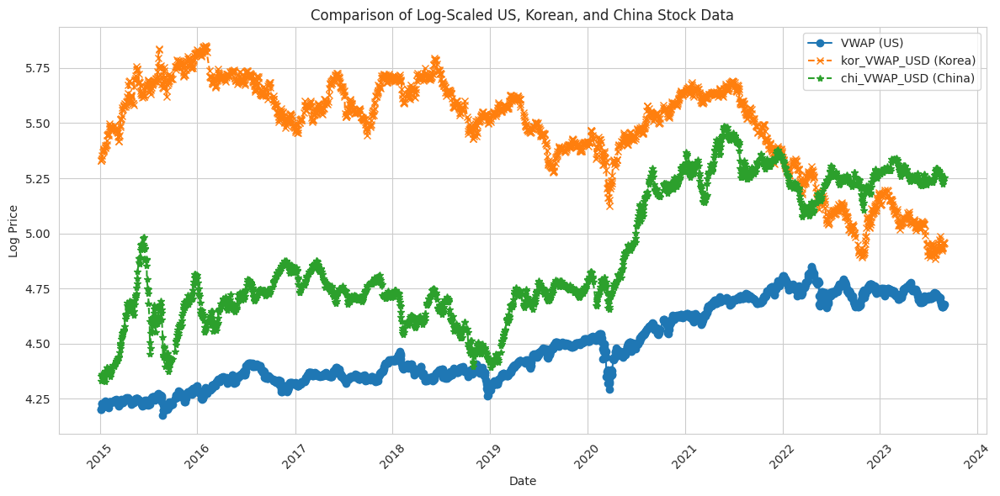

In [118]:
VWAP_log = np.log(ak['VWAP'])
kor_VWAP_USD_log = np.log(ak['kor_VWAP_USD'])
chi_VWAP_USD_log = np.log(ak['chi_VWAP_USD'])

plt.figure(figsize=(12, 6))
plt.plot(ak.index, VWAP_log, label='VWAP (US)', marker='o')
plt.plot(ak.index, kor_VWAP_USD_log, label='kor_VWAP_USD (Korea)', linestyle='--', marker='x')
plt.plot(ak.index, chi_VWAP_USD_log, label='chi_VWAP_USD (China)', linestyle='--', marker='*')

plt.title('Comparison of Log-Scaled US, Korean, and China Stock Data')
plt.xlabel('Date')
plt.ylabel('Log Price')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()

plt.show()


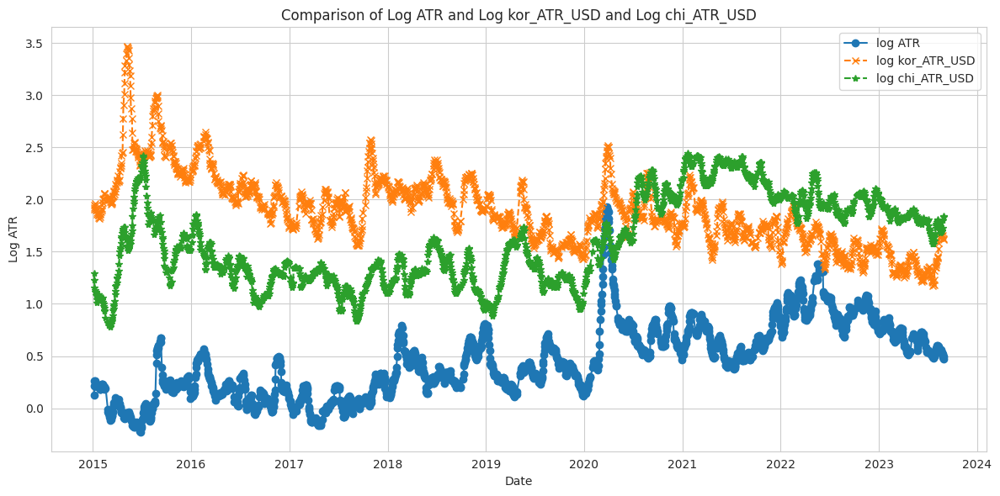

In [119]:
us_atr = ak['ATR']
kor_atr_usd = ak['kor_ATR_USD']
chi_atr_usd = ak['chi_ATR_USD']

log_us_atr = np.log(us_atr)
log_kor_atr_usd = np.log(kor_atr_usd)
log_chi_atr_usd = np.log(chi_atr_usd)

plt.figure(figsize=(12, 6))
plt.plot(ak.index, log_us_atr, label='log ATR', marker='o')
plt.plot(ak.index, log_kor_atr_usd, label='log kor_ATR_USD', linestyle='--', marker='x')
plt.plot(ak.index, log_chi_atr_usd, label='log chi_ATR_USD', linestyle='--', marker='*')

plt.title('Comparison of Log ATR and Log kor_ATR_USD and Log chi_ATR_USD')
plt.xlabel('Date')
plt.ylabel('Log ATR')
plt.legend()
plt.tight_layout()
plt.show()

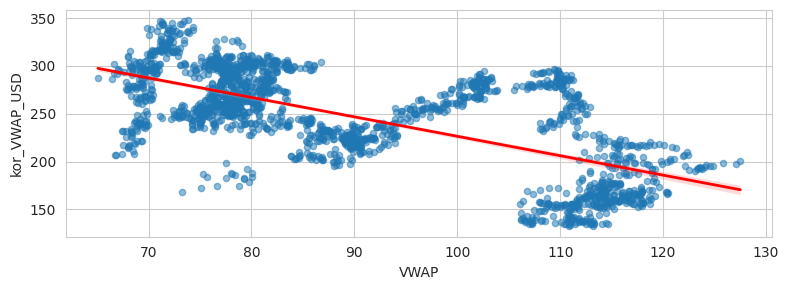

VWAP와 kor_VWAP_USD 사이의 상관계수 : -0.67
p-value: 3.946319697622428e-254



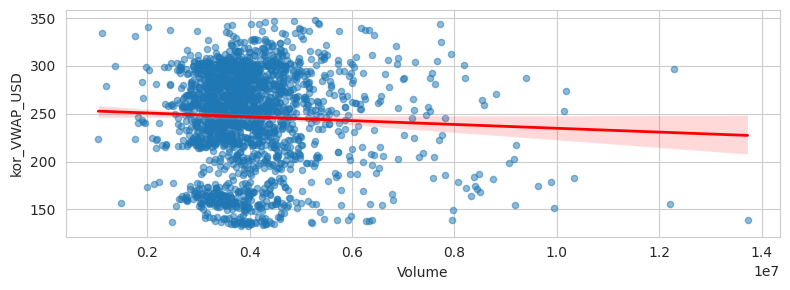

Volume와 kor_VWAP_USD 사이의 상관계수 : -0.05
p-value: 0.04394291554701586



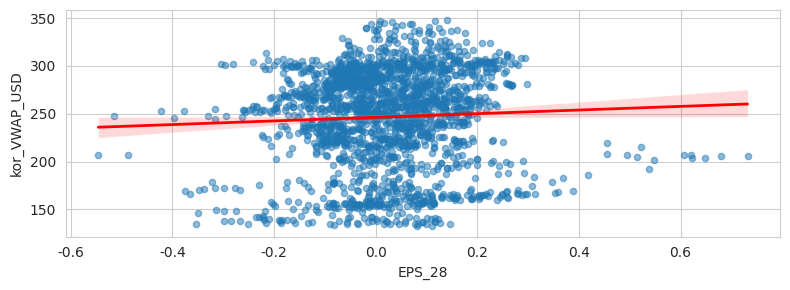

EPS_28와 kor_VWAP_USD 사이의 상관계수 : 0.05
p-value: 0.03201953657630788



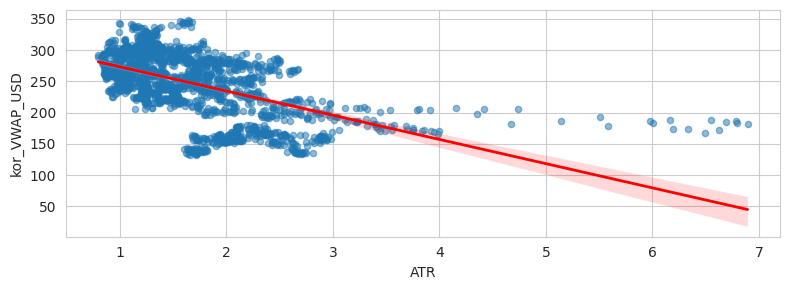

ATR와 kor_VWAP_USD 사이의 상관계수 : -0.55
p-value: 4.3283519905429824e-159



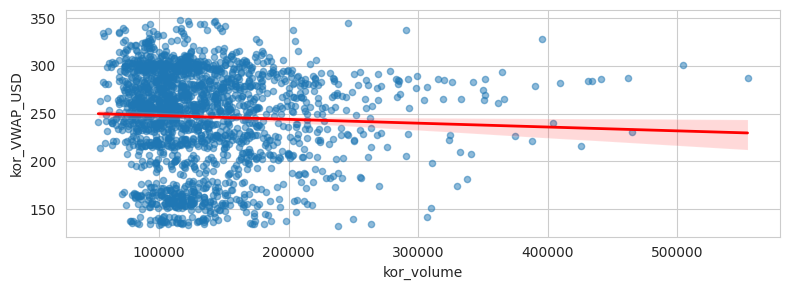

kor_volume와 kor_VWAP_USD 사이의 상관계수 : -0.04
p-value: 0.04824134222842369



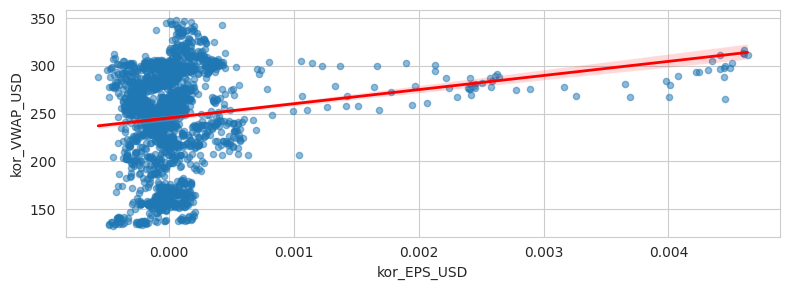

kor_EPS_USD와 kor_VWAP_USD 사이의 상관계수 : 0.17
p-value: 6.4417958637723e-15



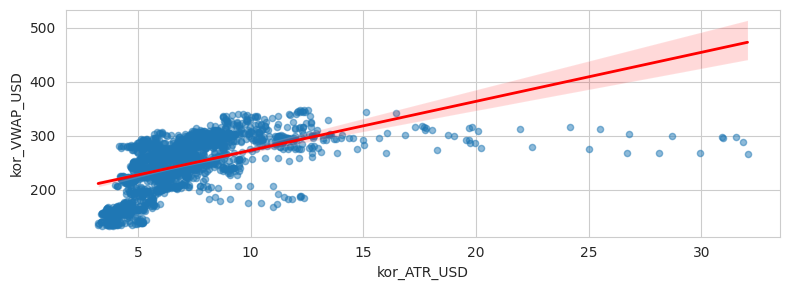

kor_ATR_USD와 kor_VWAP_USD 사이의 상관계수 : 0.56
p-value: 1.2408682104611664e-162



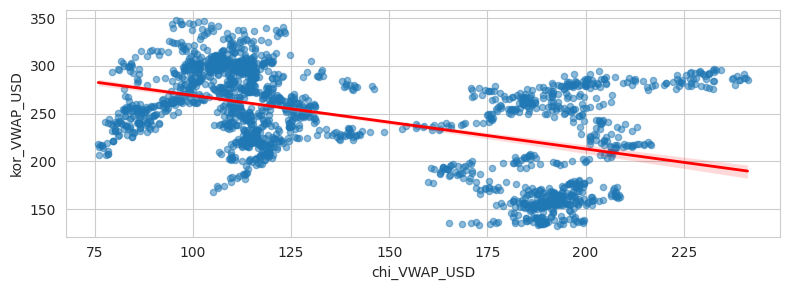

chi_VWAP_USD와 kor_VWAP_USD 사이의 상관계수 : -0.48
p-value: 3.54459268804447e-113



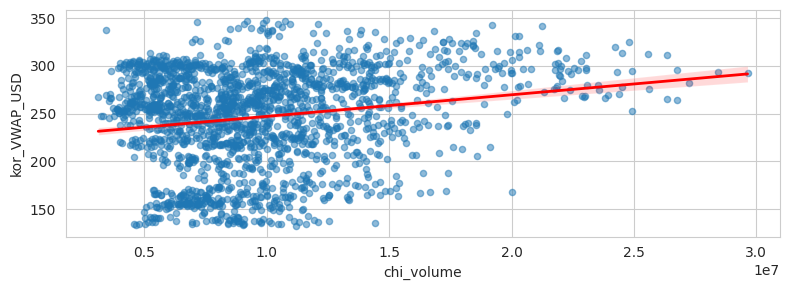

chi_volume와 kor_VWAP_USD 사이의 상관계수 : 0.19
p-value: 2.299974848118645e-17



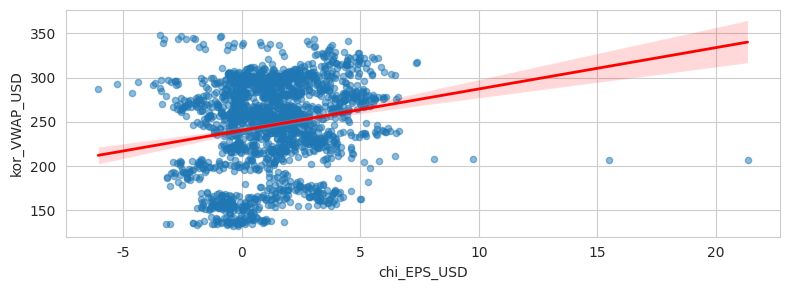

chi_EPS_USD와 kor_VWAP_USD 사이의 상관계수 : 0.19
p-value: 3.870534311585794e-18



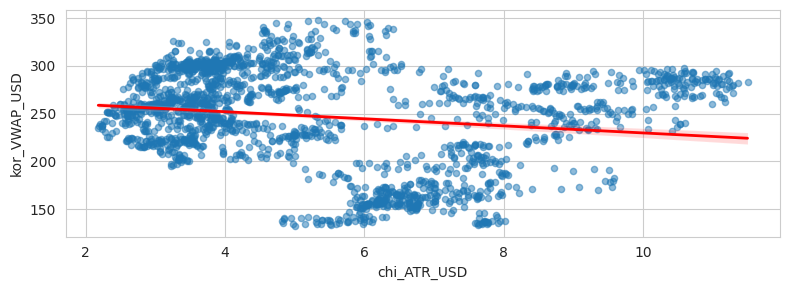

chi_ATR_USD와 kor_VWAP_USD 사이의 상관계수 : -0.17
p-value: 1.8176700602505087e-14



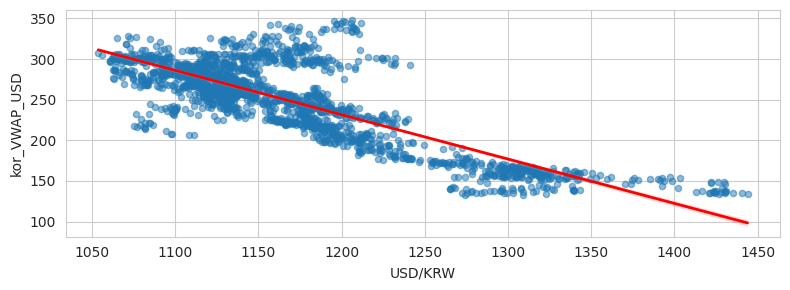

USD/KRW와 kor_VWAP_USD 사이의 상관계수 : -0.81
p-value: 0.0



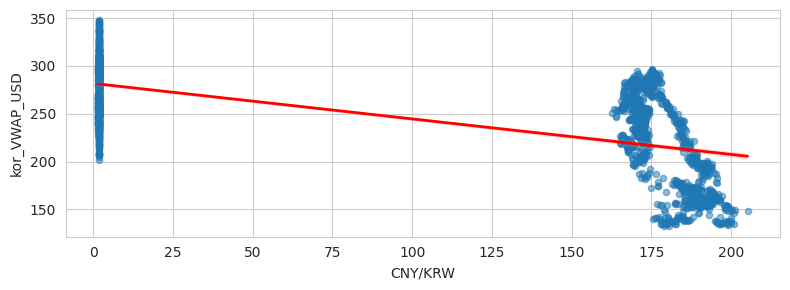

CNY/KRW와 kor_VWAP_USD 사이의 상관계수 : -0.66
p-value: 2.545034341282775e-243



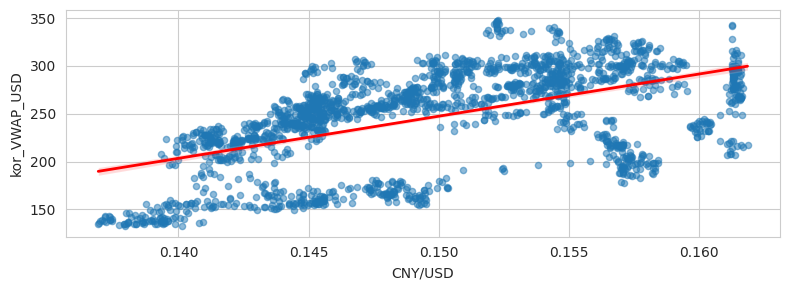

CNY/USD와 kor_VWAP_USD 사이의 상관계수 : 0.55
p-value: 6.70412992218511e-159



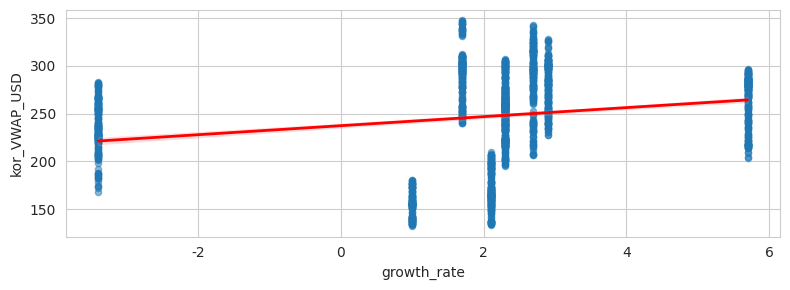

growth_rate와 kor_VWAP_USD 사이의 상관계수 : 0.22
p-value: 4.1300310274460425e-22



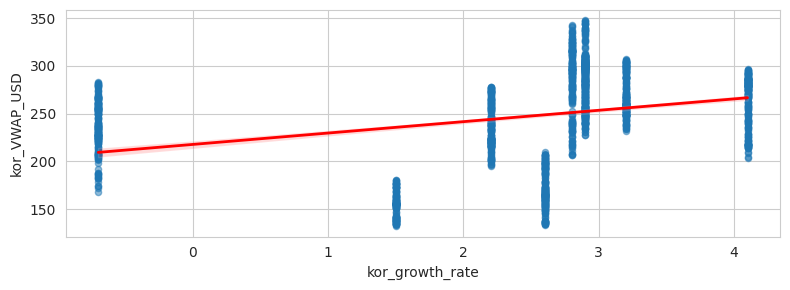

kor_growth_rate와 kor_VWAP_USD 사이의 상관계수 : 0.31
p-value: 3.3672293192203223e-44



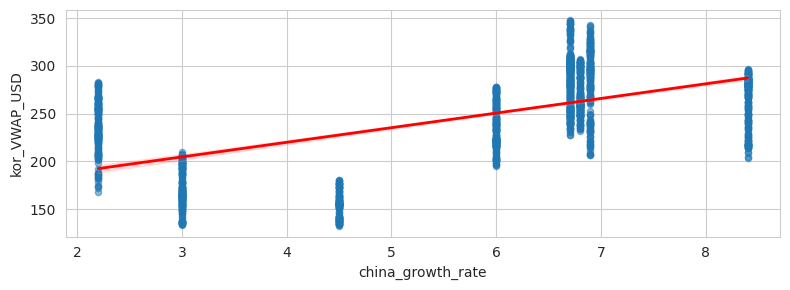

china_growth_rate와 kor_VWAP_USD 사이의 상관계수 : 0.59
p-value: 2.7263358037145182e-185



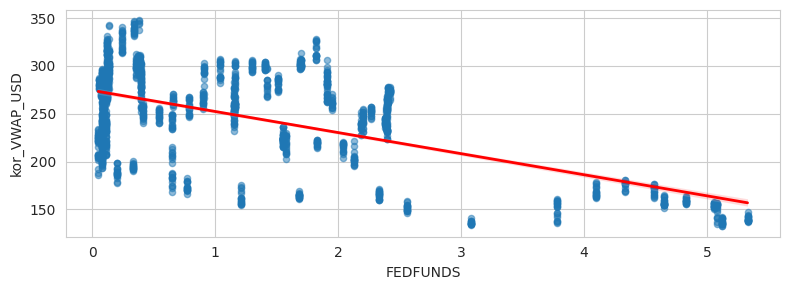

FEDFUNDS와 kor_VWAP_USD 사이의 상관계수 : -0.61
p-value: 3.133599010037146e-204



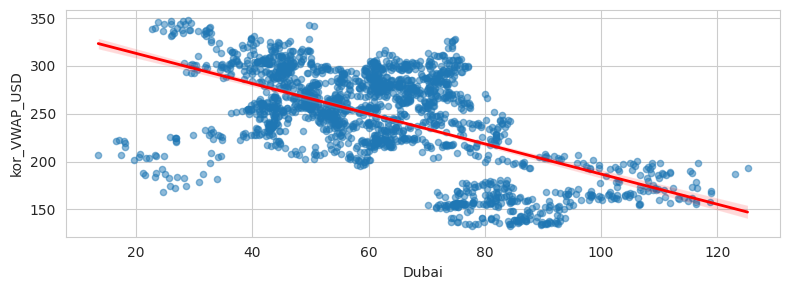

Dubai와 kor_VWAP_USD 사이의 상관계수 : -0.59
p-value: 5.3471510035258884e-185



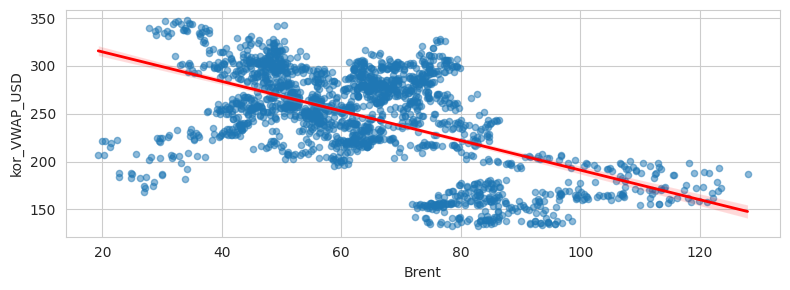

Brent와 kor_VWAP_USD 사이의 상관계수 : -0.57
p-value: 3.877675330817033e-171



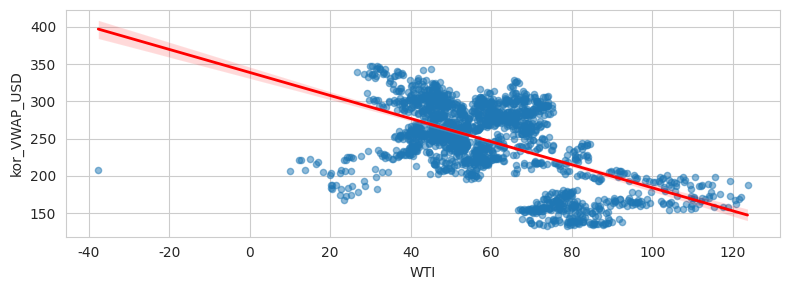

WTI와 kor_VWAP_USD 사이의 상관계수 : -0.56
p-value: 1.3466144447007547e-161



In [120]:
draw_two(ak, check_two)

In [121]:
correlation_matrix = ak[check_three].corr()

correlation_matrix

,VWAP,Volume,EPS_28,ATR,kor_VWAP_USD,kor_volume,kor_EPS_USD,kor_ATR_USD,chi_VWAP_USD,chi_volume,chi_EPS_USD,chi_ATR_USD,USD/KRW,CNY/KRW,CNY/USD,growth_rate,kor_growth_rate,china_growth_rate,FEDFUNDS,Dubai,Brent,WTI
VWAP,1.000000,-0.087890,0.040718,0.541415,-0.666798,0.231171,-0.251011,-0.590237,0.899797,-0.138217,-0.206652,0.668176,0.604485,0.820931,-0.205705,0.061780,-0.067145,-0.379742,0.319666,0.675330,0.663176,0.693532
Volume,-0.087890,1.000000,-0.083923,0.316984,-0.045350,0.199831,-0.058843,0.092997,-0.115123,-0.014319,0.044284,-0.056245,0.026203,0.011069,-0.027220,-0.094303,-0.099713,-0.096067,0.004970,-0.051341,-0.056043,-0.063853
EPS_28,0.040718,-0.083923,1.000000,0.056972,0.048262,-0.031757,-0.040613,0.047468,-0.009162,0.122696,0.023569,-0.019156,0.050955,-0.001493,-0.011594,-0.038487,-0.018097,-0.026170,-0.060900,-0.085139,-0.073237,-0.089777
ATR,0.541415,0.316984,0.056972,1.000000,-0.553838,0.318980,-0.213703,-0.225046,0.428602,-0.039528,-0.078222,0.409138,0.498792,0.603830,-0.239397,-0.244363,-0.324835,-0.544291,0.087401,0.289260,0.290854,0.298297
kor_VWAP_USD,-0.666798,-0.045350,0.048262,-0.553838,1.000000,-0.044464,0.174212,0.558965,-0.477900,0.189202,0.193691,-0.171305,-0.806093,-0.656073,0.553560,0.215181,0.306481,0.589781,-0.613215,-0.589403,-0.570919,-0.557476
kor_volume,0.231171,0.199831,-0.031757,0.318980,-0.044464,1.000000,-0.026655,-0.001297,0.308603,0.130846,0.084599,0.395082,0.038977,0.308443,-0.059334,-0.185484,-0.242540,-0.196638,-0.175740,-0.076677,-0.095574,-0.077558
kor_EPS_USD,-0.251011,-0.058843,-0.040613,-0.213703,0.174212,-0.026655,1.000000,0.578151,-0.151534,0.317005,0.229527,-0.070435,-0.191676,-0.219590,0.273210,0.015183,0.033701,0.080220,-0.103967,-0.038030,-0.030176,-0.054156
kor_ATR_USD,-0.590237,0.092997,0.047468,-0.225046,0.558965,-0.001297,0.578151,1.000000,-0.458969,0.411341,0.187804,-0.137895,-0.389420,-0.542050,0.451899,0.036774,0.107444,0.271002,-0.392242,-0.394509,-0.374941,-0.385014
chi_VWAP_USD,0.899797,-0.115123,-0.009162,0.428602,-0.477900,0.308603,-0.151534,-0.458969,1.000000,0.044475,-0.046407,0.811909,0.479082,0.738515,-0.086207,0.087413,-0.024930,-0.241366,0.142497,0.486858,0.473318,0.523981
chi_volume,-0.138217,-0.014319,0.122696,-0.039528,0.189202,0.130846,0.317005,0.411341,0.044475,1.000000,0.485321,0.293522,-0.030260,-0.019302,0.344720,-0.084973,-0.113294,-0.017917,-0.332956,-0.229707,-0.220407,-0.210061


In [122]:
correlation_matrix[['kor_VWAP_USD']].T

,VWAP,Volume,EPS_28,ATR,kor_VWAP_USD,kor_volume,kor_EPS_USD,kor_ATR_USD,chi_VWAP_USD,chi_volume,chi_EPS_USD,chi_ATR_USD,USD/KRW,CNY/KRW,CNY/USD,growth_rate,kor_growth_rate,china_growth_rate,FEDFUNDS,Dubai,Brent,WTI
kor_VWAP_USD,-0.666798,-0.04535,0.048262,-0.553838,1.0,-0.044464,0.174212,0.558965,-0.4779,0.189202,0.193691,-0.171305,-0.806093,-0.656073,0.55356,0.215181,0.306481,0.589781,-0.613215,-0.589403,-0.570919,-0.557476


In [123]:
result2.append(['XLP', (correlation_matrix['kor_VWAP_USD']['VWAP'], correlation_matrix['kor_VWAP_USD']['chi_VWAP_USD'])])

## 정리
+ XLK와 XLP가 두 국가 모두 가격과 밀접한 관련이 있음

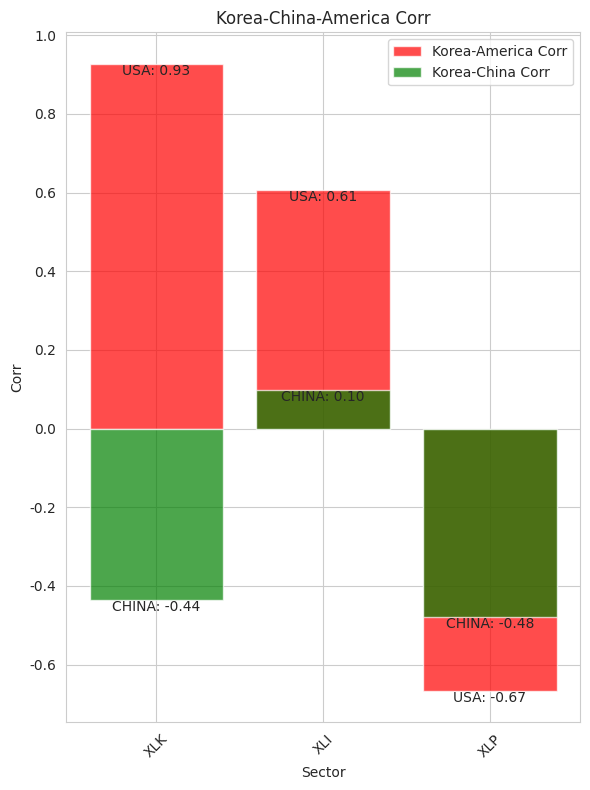

In [124]:
sectors = [item[0] for item in result2]
correlations = [item[1] for item in result2]
korea_us_correlations = [corr[0] for corr in correlations]
korea_china_correlations = [corr[1] for corr in correlations]

plt.figure(figsize=(6, 8))

plt.bar(sectors, korea_us_correlations, color='r', alpha=0.7, label='Korea-America Corr')
plt.bar(sectors, korea_china_correlations, color='g', alpha=0.7, label='Korea-China Corr')

plt.xlabel('Sector')
plt.ylabel('Corr')
plt.title('Korea-China-America Corr')
plt.legend(loc='upper right')

for i, (us_corr, china_corr) in enumerate(zip(korea_us_correlations, korea_china_correlations)):
    plt.text(i, us_corr, f'USA: {us_corr:.2f}', ha='center', va='top')
    plt.text(i, china_corr, f'CHINA: {china_corr:.2f}', ha='center', va='top')

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# 분석 결과
- 한국의 XLK(기술 관련 기업)은 미국 기술 관련 기업과 양의 상관관계를 보이고 중국 기술 관련 기업과 음의 상관관계를 가진다.

- 한국의 XLP(필수 소비재 관련 기업)은 미국, 중국 기업들의 주가들과 음의 상관관계를 가지는 것으로 분석되었다.